<a href="https://colab.research.google.com/github/hoanguyen071710/Airbnb-Athens-Data-Analysis/blob/main/Milestone_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Sections: 

Data Cleaning

EDA

Conclusion

Dashboards: https://public.tableau.com/views/AirbnbAthens/AirbnbAthens?:language=en-US&:display_count=n&:origin=viz_share_link

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Download the .gz file
# ! wget 'http://data.insideairbnb.com/greece/attica/athens/2022-09-20/data/listings.csv.gz' -P '/content/drive/MyDrive/Colab Notebooks/Milestone Project'
# ! wget 'http://data.insideairbnb.com/greece/attica/athens/2022-09-20/data/calendar.csv.gz' -P '/content/drive/MyDrive/Colab Notebooks/Milestone Project'
# ! wget 'http://data.insideairbnb.com/greece/attica/athens/2022-09-20/data/reviews.csv.gz' -P '/content/drive/MyDrive/Colab Notebooks/Milestone Project'


In [ ]:
import pandas as pd
import gzip
with gzip.open('/content/drive/MyDrive/Colab Notebooks/Milestone Project/calendar.csv.gz') as f:
  calendar = pd.read_csv(f)
with gzip.open('/content/drive/MyDrive/Colab Notebooks/Milestone Project/listings.csv.gz') as f:
  listings = pd.read_csv(f)
# with gzip.open('/content/drive/MyDrive/Colab Notebooks/Milestone Project/reviews.csv.gz') as f:
#   reviews = pd.read_csv(f)

# Reviews data with comments language identified
import os
path = '/content/drive/MyDrive/Colab Notebooks/Milestone Project'
os.chdir(path)
os.listdir()
reviews = pd.read_csv('reviews_1.csv')

/usr/local/lib/python3.8/dist-packages/IPython/core/interactiveshell.py:3326: DtypeWarning: Columns (0,1) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


# Data Cleaning

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
pd.set_option('max.columns',100)
pd.set_option('max.rows',500)

## Calendar dataset

In [ ]:
calendar

,listing_id,date,available,price,adjusted_price,minimum_nights,maximum_nights
0,21558402,2022-09-20,t,$49.00,$49.00,3.0,1125.0
1,21558402,2022-09-21,t,$49.00,$49.00,3.0,1125.0
2,21558402,2022-09-22,t,$49.00,$49.00,3.0,1125.0
3,21558402,2022-09-23,t,$49.00,$49.00,3.0,1125.0
4,21558402,2022-09-24,t,$49.00,$49.00,3.0,1125.0
...,...,...,...,...,...,...,...
4440220,700495919729691049,2023-09-15,t,$63.00,$63.00,1.0,365.0
4440221,700495919729691049,2023-09-16,t,$62.00,$62.00,1.0,365.0
4440222,700495919729691049,2023-09-17,t,$58.00,$58.00,1.0,365.0
4440223,700495919729691049,2023-09-18,t,$59.00,$59.00,1.0,365.0


In [ ]:
# Check duplicate
calendar[calendar.duplicated()]

,listing_id,date,available,price,adjusted_price,minimum_nights,maximum_nights


In [ ]:
calendar.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4440225 entries, 0 to 4440224
Data columns (total 7 columns):
 #   Column          Dtype  
---  ------          -----  
 0   listing_id      int64  
 1   date            object 
 2   available       object 
 3   price           object 
 4   adjusted_price  object 
 5   minimum_nights  float64
 6   maximum_nights  float64
dtypes: float64(2), int64(1), object(4)
memory usage: 237.1+ MB


In [ ]:
calendar.describe()

,listing_id,minimum_nights,maximum_nights
count,4.440225e+06,4.439850e+06,4.439850e+06
mean,1.374884e+17,3.631954e+00,8.449482e+02
std,2.643534e+17,2.120141e+01,4.349637e+02
min,1.059500e+04,1.000000e+00,1.000000e+00
25%,2.566423e+07,1.000000e+00,3.650000e+02
50%,3.892621e+07,2.000000e+00,1.125000e+03
75%,5.319995e+07,2.000000e+00,1.125000e+03
max,7.192475e+17,1.000000e+03,4.444000e+03


In [ ]:
# Check if listing_id values
calendar['listing_id'].unique()

array([          21558402,           42384166,           31100111, ...,
                 40384901,           27497739, 700495919729691049])

In [ ]:
# Missing listing_id
calendar['listing_id'].isnull().sum()

0

In [ ]:
calendar['date'] = pd.to_datetime(calendar['date'])

In [ ]:
calendar.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4440225 entries, 0 to 4440224
Data columns (total 7 columns):
 #   Column          Dtype         
---  ------          -----         
 0   listing_id      int64         
 1   date            datetime64[ns]
 2   available       object        
 3   price           object        
 4   adjusted_price  object        
 5   minimum_nights  float64       
 6   maximum_nights  float64       
dtypes: datetime64[ns](1), float64(2), int64(1), object(3)
memory usage: 237.1+ MB


In [ ]:
# Check if date values
calendar['date'].unique()

array(['2022-09-20T00:00:00.000000000', '2022-09-21T00:00:00.000000000',
       '2022-09-22T00:00:00.000000000', '2022-09-23T00:00:00.000000000',
       '2022-09-24T00:00:00.000000000', '2022-09-25T00:00:00.000000000',
       '2022-09-26T00:00:00.000000000', '2022-09-27T00:00:00.000000000',
       '2022-09-28T00:00:00.000000000', '2022-09-29T00:00:00.000000000',
       '2022-09-30T00:00:00.000000000', '2022-10-01T00:00:00.000000000',
       '2022-10-02T00:00:00.000000000', '2022-10-03T00:00:00.000000000',
       '2022-10-04T00:00:00.000000000', '2022-10-05T00:00:00.000000000',
       '2022-10-06T00:00:00.000000000', '2022-10-07T00:00:00.000000000',
       '2022-10-08T00:00:00.000000000', '2022-10-09T00:00:00.000000000',
       '2022-10-10T00:00:00.000000000', '2022-10-11T00:00:00.000000000',
       '2022-10-12T00:00:00.000000000', '2022-10-13T00:00:00.000000000',
       '2022-10-14T00:00:00.000000000', '2022-10-15T00:00:00.000000000',
       '2022-10-16T00:00:00.000000000', '2022-10-17

In [ ]:
# Check null date
calendar['date'].isnull().sum()

0

In [ ]:
# Check available values
calendar['available'].unique()

array(['t', 'f'], dtype=object)

In [ ]:
# Check available null
calendar['available'].isnull().sum()

0

In [ ]:
# Modify price and adjusted price to number
calendar['price'] = pd.to_numeric(calendar['price'].str.strip('$').str.replace(',',''))
calendar['adjusted_price'] = pd.to_numeric(calendar['adjusted_price'].str.strip('$').str.replace(',',''))

In [ ]:
# Check price null
calendar['price'].isnull().sum()

0

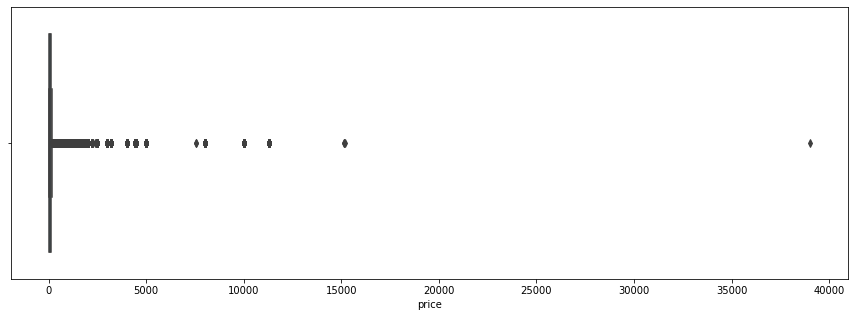

In [ ]:
# Check price outlier
plt.figure(figsize = (15,5))
sns.boxplot(data = calendar,
            x = 'price')

In [ ]:
q1_price = np.quantile(calendar['price'], 0.25)
q3_price = np.quantile(calendar['price'], 0.75)
iqr_price = q3_price - q1_price
lower_price = q1_price - 1.5 * iqr_price
upper_price = q3_price + 1.5 * iqr_price
upper_price_calendar = calendar[calendar['price'] > upper_price]
lower_price_calendar = calendar[calendar['price'] < lower_price]

In [ ]:
# Eliminate price outlier
calendar_new = calendar[(calendar['price'] > lower_price) & (calendar['price'] < upper_price)]

In [ ]:
calendar

,listing_id,date,available,price,adjusted_price,minimum_nights,maximum_nights
0,21558402,2022-09-20,t,49.0,49.0,3.0,1125.0
1,21558402,2022-09-21,t,49.0,49.0,3.0,1125.0
2,21558402,2022-09-22,t,49.0,49.0,3.0,1125.0
3,21558402,2022-09-23,t,49.0,49.0,3.0,1125.0
4,21558402,2022-09-24,t,49.0,49.0,3.0,1125.0
...,...,...,...,...,...,...,...
4440220,700495919729691049,2023-09-15,t,63.0,63.0,1.0,365.0
4440221,700495919729691049,2023-09-16,t,62.0,62.0,1.0,365.0
4440222,700495919729691049,2023-09-17,t,58.0,58.0,1.0,365.0
4440223,700495919729691049,2023-09-18,t,59.0,59.0,1.0,365.0


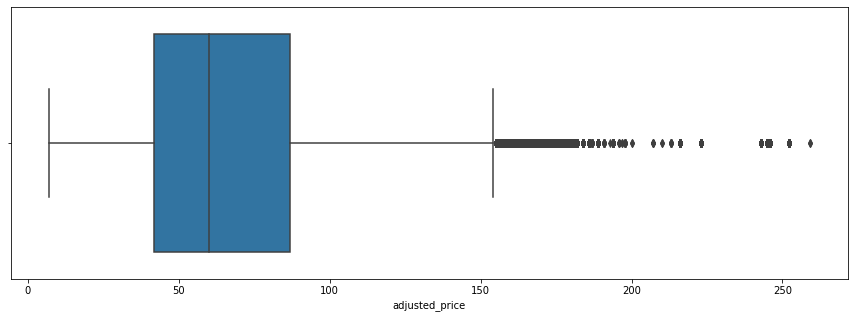

In [ ]:
# Check adjusted price outlier
plt.figure(figsize = (15,5))
sns.boxplot(data = calendar_new,
            x = 'adjusted_price')

In [ ]:
q1_adjusted_price = np.quantile(calendar_new['adjusted_price'], 0.25)
q3_adjusted_price = np.quantile(calendar_new['adjusted_price'], 0.75)
iqr_adjusted_price = q3_price - q1_price
lower_adjusted_price = q1_adjusted_price - 1.5 * iqr_adjusted_price
upper_adjusted_price = q3_adjusted_price + 1.5 * iqr_adjusted_price
upper_adjusted_price_calendar = calendar_new[calendar_new['adjusted_price'] > upper_adjusted_price]
lower_adjusted_price_calendar = calendar_new[calendar_new['adjusted_price'] < lower_adjusted_price]

In [ ]:
calendar_new = calendar_new[(calendar['adjusted_price'] > lower_adjusted_price) & (calendar_new['adjusted_price'] < upper_adjusted_price)]

<ipython-input-25-751c459bd21d>:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  calendar_new = calendar_new[(calendar['adjusted_price'] > lower_adjusted_price) & (calendar_new['adjusted_price'] < upper_adjusted_price)]


In [ ]:
calendar_new

,listing_id,date,available,price,adjusted_price,minimum_nights,maximum_nights
0,21558402,2022-09-20,t,49.0,49.0,3.0,1125.0
1,21558402,2022-09-21,t,49.0,49.0,3.0,1125.0
2,21558402,2022-09-22,t,49.0,49.0,3.0,1125.0
3,21558402,2022-09-23,t,49.0,49.0,3.0,1125.0
4,21558402,2022-09-24,t,49.0,49.0,3.0,1125.0
...,...,...,...,...,...,...,...
4440220,700495919729691049,2023-09-15,t,63.0,63.0,1.0,365.0
4440221,700495919729691049,2023-09-16,t,62.0,62.0,1.0,365.0
4440222,700495919729691049,2023-09-17,t,58.0,58.0,1.0,365.0
4440223,700495919729691049,2023-09-18,t,59.0,59.0,1.0,365.0


In [ ]:
# Check value minimum nights
calendar_new['minimum_nights'].unique()

array([   3.,    2.,    7.,    1.,    5.,   30.,    4.,   10.,   90.,
         60.,  168.,    6.,   14.,   25., 1000.,    8.,   19.,  444.,
         20.,   15.,  365.,  182.,  180.,   66.,   35.,  364.,   29.,
         28.,   40.,  100.,   11.,   21.,   12.,   27.,    9.,   45.,
         50.,   75.,   55.,  800.,   18.,  150.,  250.,  240.,   13.,
        120.,  201.,  200.,   24.,   26.,   36.,   nan,   84.,   31.,
        500.,   62.,   17.,  300.,   41.,  157.,  322.,   22.,  222.])

In [ ]:
# Check null minimum nights
print(calendar_new['minimum_nights'].isnull().sum())
calendar_new[calendar_new['minimum_nights'].isnull()]

34


,listing_id,date,available,price,adjusted_price,minimum_nights,maximum_nights
2068073,44523923,2023-09-03,f,35.0,35.0,NaN,NaN
2068074,44523923,2023-09-04,f,35.0,35.0,NaN,NaN
2068075,44523923,2023-09-05,f,35.0,35.0,NaN,NaN
2068076,44523923,2023-09-06,f,35.0,35.0,NaN,NaN
2068077,44523923,2023-09-07,f,35.0,35.0,NaN,NaN
2068078,44523923,2023-09-08,f,40.0,40.0,NaN,NaN
2068079,44523923,2023-09-09,f,40.0,40.0,NaN,NaN
2068080,44523923,2023-09-10,f,35.0,35.0,NaN,NaN
2068081,44523923,2023-09-11,f,35.0,35.0,NaN,NaN
2068082,44523923,2023-09-12,f,35.0,35.0,NaN,NaN


In [ ]:
# Drop missing minimum nights
calendar_new.drop(index = calendar_new[calendar_new['minimum_nights'].isnull()].index, inplace = True)

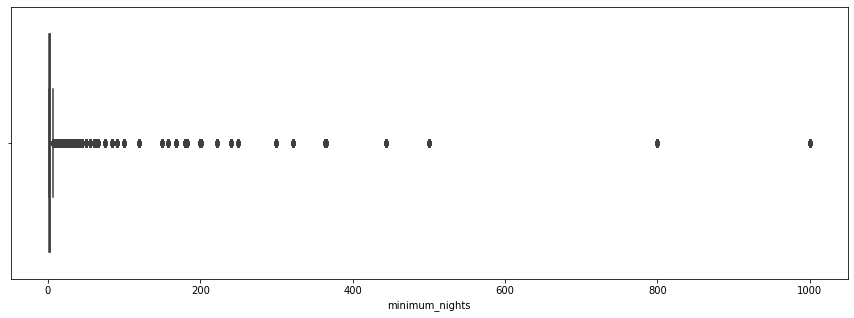

In [ ]:
# Check minimum nights outlier
plt.figure(figsize = (15,5))
sns.boxplot(data = calendar_new,
            x = 'minimum_nights')

In [ ]:
q1_minimum_nights = np.quantile(calendar_new['minimum_nights'], 0.25)
q3_minimum_nights = np.quantile(calendar_new['minimum_nights'], 0.75)
iqr_minimum_nights = q3_price - q1_price
lower_minimum_nights = q1_minimum_nights - 1.5 * iqr_minimum_nights
upper_minimum_nights = q3_minimum_nights + 1.5 * iqr_minimum_nights
upper_minimum_nights_calendar = calendar_new[calendar_new['minimum_nights'] > upper_minimum_nights]
lower_minimum_nights_calendar = calendar_new[calendar_new['minimum_nights'] < lower_minimum_nights]

In [ ]:
calendar_new = calendar_new[(calendar_new['minimum_nights'] > lower_minimum_nights) & (calendar_new['minimum_nights'] < upper_minimum_nights)]

In [ ]:
calendar_new

,listing_id,date,available,price,adjusted_price,minimum_nights,maximum_nights
0,21558402,2022-09-20,t,49.0,49.0,3.0,1125.0
1,21558402,2022-09-21,t,49.0,49.0,3.0,1125.0
2,21558402,2022-09-22,t,49.0,49.0,3.0,1125.0
3,21558402,2022-09-23,t,49.0,49.0,3.0,1125.0
4,21558402,2022-09-24,t,49.0,49.0,3.0,1125.0
...,...,...,...,...,...,...,...
4440220,700495919729691049,2023-09-15,t,63.0,63.0,1.0,365.0
4440221,700495919729691049,2023-09-16,t,62.0,62.0,1.0,365.0
4440222,700495919729691049,2023-09-17,t,58.0,58.0,1.0,365.0
4440223,700495919729691049,2023-09-18,t,59.0,59.0,1.0,365.0


In [ ]:
# Check maximum nights value
calendar_new['maximum_nights'].unique()

array([1.125e+03, 3.650e+02, 3.200e+01, 4.000e+00, 7.000e+00, 2.800e+01,
       6.650e+02, 3.100e+01, 1.000e+01, 1.124e+03, 3.000e+01, 5.000e+00,
       2.000e+00, 1.000e+00, 4.500e+01, 1.500e+01, 9.000e+01, 5.000e+01,
       7.300e+02, 3.000e+02, 1.500e+02, 3.660e+02, 2.200e+02, 8.000e+00,
       1.800e+02, 6.000e+01, 2.000e+02, 9.500e+01, 2.000e+01, 1.000e+03,
       2.500e+01, 6.000e+02, 7.200e+02, 2.900e+01, 1.200e+02, 3.600e+02,
       6.500e+01, 1.000e+02, 3.000e+00, 1.300e+01, 1.200e+01, 6.000e+00,
       2.600e+01, 2.400e+01, 2.300e+01, 2.100e+01, 1.900e+01, 1.800e+01,
       1.700e+01, 1.600e+01, 1.400e+01, 1.100e+01, 9.000e+00, 2.700e+01,
       2.200e+01, 2.500e+02, 4.000e+01, 3.640e+02, 3.100e+02, 9.900e+01,
       3.500e+02, 6.100e+01, 4.800e+02, 3.300e+01, 3.400e+01, 3.600e+01,
       3.500e+01, 5.000e+02, 4.700e+01, 4.000e+02, 6.200e+01, 4.400e+01,
       1.111e+03, 9.990e+02, 3.800e+01, 4.200e+02, 6.600e+01, 8.000e+02,
       2.300e+02, 8.000e+01, 1.850e+02, 9.100e+01, 

In [ ]:
# Check maximum nights null
calendar_new['maximum_nights'].isnull().sum()

0

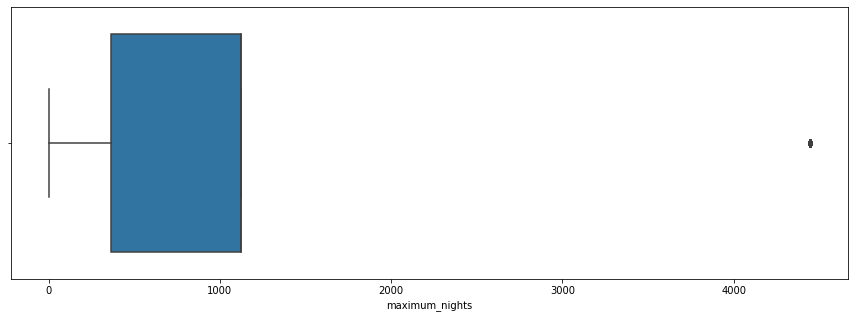

In [ ]:
# Check maximum nights outlier
plt.figure(figsize = (15,5))
sns.boxplot(data = calendar_new,
            x = 'maximum_nights')

In [ ]:
q1_maximum_nights = np.quantile(calendar_new['maximum_nights'], 0.25)
q3_maximum_nights = np.quantile(calendar_new['maximum_nights'], 0.75)
iqr_maximum_nights = q3_price - q1_price
lower_maximum_nights = q1_maximum_nights - 1.5 * iqr_maximum_nights
upper_maximum_nights = q3_maximum_nights + 1.5 * iqr_maximum_nights
upper_maximum_nights_calendar = calendar_new[calendar_new['maximum_nights'] > upper_maximum_nights]
lower_maximum_nights_calendar = calendar_new[calendar_new['maximum_nights'] < lower_maximum_nights]

In [ ]:
calendar_new = calendar_new[(calendar_new['maximum_nights'] > lower_maximum_nights) & (calendar_new['maximum_nights'] < upper_maximum_nights)]

In [ ]:
calendar_new

,listing_id,date,available,price,adjusted_price,minimum_nights,maximum_nights
0,21558402,2022-09-20,t,49.0,49.0,3.0,1125.0
1,21558402,2022-09-21,t,49.0,49.0,3.0,1125.0
2,21558402,2022-09-22,t,49.0,49.0,3.0,1125.0
3,21558402,2022-09-23,t,49.0,49.0,3.0,1125.0
4,21558402,2022-09-24,t,49.0,49.0,3.0,1125.0
...,...,...,...,...,...,...,...
4440220,700495919729691049,2023-09-15,t,63.0,63.0,1.0,365.0
4440221,700495919729691049,2023-09-16,t,62.0,62.0,1.0,365.0
4440222,700495919729691049,2023-09-17,t,58.0,58.0,1.0,365.0
4440223,700495919729691049,2023-09-18,t,59.0,59.0,1.0,365.0


In [ ]:
# Reset index
calendar_new = calendar_new.reset_index().drop(columns = 'index')

## Reviews dataset

In [ ]:
reviews.head()

,Unnamed: 0,listing_id,id,date,reviewer_id,reviewer_name,comments,comments_lang
0,0,10595,271535.0,2011-05-20,189305.0,Pamela,"The apartment was wonderful, fully equiped, be...",en
1,1,10595,1994237.0,2012-08-15,289831.0,Andrey,Emmanouil was an excellent host. He provided u...,en
2,2,10595,4678609.0,2013-05-20,2635427.0,Ahmet,"Manos is a very good host, he is kind and help...",en
3,3,10595,12502994.0,2014-05-04,2422327.0,Hema,"Our stay in Emmanouil home was comfortable, qu...",en
4,4,10595,19482948.0,2014-09-13,6737784.0,Mariana,Fantastic accommodation very well located to v...,en


In [ ]:
reviews.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 539226 entries, 0 to 539225
Data columns (total 8 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Unnamed: 0     539226 non-null  object 
 1   listing_id     537742 non-null  object 
 2   id             536698 non-null  float64
 3   date           536698 non-null  object 
 4   reviewer_id    536698 non-null  float64
 5   reviewer_name  536698 non-null  object 
 6   comments       536663 non-null  object 
 7   comments_lang  535654 non-null  object 
dtypes: float64(2), object(6)
memory usage: 32.9+ MB


In [ ]:
# Drop unamed col and filter only english comments
reviews = reviews.drop(columns = 'Unnamed: 0')
reviews = reviews[reviews['comments_lang'] == 'en']

In [ ]:
# Convert to date to datetime
reviews['date'] = pd.to_datetime(reviews['date'])

In [ ]:
reviews.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 387423 entries, 0 to 539224
Data columns (total 7 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   listing_id     387423 non-null  object        
 1   id             387423 non-null  float64       
 2   date           387423 non-null  datetime64[ns]
 3   reviewer_id    387423 non-null  float64       
 4   reviewer_name  387423 non-null  object        
 5   comments       387423 non-null  object        
 6   comments_lang  387423 non-null  object        
dtypes: datetime64[ns](1), float64(2), object(4)
memory usage: 23.6+ MB


In [ ]:
# Check duplicated
reviews.duplicated().sum()

0

In [ ]:
reviews.describe()

,id,reviewer_id
count,3.874230e+05,3.874230e+05
mean,2.136015e+17,1.159000e+08
std,2.838411e+17,1.153105e+08
min,6.231000e+04,4.400000e+01
25%,3.197535e+08,2.578974e+07
50%,5.599291e+08,7.447274e+07
75%,4.961383e+17,1.739677e+08
max,7.201162e+17,4.797781e+08


In [ ]:
# Check null columns
reviews.isnull().sum()

listing_id       0
id               0
date             0
reviewer_id      0
reviewer_name    0
comments         0
comments_lang    0
dtype: int64

In [ ]:
# Check listing_id values
reviews['listing_id'].unique()

array(['10595', '10990', '10993', ..., 712393787550426648,
       713483781786397793, 715001191350688368], dtype=object)

In [ ]:
# Check id values
reviews['id'].unique()

array([2.71535000e+05, 1.99423700e+06, 4.67860900e+06, ...,
       7.14323214e+17, 7.18597720e+17, 7.20039390e+17])

In [ ]:
# Check date values
reviews['date'].unique()

array(['2011-05-20T00:00:00.000000000', '2012-08-15T00:00:00.000000000',
       '2013-05-20T00:00:00.000000000', ...,
       '2020-05-26T00:00:00.000000000', '2020-04-24T00:00:00.000000000',
       '2020-05-06T00:00:00.000000000'], dtype='datetime64[ns]')

In [ ]:
# Check reviewer_id values
reviews['reviewer_id'].unique()

array([1.89305000e+05, 2.89831000e+05, 2.63542700e+06, ...,
       1.98895523e+08, 4.27109855e+08, 1.05898235e+08])

In [ ]:
# Check reviewer_name values
reviews['reviewer_name'].unique()

array(['Pamela', 'Andrey', 'Ahmet', ..., 'Shiyi', 'Mario Federico',
       'Σταυρουλα'], dtype=object)

In [ ]:
# Check comments null
reviews[reviews['comments'].isnull()]

,listing_id,id,date,reviewer_id,reviewer_name,comments,comments_lang


In [ ]:
# Check comments value
reviews['comments'].unique()

array(['The apartment was wonderful, fully equiped, beautiful decor, very comfortable. VERRY CLEAN!  Would stay there again or possibly another of host properties.  Close to Metro, markets, grocery store all conveniences.',
       "Emmanouil was an excellent host. He provided us with everything we need to make ourselves feel right at home. He gave us tips and directions to our destinations. Even prior to our trip, we kept in close contact and he gave us specific and easy instructions on how to get to his place. The place was spacious and comfortable. Everything was so neat and organized and it was always a great place to come back to after an adventurous day in Athens. Transportation was easily accessible and the place was located in a quiet neighborhood. Our stay was an amazing experience. We wouldn't hesitate to stay there again or recommend it to friends.",
       'Manos is a very good host, he is kind and helpful. His apartments are  spacious, clean and in a good location to explor

In [ ]:
# Drop null rows
reviews_new = reviews.drop(index = reviews[reviews['comments'].isnull()].index)
reviews_new.reset_index().drop(columns = 'index')

,listing_id,id,date,reviewer_id,reviewer_name,comments,comments_lang
0,10595,2.715350e+05,2011-05-20,189305.0,Pamela,"The apartment was wonderful, fully equiped, be...",en
1,10595,1.994237e+06,2012-08-15,289831.0,Andrey,Emmanouil was an excellent host. He provided u...,en
2,10595,4.678609e+06,2013-05-20,2635427.0,Ahmet,"Manos is a very good host, he is kind and help...",en
3,10595,1.250299e+07,2014-05-04,2422327.0,Hema,"Our stay in Emmanouil home was comfortable, qu...",en
4,10595,1.948295e+07,2014-09-13,6737784.0,Mariana,Fantastic accommodation very well located to v...,en
...,...,...,...,...,...,...,...
387418,712090391881598944,7.185970e+17,2022-09-18,198895523.0,Kate,Yoni was a great communicator and it was a smo...,en
387419,712393787550426648,7.157006e+17,2022-09-14,74684820.0,Evan,"What an amazing place!<br/>Brand new, fresh an...",en
387420,713483781786397793,7.143232e+17,2022-09-12,74684820.0,Evan,What an amazing place this is - excellent for ...,en
387421,715001191350688368,7.185977e+17,2022-09-18,427109855.0,Angus,Alexandros was an excellent host and really ac...,en


## Listings dataset

In [ ]:
listings.head()

,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,42384166,https://www.airbnb.com/rooms/42384166,20220920074636,2022-09-20,city scrape,Practical Apartment,The apartment just got renovated! The simple b...,NaN,https://a0.muscache.com/pictures/49b4fdd9-78ea...,337177735,https://www.airbnb.com/users/show/337177735,Dna,2020-02-18,NaN,NaN,within an hour,100%,100%,f,https://a0.muscache.com/im/pictures/user/ef435...,https://a0.muscache.com/im/pictures/user/ef435...,NaN,1.0,1.0,"['email', 'phone']",t,f,NaN,ΝΕΟΣ ΚΟΣΜΟΣ,NaN,37.94835,23.70327,Entire rental unit,Entire home/apt,2,NaN,1 bath,1.0,1.0,"[""First aid kit"", ""Shampoo"", ""Hangers"", ""TV"", ...",$35.00,2,7,2,2,1125,1125,2.0,1125.0,NaN,t,25,55,85,360,2022-09-20,30,21,3,2020-02-23,2022-09-01,4.37,4.33,4.63,4.80,4.67,4.47,4.40,00001374706,t,1,1,0,0,0.96
1,31100111,https://www.airbnb.com/rooms/31100111,20220920074636,2022-09-20,city scrape,Σπιτι 2ος κοντα στο ηλεκτρικο καλλιθεας Αττικης,Προσφατα ανακαινισμένο διαμερισμα ενος μεγαλου...,η γειτονια γενικα ειναι ήσυχη,https://a0.muscache.com/pictures/4be77902-7337...,90434832,https://www.airbnb.com/users/show/90434832,Dimos,2016-08-17,"Athens, Greece",ειμαι Ελληνας εχω οικογενεια και μου αρέσει να...,within a few hours,100%,0%,f,https://a0.muscache.com/im/pictures/user/9f4e7...,https://a0.muscache.com/im/pictures/user/9f4e7...,NaN,8.0,9.0,"['email', 'phone']",t,t,"Kallithea, Greece",ΠΕΤΡΑΛΩΝΑ,NaN,37.95633,23.69534,Entire rental unit,Entire home/apt,3,NaN,1 bath,1.0,3.0,"[""Hangers"", ""Bathtub"", ""Cooking basics"", ""Pati...",$22.00,7,90,7,7,1125,1125,7.0,1125.0,NaN,t,0,0,0,74,2022-09-20,6,0,0,2019-06-07,2020-10-06,3.67,3.50,3.33,3.83,4.00,4.17,3.83,NaN,t,3,3,0,0,0.15
2,36967991,https://www.airbnb.com/rooms/36967991,20220920074636,2022-09-20,city scrape,Lux Studio 1,5 λεπτά από τον ηλεκτρικό σταθμό Καλλιθέας. Εύ...,Ευχάριστη γειτονιά με έντονο ελληνικό χαρακτήρ...,https://a0.muscache.com/pictures/c19a4a64-da8b...,277896558,https://www.airbnb.com/users/show/277896558,Kalliopi,2019-07-21,"Alimos, Greece",NaN,within an hour,100%,96%,t,https://a0.muscache.com/im/pictures/user/ded7c...,https://a0.muscache.com/im/pictures/user/ded7c...,NaN,2.0,2.0,"['email', 'phone']",t,t,"Kallithea, Greece",ΠΕΤΡΑΛΩΝΑ,NaN,37.95672,23.69589,Entire rental unit,Entire home/apt,2,NaN,1 bath,1.0,1.0,"[""Air conditioning"", ""Dishes and silverware"", ...",$36.00,2,1125,2,2,1125,1125,2.0,1125.0,NaN,t,2,20,50,325,2022-09-20,112,15,1,2019-07-26,2022-09-08,4.85,4.91,4.90,4.85,4.90,4.78,4.79,00000770524,t,2,2,0,0,2.91
3,638115689290380035,https://www.airbnb.com/rooms/638115689290380035,20220920074636,2022-09-20,city scrape,Όμορφο διαμέρισμα στον Άγιο Ιωάννη Ρέντη,Απολαύστε μια εμπειρία γεμάτη στιλ σε αυτόν το...,N

In [ ]:
listings.shape

(12165, 75)

In [ ]:
listings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12165 entries, 0 to 12164
Data columns (total 75 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            12165 non-null  int64  
 1   listing_url                                   12165 non-null  object 
 2   scrape_id                                     12165 non-null  int64  
 3   last_scraped                                  12165 non-null  object 
 4   source                                        12165 non-null  object 
 5   name                                          12162 non-null  object 
 6   description                                   12098 non-null  object 
 7   neighborhood_overview                         7761 non-null   object 
 8   picture_url                                   12165 non-null  object 
 9   host_id                                       12165 non-null 

In [ ]:
# Convert to right data types of several columns
listings['last_scraped'] = pd.to_datetime(listings['last_scraped'])
listings['host_since'] = pd.to_datetime(listings['host_since'])
listings['host_response_rate'] = listings['host_response_rate'].str.strip('%').astype('float')
listings['host_acceptance_rate'] = listings['host_acceptance_rate'].str.strip('%').astype('float')
listings['price'] = listings['price'].str.strip('$').str.replace(',','').astype('float')
listings['calendar_last_scraped'] = pd.to_datetime(listings['calendar_last_scraped'])
listings['first_review'] = pd.to_datetime(listings['first_review'])
listings['last_review'] = pd.to_datetime(listings['last_review'])

In [ ]:
# Check if columns with high missing values, threshold = 30%
miss_series = listings.isnull().sum() / listings.shape[0] * 100
miss_series[miss_series > 30]

neighborhood_overview            36.202219
host_about                       45.811755
host_neighbourhood               40.583642
neighbourhood                    36.202219
neighbourhood_group_cleansed    100.000000
bathrooms                       100.000000
calendar_updated                100.000000
dtype: float64

In [ ]:
# Drop too columns with high missing percentage
listings_new = listings.drop(columns = miss_series[miss_series > 30].index)

In [ ]:
listings_new.head()

,id,listing_url,scrape_id,last_scraped,source,name,description,picture_url,host_id,host_url,host_name,host_since,host_location,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,42384166,https://www.airbnb.com/rooms/42384166,20220920074636,2022-09-20,city scrape,Practical Apartment,The apartment just got renovated! The simple b...,https://a0.muscache.com/pictures/49b4fdd9-78ea...,337177735,https://www.airbnb.com/users/show/337177735,Dna,2020-02-18,NaN,within an hour,100.0,100.0,f,https://a0.muscache.com/im/pictures/user/ef435...,https://a0.muscache.com/im/pictures/user/ef435...,1.0,1.0,"['email', 'phone']",t,f,ΝΕΟΣ ΚΟΣΜΟΣ,37.94835,23.70327,Entire rental unit,Entire home/apt,2,1 bath,1.0,1.0,"[""First aid kit"", ""Shampoo"", ""Hangers"", ""TV"", ...",35.0,2,7,2,2,1125,1125,2.0,1125.0,t,25,55,85,360,2022-09-20,30,21,3,2020-02-23,2022-09-01,4.37,4.33,4.63,4.80,4.67,4.47,4.40,00001374706,t,1,1,0,0,0.96
1,31100111,https://www.airbnb.com/rooms/31100111,20220920074636,2022-09-20,city scrape,Σπιτι 2ος κοντα στο ηλεκτρικο καλλιθεας Αττικης,Προσφατα ανακαινισμένο διαμερισμα ενος μεγαλου...,https://a0.muscache.com/pictures/4be77902-7337...,90434832,https://www.airbnb.com/users/show/90434832,Dimos,2016-08-17,"Athens, Greece",within a few hours,100.0,0.0,f,https://a0.muscache.com/im/pictures/user/9f4e7...,https://a0.muscache.com/im/pictures/user/9f4e7...,8.0,9.0,"['email', 'phone']",t,t,ΠΕΤΡΑΛΩΝΑ,37.95633,23.69534,Entire rental unit,Entire home/apt,3,1 bath,1.0,3.0,"[""Hangers"", ""Bathtub"", ""Cooking basics"", ""Pati...",22.0,7,90,7,7,1125,1125,7.0,1125.0,t,0,0,0,74,2022-09-20,6,0,0,2019-06-07,2020-10-06,3.67,3.50,3.33,3.83,4.00,4.17,3.83,NaN,t,3,3,0,0,0.15
2,36967991,https://www.airbnb.com/rooms/36967991,20220920074636,2022-09-20,city scrape,Lux Studio 1,5 λεπτά από τον ηλεκτρικό σταθμό Καλλιθέας. Εύ...,https://a0.muscache.com/pictures/c19a4a64-da8b...,277896558,https://www.airbnb.com/users/show/277896558,Kalliopi,2019-07-21,"Alimos, Greece",within an hour,100.0,96.0,t,https://a0.muscache.com/im/pictures/user/ded7c...,https://a0.muscache.com/im/pictures/user/ded7c...,2.0,2.0,"['email', 'phone']",t,t,ΠΕΤΡΑΛΩΝΑ,37.95672,23.69589,Entire rental unit,Entire home/apt,2,1 bath,1.0,1.0,"[""Air conditioning"", ""Dishes and silverware"", ...",36.0,2,1125,2,2,1125,1125,2.0,1125.0,t,2,20,50,325,2022-09-20,112,15,1,2019-07-26,2022-09-08,4.85,4.91,4.90,4.85,4.90,4.78,4.79,00000770524,t,2,2,0,0,2.91
3,638115689290380035,https://www.airbnb.com/rooms/638115689290380035,20220920074636,2022-09-20,city scrape,Όμορφο διαμέρισμα στον Άγιο Ιωάννη Ρέντη,Απολαύστε μια εμπειρία γεμάτη στιλ σε αυτόν το...,https://a0.muscache.com/pictures/miso/Hosting-...,461642253,https://www.airbnb.com/users/show/461642253,Αικατερινη,2022-05-30,NaN,within a few hours,100.0,NaN,f,https://a0.muscache.com/defaults/user_pic-50x5...,https://a0.muscache.com/defaults/user_pic-225x...,1.0,1.0,"['email', 'phone']",f,f,ΡΟΥΦ,37.96567,23.67686,Entire condo,Entire home/apt,4,2 baths,2

In [ ]:
# Remove unnecessary columns
remove_col = ['listing_url', 'scrape_id', 'source', 'picture_url', 'host_url', 'host_name', 'host_location', 
              'host_thumbnail_url', 'host_picture_url', 'calendar_last_scraped', 'name',
              'host_total_listings_count',
              'minimum_minimum_nights',	'maximum_minimum_nights',	'minimum_maximum_nights',	'maximum_maximum_nights',
              'availability_30',	'availability_60',	'availability_90', 'calendar_last_scraped', 
              'number_of_reviews_ltm',	'number_of_reviews_l30d', 'first_review',	'last_review', 'license',
              'host_listings_count', 'host_total_listings_count']
listings_new = listings_new.drop(columns = remove_col)

In [ ]:
listings_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12165 entries, 0 to 12164
Data columns (total 43 columns):
 #   Column                                        Non-Null Count  Dtype         
---  ------                                        --------------  -----         
 0   id                                            12165 non-null  int64         
 1   last_scraped                                  12165 non-null  datetime64[ns]
 2   description                                   12098 non-null  object        
 3   host_id                                       12165 non-null  int64         
 4   host_since                                    12164 non-null  datetime64[ns]
 5   host_response_time                            10823 non-null  object        
 6   host_response_rate                            10823 non-null  float64       
 7   host_acceptance_rate                          10960 non-null  float64       
 8   host_is_superhost                             12165 non-null  obje

In [ ]:
# Check duplicated
listings_new.duplicated().sum()

0

In [ ]:
listings_new.describe()

,id,host_id,host_response_rate,host_acceptance_rate,latitude,longitude,accommodates,bedrooms,beds,price,minimum_nights,maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,availability_365,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
count,1.216500e+04,1.216500e+04,10823.000000,10960.000000,12165.000000,12165.000000,12165.000000,11232.000000,12038.000000,12165.000000,12165.000000,12165.000000,12165.000000,12165.000000,12165.000000,12165.000000,10192.000000,10166.000000,10166.000000,10166.000000,10166.000000,10166.000000,10165.000000,12165.000000,12165.000000,12165.000000,12165.000000,10192.000000
mean,1.374884e+17,1.727609e+08,95.216114,92.226734,37.979225,23.732116,3.721496,1.473202,2.084649,94.759885,3.532840,673.651952,3.631360,844.999334,233.584299,44.118208,4.729789,4.794194,4.758924,4.858378,4.851015,4.723684,4.722348,13.376326,12.114838,1.089848,0.055487,1.738131
std,2.643642e+17,1.421454e+08,16.857463,20.616016,0.015292,0.015602,1.940974,0.787780,1.396739,225.255583,21.634505,484.539248,20.782301,430.849931,124.293804,74.789939,0.482377,0.396096,0.428121,0.350771,0.377272,0.413774,0.414289,32.280342,31.894310,4.839149,0.741473,1.757279
min,1.059500e+04,3.717700e+04,0.000000,0.000000,37.934830,23.669050,1.000000,1.000000,1.000000,10.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.010000
25%,2.566423e+07,4.703835e+07,100.000000,97.000000,37.967859,23.723510,2.000000,1.000000,1.000000,45.000000,1.000000,95.000000,1.000000,365.000000,132.000000,2.000000,4.670000,4.770000,4.710000,4.860000,4.860000,4.630000,4.670000,1.000000,1.000000,0.000000,0.000000,0.440000
50%,3.892621e+07,1.471481e+08,100.000000,100.000000,37.978000,23.729800,4.000000,1.000000,2.000000,64.000000,2.000000,1125.000000,2.000000,1125.000000,288.000000,13.000000,4.860000,4.900000,4.890000,4.950000,4.960000,4.850000,4.820000,3.000000,2.000000,0.000000,0.000000,1.145000
75%,5.319995e+07,2.591740e+08,100.000000,100.000000,37.987970,23.739120,4.000000,2.000000,3.000000,100.000000,2.000000,1125.000000,2.500000,1125.000000,342.000000,51.000000,4.980000,5.000000,5.000000,5.000000,5.000000,4.990000,4.930000,11.000000,9.000000,0.000000,0.000000,2.480000
max,7.192475e+17,4.801135e+08,100.000000,100.000000,38.045970,23.806610,16.000000,14.000000,30.000000,8000.000000,1000.000000,4444.000000,1000.000000,4444.000000,365.000000,798.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,222.000000,222.000000,53.000000,14.000000,18.860000


In [ ]:
# Check null values
listings_new.isnull().sum()

id                                                 0
last_scraped                                       0
description                                       67
host_id                                            0
host_since                                         1
host_response_time                              1342
host_response_rate                              1342
host_acceptance_rate                            1205
host_is_superhost                                  0
host_verifications                                 0
host_has_profile_pic                               1
host_identity_verified                             1
neighbourhood_cleansed                             0
latitude                                           0
longitude                                          0
property_type                                      0
room_type                                          0
accommodates                                       0
bathrooms_text                                

In [ ]:
# Check id values
listings_new['id'].unique()

array([          42384166,           31100111,           36967991, ...,
       695455925106775057, 696025981798812717,           38177858])

In [ ]:
# Check last_scraped values
listings_new['last_scraped'].unique()

array(['2022-09-20T00:00:00.000000000', '2022-10-02T00:00:00.000000000'],
      dtype='datetime64[ns]')

In [ ]:
# Fill description null with 'No description' for later text cleaning
listings_new['description'] = listings_new['description'].fillna('No description')

In [ ]:
# Check host_since
listings_new['host_since'].unique()

array(['2020-02-18T00:00:00.000000000', '2016-08-17T00:00:00.000000000',
       '2019-07-21T00:00:00.000000000', ...,
       '2022-06-25T00:00:00.000000000', '2017-01-23T00:00:00.000000000',
       '2015-07-19T00:00:00.000000000'], dtype='datetime64[ns]')

In [ ]:
# Check host_since null
listings_new[listings_new['host_since'].isnull()]

,id,last_scraped,description,host_id,host_since,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,has_availability,availability_365,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
11746,9572064,2022-09-20,We welcome you in Athens. The fully furnished ...,49545799,NaT,NaN,NaN,NaN,f,None,NaN,NaN,ΠΕΤΡΑΛΩΝΑ,37.95843,23.70366,Entire rental unit,Entire home/apt,3,1 bath,1.0,2.0,"[""Essentials"", ""Air conditioning"", ""Kitchen"", ...",50.0,2,30,2.0,30.0,t,365,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,t,1,1,0,0,NaN


In [ ]:
# Drop host_name null because rows too little info
listings_new = listings_new.drop(index = listings_new[listings_new['host_since'].isnull()].index)

In [ ]:
# Check host response time
listings_new['host_response_time'].unique()

array(['within an hour', 'within a few hours', 'a few days or more',
       'within a day', nan], dtype=object)

In [ ]:
# Check 'host_response_time' null
listings_new[listings_new['host_response_time'].isnull()]

,id,last_scraped,description,host_id,host_since,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,has_availability,availability_365,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
15,13091404,2022-09-20,A double floor apartment and recently renovate...,66223092,2016-04-07,NaN,NaN,NaN,f,"['email', 'phone']",t,f,ΓΟΥΔΙ,37.972530,23.776070,Entire home,Entire home/apt,5,3 baths,2.0,2.0,"[""First aid kit"", ""Shampoo"", ""Hangers"", ""TV"", ...",89.0,3,7,3.0,7.0,t,358,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,f,1,1,0,0,NaN
26,23960798,2022-09-20,"Studio apartment, recently renovated,<br />clo...",180173096,2018-03-23,NaN,NaN,NaN,f,"['email', 'phone']",t,f,ΠΕΤΡΑΛΩΝΑ,37.954050,23.700570,Entire rental unit,Entire home/apt,2,1 bath,1.0,1.0,"[""Hangers"", ""Host greets you"", ""Cooking basics...",100.0,3,1124,3.0,1124.0,t,323,43,4.51,4.51,4.65,4.74,4.77,4.65,4.67,t,1,1,0,0,0.79
27,33926641,2022-09-20,Comfy apartment in Egaleo! 7 minutes away on f...,189692405,2018-05-15,NaN,NaN,0.0,f,"['email', 'phone']",t,t,ΒΟΤΑΝΙΚΟΣ,38.000320,23.682250,Entire rental unit,Entire home/apt,4,1 bath,1.0,1.0,"[""Air conditioning"", ""Dishes and silverware"", ...",50.0,1,30,1.0,1125.0,t,138,8,5.00,5.00,4.88,5.00,5.00,5.00,5.00,t,7,7,0,0,0.20
32,583278256140676919,2022-09-20,"Διαμέρισμα 80τμ, 3ου ορόφου, 2υπνοδωμάτια, 1 μ...",449717891,2022-03-15,NaN,NaN,NaN,f,['phone'],f,f,ΑΝΩ ΚΥΨΕΛΗ,38.010780,23.754900,Entire condo,Entire home/apt,2,1.5 baths,1.0,2.0,"[""Long term stays allowed"", ""TV"", ""Wifi"", ""Kit...",80.0,5,30,5.0,30.0,t,362,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,f,1,1,0,0,NaN
35,35308390,2022-09-20,No description,265821661,2019-06-02,NaN,NaN,NaN,f,"['email', 'phone']",t,f,ΝΕΟΣ ΚΟΣΜΟΣ,37.950330,23.706550,Entire rental unit,Entire home/apt,3,1 bath,1.0,1.0,"[""Air conditioning"", ""Elevator"", ""TV"", ""Essent...",30.0,2,5,2.0,5.0,t,262,2,5.00,5.00,5.00,5.00,5.00,5.00,5.00,f,1,1,0,0,0.05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12143,37271821,2022-09-20,The house is located on a convenient and very ...,279765574,2019-07-27,NaN,NaN,100.0,f,"['email', 'phone']",t,f,ΠΕΤΡΑΛΩΝΑ,37.960293,23.705757,Entire rental unit,Entire home/apt,2,1 bath,1.0,1.0,"[""Hot water kettle"", ""Shower gel"", ""Hangers"", ...",26.0,2,1125,2.0,1125.0,t,0,3,5.00,5.00,4.67,5.00,5.00,5.00,5.00,f,1,1,0,0,0.44
12146,37867505,2022-09-20,"A beautiful, self-contained, eco-friendly loft...",44165299,2015-09-14,NaN,NaN,NaN,f,"['email', 'phone']",t,t,ΙΛΙΣΙΑ,37.972250,23.751460,Entire loft,Entire home/apt,2,1 bath,1.0,1.0,"[""Shower gel"", ""Hangers"", ""Private entrance"", ...",100.0,3,1125,3.0,1125.0,t,0,15,4.73,4.87,4.53,5.00,5.00,4.60,4.60,f,1,1,0,0,0.41
12150,39961167,2022-09-20,Modern and Quiet apartment on the 3th floor (4...,466048710,2022-06-25,NaN,NaN,NaN,f,"['email', 'phone']",f,f,ΠΑΓΚΡΑΤΙ,37.971120,23.751300,Entire rental unit,Entire home/apt,4,1 bath,1.0,1.0,"[""Hot water kettle"", ""Shower gel"", ""Hangers"", ...",90.0,3,1125,3.0,1125.0,t,1,1,5.00,5.00,5.00,5.00,5.00,5.00,5.00,t,1,1,0,0,0.06
12163,696025981798812717,2022-09-20,Stay and enjoy this spacious space located in ...,475401320,2022-08-17,NaN,NaN,NaN,f,"['email', 'phone']",t,f,ΡΙΖΟΥΠΟΛΗ,38.030530,23.760580,Entire condo,Entire home/apt,3,1 bath,1.0,2.0,"[""Hot water kettle"", ""Shower gel"", ""Han

In [ ]:
# Check if 'host_response_rate' is null where 'host_response_time' is null
listings_new[listings_new['host_response_time'].isnull()]['host_response_rate'].unique()

array([nan])

In [ ]:
# Due to host_response_time' is all null, check next highest correlated, host_acceptance_rate
listings_new[listings_new['host_response_time'].isnull()]['host_acceptance_rate'].unique()

array([ nan,   0., 100.,  67.,  89.,  77.,  56.,  50.,  85.,  33.,  76.,
        75.,  60.,  91.,  88.,  83.,  80.,  98.,  86.,  79.,  22.,  96.,
        97.,  82.])

In [ ]:
listings_new.corr()

,id,host_id,host_response_rate,host_acceptance_rate,latitude,longitude,accommodates,bedrooms,beds,price,minimum_nights,maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,availability_365,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
id,1.000000,0.327546,0.063676,0.098465,0.016124,-0.024601,-0.034118,-0.032097,-0.045728,-0.022141,-0.028950,-0.242418,-0.029858,-0.255893,0.149425,-0.268865,-0.031836,-0.070383,-0.049368,-0.058089,-0.061418,-0.038500,-0.041516,0.045967,0.046501,0.012749,-0.026100,0.225030
host_id,0.327546,1.000000,-0.015513,0.082306,0.000806,-0.054051,-0.067197,-0.069675,-0.040978,0.014110,-0.040854,-0.098681,-0.042636,-0.072520,0.116615,-0.237916,-0.071148,-0.104978,-0.080211,-0.076431,-0.113519,-0.065074,-0.076120,-0.215637,-0.209782,-0.063608,0.072352,0.073466
host_response_rate,0.063676,-0.015513,1.000000,0.521214,-0.034450,-0.052771,0.015424,-0.023419,-0.015802,0.005508,-0.041631,-0.012971,-0.045466,0.061062,0.006275,0.127658,0.239396,0.202547,0.180807,0.213385,0.210320,0.146748,0.175265,0.061820,0.062136,0.003776,-0.010519,0.155430
host_acceptance_rate,0.098465,0.082306,0.521214,1.000000,-0.053206,-0.057189,0.027342,-0.029593,-0.011520,0.018867,-0.054478,-0.000168,-0.057307,0.093652,0.032331,0.134078,0.030821,0.005047,0.010933,-0.005707,-0.007587,-0.002932,-0.012704,0.111371,0.111808,0.001643,-0.006930,0.223718
latitude,0.016124,0.000806,-0.034450,-0.053206,1.000000,0.264474,-0.037390,-0.004058,-0.007736,-0.044373,0.016302,-0.013866,0.014966,-0.000707,-0.020577,-0.077650,-0.062540,-0.039100,-0.062186,-0.029795,-0.027612,-0.224527,-0.048536,-0.022499,-0.020511,-0.009940,-0.003966,-0.074467
longitude,-0.024601,-0.054051,-0.052771,-0.057189,0.264474,1.000000,-0.031495,-0.010577,-0.021068,-0.017414,0.020724,-0.014401,0.023110,-0.006373,-0.026790,-0.070467,-0.008752,-0.008668,-0.022417,-0.000437,0.004514,0.055686,-0.021637,-0.030052,-0.026172,-0.023207,-0.024527,-0.118169
accommodates,-0.034118,-0.067197,0.015424,0.027342,-0.037390,-0.031495,1.000000,0.763890,0.790508,0.142969,-0.015166,0.064575,-0.016449,0.002721,0.016276,0.019700,0.011492,0.018978,0.004230,0.013129,0.016202,0.017926,0.022786,0.031938,0.049271,-0.098146,-0.049586,-0.033656
bedrooms,-0.032097,-0.069675,-0.023419,-0.029593,-0.004058,-0.010577,0.763890,1.000000,0.744377,0.158098,-0.002128,0.048404,-0.002047,-0.019104,-0.023861,-0.022630,0.000927,0.004613,-0.008636,0.000770,0.008970,0.000686,0.020889,0.049637,0.058963,-0.032706,-0.045185,-0.054766
beds,-0.045728,-0.040978,-0.015802,-0.011520,-0.007736,-0.021068,0.790508,0.744377,1.000000,0.123731,-0.009494,0.030440,-0.010266,-0.009675,-0.009125,-0.012030,-0.016518,-0.012932,-0.029412,-0.005631,-0.000022,-0.016215,-0.001665,-0.000830,0.006855,-0.050949,0.049154,-0.052698
price,-0.022141,0.014110,0.005508,0.018867,-0.044373,-0.017414,0.142969,0.158098,0.123731,1.000000,0.038424,0.045256,0.039927,-0.007264,0.046752,-0.037363,0.048377,0.039764,0.058611,0.028613,0.025852,0.076515,0.027046,0.010456,-0.004104,0.091338,-0.019517,-0.033546


In [ ]:
listings_new[(listings_new['host_response_time'].isnull()) & (listings_new['host_acceptance_rate'].notnull())]

,id,last_scraped,description,host_id,host_since,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,has_availability,availability_365,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
27,33926641,2022-09-20,Comfy apartment in Egaleo! 7 minutes away on f...,189692405,2018-05-15,NaN,NaN,0.0,f,"['email', 'phone']",t,t,ΒΟΤΑΝΙΚΟΣ,38.000320,23.682250,Entire rental unit,Entire home/apt,4,1 bath,1.0,1.0,"[""Air conditioning"", ""Dishes and silverware"", ...",50.0,1,30,1.0,1125.0,t,138,8,5.00,5.00,4.88,5.00,5.00,5.00,5.00,t,7,7,0,0,0.20
48,23395508,2022-09-20,"A beautiful, small apartment 20m2 in Northern ...",171064973,2018-02-01,NaN,NaN,0.0,f,"['email', 'phone']",t,t,ΠΕΝΤΑΓΩΝΟ,38.012740,23.793610,Entire rental unit,Entire home/apt,2,1 bath,NaN,1.0,"[""Hangers"", ""Carbon monoxide alarm"", ""Cooking ...",50.0,10,30,10.0,30.0,t,177,1,0.00,NaN,NaN,NaN,NaN,NaN,NaN,f,1,1,0,0,0.02
51,12864315,2022-09-20,Πλήρως ανακαινισμένο ισόγειο διαμέρισμα 64 τμ ...,70327674,2016-05-04,NaN,NaN,100.0,f,"['email', 'phone']",t,t,ΑΚΑΔΗΜΙΑ ΠΛΑΤΩΝΟΣ,38.007770,23.689930,Entire rental unit,Entire home/apt,2,1 bath,1.0,1.0,"[""Hangers"", ""Host greets you"", ""Cooking basics...",49.0,2,1125,2.0,1125.0,t,230,34,4.97,5.00,5.00,5.00,5.00,4.82,4.85,f,1,1,0,0,0.44
57,20522919,2022-09-20,"The room is part of a beautiful, all-day sunny...",9569765,2013-10-22,NaN,NaN,0.0,f,"['email', 'phone']",t,t,ΓΟΥΔΙ,37.977180,23.774250,Private room in rental unit,Private room,1,1.5 shared baths,1.0,1.0,"[""Breakfast"", ""Long term stays allowed"", ""Hang...",25.0,90,360,90.0,360.0,t,274,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,t,1,0,1,0,NaN
124,34624727,2022-09-20,A ballet/dance/pilates school which is a fully...,128087371,2017-04-29,NaN,NaN,67.0,f,"['email', 'phone']",t,t,ΝΕΟΣ ΚΟΣΜΟΣ,37.957370,23.713320,Entire rental unit,Entire home/apt,3,1 bath,1.0,2.0,"[""First aid kit"", ""Shampoo"", ""Hangers"", ""Long ...",80.0,1,1125,1.0,1125.0,t,180,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,t,1,1,0,0,NaN
141,9340986,2022-09-20,<b>The space</b><br />A pleasant renovated 60m...,43425514,2015-09-05,NaN,NaN,0.0,f,"['email', 'phone']",t,f,ΓΟΥΔΙ,37.979280,23.758300,Entire rental unit,Entire home/apt,4,1 bath,1.0,2.0,"[""Air conditioning"", ""Elevator"", ""First aid ki...",35.0,2,1125,2.0,1125.0,t,262,28,4.92,4.92,5.00,5.00,5.00,4.88,4.88,f,1,1,0,0,0.34
144,45723464,2022-09-20,Το διαμέρισμα βρίσκεται σε πολύ καλη τοποθεσία...,297541778,2019-09-24,NaN,NaN,100.0,f,"['email', 'phone']",t,f,ΓΟΥΒΑ,37.961770,23.746360,Entire rental unit,Entire home/apt,4,1 bath,2.0,2.0,"[""First aid kit"", ""Shampoo"", ""Hangers"", ""Long ...",25.0,1,1125,1.0,1125.0,t,19,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,t,1,1,0,0,NaN
157,27331084,2022-09-20,A comfortable apartment 33mc. on the 6th floo...,205943990,2018-07-29,NaN,NaN,100.0,f,"['email', 'phone']",t,f,ΓΟΥΒΑ,37.961000,23.747270,Entire rental unit,Entire home/apt,2,1 bath,NaN,1.0,"[""Hangers"", ""Cooking basics"", ""Washer"", ""Patio...",57.0,2,60,2.0,1125.0,t,169,2,4.50,5.00,4.50,5.00,4.50,4.50,4.00,t,1,1,0,0,0.05
208,19671051,2022-09-20,"A modern apartment, fully renovated at the sum...",138509301,2017-07-04,NaN,NaN,100.0,f,"['email', 'phone']",t,f,ΝΕΟΣ ΚΟΣΜΟΣ,37.951010,23.698400,Entire rental unit,Entire home/apt,4,1 bath,1.0,1.0,"[""Shampoo"", ""Hangers"", ""Long term stays allowe...",50.0,1,1125,1.0,1125.0,t,2,23,4.96,4.91,5.00,5.00,5.00,4.59,4.73,t,1,1,0,0,0.37
274,567938,2022-09-20,<b>T

In [ ]:
# Strong correlation between host_response_time and host_response rate
time_rate_dict = listings_new.groupby('host_response_time')['host_acceptance_rate'].mean().to_dict()
def impute_missing_response_time(row):
  global time_rate_dict
  print_key = ''
  value = row['host_acceptance_rate']
  for key, val in time_rate_dict.items():
    if value < val:
      print_key = key
      break
  if print_key == '':
    return 'within an hour'
  else:
    return print_key

listings_new[(listings_new['host_response_time'].isnull()) & (listings_new['host_acceptance_rate'].notnull())]['host_response_time'] = listings_new[(listings_new['host_response_time'].isnull()) & (listings_new['host_acceptance_rate'].notnull())].apply(impute_missing_response_time, axis = 1)

<ipython-input-81-9b9e73327b2d>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  listings_new[(listings_new['host_response_time'].isnull()) & (listings_new['host_acceptance_rate'].notnull())]['host_response_time'] = listings_new[(listings_new['host_response_time'].isnull()) & (listings_new['host_acceptance_rate'].notnull())].apply(impute_missing_response_time, axis = 1)


In [ ]:
listings_new.corr()['host_response_rate']

id                                              0.063676
host_id                                        -0.015513
host_response_rate                              1.000000
host_acceptance_rate                            0.521214
latitude                                       -0.034450
longitude                                      -0.052771
accommodates                                    0.015424
bedrooms                                       -0.023419
beds                                           -0.015802
price                                           0.005508
minimum_nights                                 -0.041631
maximum_nights                                 -0.012971
minimum_nights_avg_ntm                         -0.045466
maximum_nights_avg_ntm                          0.061062
availability_365                                0.006275
number_of_reviews                               0.127658
review_scores_rating                            0.239396
review_scores_accuracy         

In [ ]:
# Check response rate value
listings_new[(listings_new['host_response_rate'].isnull()) & (listings_new['host_acceptance_rate'].notnull()) & 
             (listings_new['host_response_time'].notnull())]

,id,last_scraped,description,host_id,host_since,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,has_availability,availability_365,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month


In [ ]:
listings_new[(listings_new['host_response_rate'].isnull()) & (listings_new['host_acceptance_rate'].notnull())]

,id,last_scraped,description,host_id,host_since,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,has_availability,availability_365,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
27,33926641,2022-09-20,Comfy apartment in Egaleo! 7 minutes away on f...,189692405,2018-05-15,NaN,NaN,0.0,f,"['email', 'phone']",t,t,ΒΟΤΑΝΙΚΟΣ,38.000320,23.682250,Entire rental unit,Entire home/apt,4,1 bath,1.0,1.0,"[""Air conditioning"", ""Dishes and silverware"", ...",50.0,1,30,1.0,1125.0,t,138,8,5.00,5.00,4.88,5.00,5.00,5.00,5.00,t,7,7,0,0,0.20
48,23395508,2022-09-20,"A beautiful, small apartment 20m2 in Northern ...",171064973,2018-02-01,NaN,NaN,0.0,f,"['email', 'phone']",t,t,ΠΕΝΤΑΓΩΝΟ,38.012740,23.793610,Entire rental unit,Entire home/apt,2,1 bath,NaN,1.0,"[""Hangers"", ""Carbon monoxide alarm"", ""Cooking ...",50.0,10,30,10.0,30.0,t,177,1,0.00,NaN,NaN,NaN,NaN,NaN,NaN,f,1,1,0,0,0.02
51,12864315,2022-09-20,Πλήρως ανακαινισμένο ισόγειο διαμέρισμα 64 τμ ...,70327674,2016-05-04,NaN,NaN,100.0,f,"['email', 'phone']",t,t,ΑΚΑΔΗΜΙΑ ΠΛΑΤΩΝΟΣ,38.007770,23.689930,Entire rental unit,Entire home/apt,2,1 bath,1.0,1.0,"[""Hangers"", ""Host greets you"", ""Cooking basics...",49.0,2,1125,2.0,1125.0,t,230,34,4.97,5.00,5.00,5.00,5.00,4.82,4.85,f,1,1,0,0,0.44
57,20522919,2022-09-20,"The room is part of a beautiful, all-day sunny...",9569765,2013-10-22,NaN,NaN,0.0,f,"['email', 'phone']",t,t,ΓΟΥΔΙ,37.977180,23.774250,Private room in rental unit,Private room,1,1.5 shared baths,1.0,1.0,"[""Breakfast"", ""Long term stays allowed"", ""Hang...",25.0,90,360,90.0,360.0,t,274,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,t,1,0,1,0,NaN
124,34624727,2022-09-20,A ballet/dance/pilates school which is a fully...,128087371,2017-04-29,NaN,NaN,67.0,f,"['email', 'phone']",t,t,ΝΕΟΣ ΚΟΣΜΟΣ,37.957370,23.713320,Entire rental unit,Entire home/apt,3,1 bath,1.0,2.0,"[""First aid kit"", ""Shampoo"", ""Hangers"", ""Long ...",80.0,1,1125,1.0,1125.0,t,180,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,t,1,1,0,0,NaN
141,9340986,2022-09-20,<b>The space</b><br />A pleasant renovated 60m...,43425514,2015-09-05,NaN,NaN,0.0,f,"['email', 'phone']",t,f,ΓΟΥΔΙ,37.979280,23.758300,Entire rental unit,Entire home/apt,4,1 bath,1.0,2.0,"[""Air conditioning"", ""Elevator"", ""First aid ki...",35.0,2,1125,2.0,1125.0,t,262,28,4.92,4.92,5.00,5.00,5.00,4.88,4.88,f,1,1,0,0,0.34
144,45723464,2022-09-20,Το διαμέρισμα βρίσκεται σε πολύ καλη τοποθεσία...,297541778,2019-09-24,NaN,NaN,100.0,f,"['email', 'phone']",t,f,ΓΟΥΒΑ,37.961770,23.746360,Entire rental unit,Entire home/apt,4,1 bath,2.0,2.0,"[""First aid kit"", ""Shampoo"", ""Hangers"", ""Long ...",25.0,1,1125,1.0,1125.0,t,19,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,t,1,1,0,0,NaN
157,27331084,2022-09-20,A comfortable apartment 33mc. on the 6th floo...,205943990,2018-07-29,NaN,NaN,100.0,f,"['email', 'phone']",t,f,ΓΟΥΒΑ,37.961000,23.747270,Entire rental unit,Entire home/apt,2,1 bath,NaN,1.0,"[""Hangers"", ""Cooking basics"", ""Washer"", ""Patio...",57.0,2,60,2.0,1125.0,t,169,2,4.50,5.00,4.50,5.00,4.50,4.50,4.00,t,1,1,0,0,0.05
208,19671051,2022-09-20,"A modern apartment, fully renovated at the sum...",138509301,2017-07-04,NaN,NaN,100.0,f,"['email', 'phone']",t,f,ΝΕΟΣ ΚΟΣΜΟΣ,37.951010,23.698400,Entire rental unit,Entire home/apt,4,1 bath,1.0,1.0,"[""Shampoo"", ""Hangers"", ""Long term stays allowe...",50.0,1,1125,1.0,1125.0,t,2,23,4.96,4.91,5.00,5.00,5.00,4.59,4.73,t,1,1,0,0,0.37
274,567938,2022-09-20,<b>T

In [ ]:
# Categorize acceptance based on different range groups,
def rate_group(row):
  if (row >= 0 )& (row < 25):
    return '0-24'
  elif (row >= 25 )& (row < 50):
    return '25-49'
  elif (row >= 50 )& (row < 75):
    return '50-74'
  else:
    return '75-100'
listings_new['acceptance_rate_group'] = listings_new.loc[listings_new['host_acceptance_rate'].notnull(), 'host_acceptance_rate'].apply(rate_group)

acceptance_group_dict = listings_new.groupby('acceptance_rate_group')['host_acceptance_rate'].mean().to_dict()
acceptance_group_dict

{'0-24': 1.5891472868217054,
 '25-49': 36.54054054054054,
 '50-74': 61.63655462184874,
 '75-100': 98.0443260629209}

In [ ]:
# Fill null values of 'host response_rate with means from each group

def fill_host_response_rate(row):
  global acceptance_group_dict
  key = row['acceptance_rate_group']
  return acceptance_group_dict[key]

listings_new.loc[listings_new['host_acceptance_rate'].notnull() & 
                 listings_new['host_response_rate'].isnull(), 
                 'host_response_rate'] = listings_new.loc[listings_new['host_acceptance_rate'].notnull() & 
                                                          listings_new['host_response_rate'].isnull()].apply(fill_host_response_rate, axis = 1)

In [ ]:
# Check host_response_time not null but host_response_rate and host_acceptance_rate not null
listings_new[(listings_new['host_response_time'].isnull()) & 
             (listings_new['host_response_rate'].notnull()) & 
             (listings_new['host_acceptance_rate'].notnull())]

,id,last_scraped,description,host_id,host_since,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,has_availability,availability_365,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,acceptance_rate_group
27,33926641,2022-09-20,Comfy apartment in Egaleo! 7 minutes away on f...,189692405,2018-05-15,NaN,1.589147,0.0,f,"['email', 'phone']",t,t,ΒΟΤΑΝΙΚΟΣ,38.000320,23.682250,Entire rental unit,Entire home/apt,4,1 bath,1.0,1.0,"[""Air conditioning"", ""Dishes and silverware"", ...",50.0,1,30,1.0,1125.0,t,138,8,5.00,5.00,4.88,5.00,5.00,5.00,5.00,t,7,7,0,0,0.20,0-24
48,23395508,2022-09-20,"A beautiful, small apartment 20m2 in Northern ...",171064973,2018-02-01,NaN,1.589147,0.0,f,"['email', 'phone']",t,t,ΠΕΝΤΑΓΩΝΟ,38.012740,23.793610,Entire rental unit,Entire home/apt,2,1 bath,NaN,1.0,"[""Hangers"", ""Carbon monoxide alarm"", ""Cooking ...",50.0,10,30,10.0,30.0,t,177,1,0.00,NaN,NaN,NaN,NaN,NaN,NaN,f,1,1,0,0,0.02,0-24
51,12864315,2022-09-20,Πλήρως ανακαινισμένο ισόγειο διαμέρισμα 64 τμ ...,70327674,2016-05-04,NaN,98.044326,100.0,f,"['email', 'phone']",t,t,ΑΚΑΔΗΜΙΑ ΠΛΑΤΩΝΟΣ,38.007770,23.689930,Entire rental unit,Entire home/apt,2,1 bath,1.0,1.0,"[""Hangers"", ""Host greets you"", ""Cooking basics...",49.0,2,1125,2.0,1125.0,t,230,34,4.97,5.00,5.00,5.00,5.00,4.82,4.85,f,1,1,0,0,0.44,75-100
57,20522919,2022-09-20,"The room is part of a beautiful, all-day sunny...",9569765,2013-10-22,NaN,1.589147,0.0,f,"['email', 'phone']",t,t,ΓΟΥΔΙ,37.977180,23.774250,Private room in rental unit,Private room,1,1.5 shared baths,1.0,1.0,"[""Breakfast"", ""Long term stays allowed"", ""Hang...",25.0,90,360,90.0,360.0,t,274,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,t,1,0,1,0,NaN,0-24
124,34624727,2022-09-20,A ballet/dance/pilates school which is a fully...,128087371,2017-04-29,NaN,61.636555,67.0,f,"['email', 'phone']",t,t,ΝΕΟΣ ΚΟΣΜΟΣ,37.957370,23.713320,Entire rental unit,Entire home/apt,3,1 bath,1.0,2.0,"[""First aid kit"", ""Shampoo"", ""Hangers"", ""Long ...",80.0,1,1125,1.0,1125.0,t,180,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,t,1,1,0,0,NaN,50-74
141,9340986,2022-09-20,<b>The space</b><br />A pleasant renovated 60m...,43425514,2015-09-05,NaN,1.589147,0.0,f,"['email', 'phone']",t,f,ΓΟΥΔΙ,37.979280,23.758300,Entire rental unit,Entire home/apt,4,1 bath,1.0,2.0,"[""Air conditioning"", ""Elevator"", ""First aid ki...",35.0,2,1125,2.0,1125.0,t,262,28,4.92,4.92,5.00,5.00,5.00,4.88,4.88,f,1,1,0,0,0.34,0-24
144,45723464,2022-09-20,Το διαμέρισμα βρίσκεται σε πολύ καλη τοποθεσία...,297541778,2019-09-24,NaN,98.044326,100.0,f,"['email', 'phone']",t,f,ΓΟΥΒΑ,37.961770,23.746360,Entire rental unit,Entire home/apt,4,1 bath,2.0,2.0,"[""First aid kit"", ""Shampoo"", ""Hangers"", ""Long ...",25.0,1,1125,1.0,1125.0,t,19,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,t,1,1,0,0,NaN,75-100
157,27331084,2022-09-20,A comfortable apartment 33mc. on the 6th floo...,205943990,2018-07-29,NaN,98.044326,100.0,f,"['email', 'phone']",t,f,ΓΟΥΒΑ,37.961000,23.747270,Entire rental unit,Entire home/apt,2,1 bath,NaN,1.0,"[""Hangers"", ""Cooking basics"", ""Washer"", ""Patio...",57.0,2,60,2.0,1125.0,t,169,2,4.50,5.00,4.50,5.00,4.50,4.50,4.00,t,1,1,0,0,0.05,75-100
208,19671051,2022-09-20,"A modern apartment, fully renovated at the sum...",138509301,2017-07-04,NaN,98.044326,100.0,f,"['email', 'phone']",t,f,ΝΕΟΣ ΚΟΣΜΟΣ,37.951010,23.698400,Entire rental unit,Entire home/apt,4,1 bath,1.0,1.0,"[""Shampoo"", ""Hangers"", ""Long term stay

In [ ]:
# Impute 'host_acceptance_rate' with host_response_time and host_acceptance_rate
listings_new['response_rate_group'] = listings_new.loc[listings_new['host_response_rate'].notnull(),'host_response_rate'].apply(rate_group)

response_time_group_dict = listings_new.groupby(['host_response_time', 'response_rate_group'])['host_acceptance_rate'].mean().to_dict()
response_time_group_dict

def acceptance_rate_impute(row):
  global response_time_group_dict
  rt = row['host_response_time']
  rg = row['response_rate_group']
  key = (rt, rg)
  return response_time_group_dict[key]

listings_new.loc[listings_new['host_response_time'].notnull() & listings_new['host_response_rate'].notnull() & listings_new['host_acceptance_rate'].isnull(), 'host_acceptance_rate'] = listings_new[listings_new['host_response_time'].notnull() & listings_new['host_response_rate'].notnull() & listings_new['host_acceptance_rate'].isnull()].apply(acceptance_rate_impute, axis = 1)

In [ ]:
# Return to column 'host_response_time' to impute based host_respond_rate and host_acceptance_rate

# Run apply on acceptance_rate_group again for newly impute rows
listings_new['acceptance_rate_group'] = listings_new.loc[listings_new['host_acceptance_rate'].notnull(), 'host_acceptance_rate'].apply(rate_group)

response_accept_dict = listings_new.groupby(['response_rate_group', 'acceptance_rate_group'])['host_response_time'].agg(pd.Series.mode).to_dict()

# Impute function

listings_new.loc[listings_new['host_response_time'].isnull() & 
                  listings_new['host_response_rate'].notnull() & 
                  listings_new['host_acceptance_rate'].notnull(),
                 'host_response_time'] = listings_new[listings_new['host_response_time'].isnull() &
                                                      listings_new['host_response_rate'].notnull() &
                                                      listings_new['host_acceptance_rate'].notnull()].apply(lambda x: response_accept_dict[(x['response_rate_group'], x['acceptance_rate_group'])], axis = 1)

In [ ]:
# Check remaining null of host_response_time, host_response_rate, host_acceptance_rate
# Fill host_acceptance_rate and host_response_rate with mean
listings_new.loc[listings_new['host_response_time'].isnull() & 
                  listings_new['host_response_rate'].isnull() & 
                  listings_new['host_acceptance_rate'].isnull()] = listings_new.loc[listings_new['host_response_time'].isnull() &
                                                                                    listings_new['host_response_rate'].isnull() &
                                                                                    listings_new['host_acceptance_rate'].isnull()].fillna({'host_response_rate':listings_new['host_response_rate'].mean(),
                                                                                                                                           'host_acceptance_rate':listings_new['host_acceptance_rate'].mean()})


In [ ]:
# Fill the remaining host_response_time with host_response_rate
listings_new['response_rate_group'] = listings_new.loc[listings_new['host_response_rate'].notnull(),'host_response_rate'].apply(rate_group)
listings_new['acceptance_rate_group'] = listings_new.loc[listings_new['host_acceptance_rate'].notnull(), 'host_acceptance_rate'].apply(rate_group)
response_accept_dict = listings_new.groupby(['response_rate_group', 'acceptance_rate_group'])['host_response_time'].agg(pd.Series.mode).to_dict()

listings_new.loc[listings_new['host_response_time'].isnull(),
                 'host_response_time'] = listings_new.loc[listings_new['host_response_time'].isnull(),
                                                          ['host_response_time', 'acceptance_rate_group', 'response_rate_group']].apply(lambda x: response_accept_dict[(x['response_rate_group'], x['acceptance_rate_group'])], axis = 1)

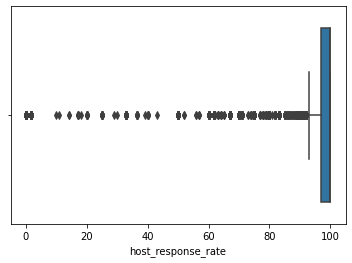

In [ ]:
# Check outlier of host_response_rate
sns.boxplot(data = listings_new,
            x = 'host_response_rate')

In [ ]:
# Remove outlier of host_response_rate
# q1_response_rate = np.quantile(listings_new['host_response_rate'], 0.25)
# q3_response_rate = np.quantile(listings_new['host_response_rate'], 0.75)
# iqr_response_rate = q3_response_rate - q1_response_rate
# response_rate_lower = q1_response_rate - 1.5 * iqr_response_rate
# response_rate_upper = q3_response_rate + 1.5 * iqr_response_rate
# response_rate_lower_df = listings_new[listings_new['host_response_rate'] < response_rate_lower]
# response_rate_upper_df = listings_new[listings_new['host_response_rate'] > response_rate_upper]
# listings_new = listings_new[(listings_new['host_response_rate'] > response_rate_lower) &
#                             (listings_new['host_response_rate'] < response_rate_upper)]

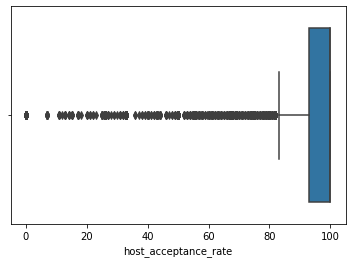

In [ ]:
# Check outlier of host_acceptance_rate
sns.boxplot(data = listings_new,
            x = 'host_acceptance_rate')

In [ ]:
# Remove outlier of host_response_rate
# q1_acceptance_rate = np.quantile(listings_new['host_acceptance_rate'], 0.25)
# q3_acceptance_rate = np.quantile(listings_new['host_acceptance_rate'], 0.75)
# iqr_acceptance_rate = q3_acceptance_rate - q1_acceptance_rate
# acceptance_rate_lower = q1_acceptance_rate - 1.5 * iqr_acceptance_rate
# acceptance_rate_upper = q3_acceptance_rate + 1.5 * iqr_acceptance_rate
# acceptance_rate_lower_df = listings_new[listings_new['host_acceptance_rate'] < acceptance_rate_lower]
# acceptance_rate_upper_df = listings_new[listings_new['host_acceptance_rate'] > acceptance_rate_upper]
# listings_new = listings_new[(listings_new['host_acceptance_rate'] > acceptance_rate_lower) &
#                             (listings_new['host_acceptance_rate'] < acceptance_rate_upper)]

In [ ]:
# Check host_is_superhost values if biased class for elimnation
listings_new['host_is_superhost'].value_counts(normalize = True)

f    0.642716
t    0.357284
Name: host_is_superhost, dtype: float64

In [ ]:
# Check host_verifications values if biased class for elimnation
listings_new['host_verifications'].value_counts(normalize = True)

['email', 'phone']                  0.792009
['email', 'phone', 'work_email']    0.132522
['phone']                           0.067659
['phone', 'work_email']             0.003206
['email']                           0.003124
[]                                  0.001398
['email', 'work_email']             0.000082
Name: host_verifications, dtype: float64

In [ ]:
# Drop host_verifications columns since most are email, phone, or work email (>90%)
listings_new = listings_new.drop(columns = 'host_verifications')

In [ ]:
# Check latitude
listings_new['latitude'].value_counts().sort_index()

37.93483    1
37.93500    1
37.93534    1
37.93543    1
37.93546    1
           ..
38.04474    1
38.04502    1
38.04535    1
38.04586    1
38.04597    1
Name: latitude, Length: 6549, dtype: int64

In [ ]:
# Check longitude
listings_new['longitude'].value_counts().sort_index()

23.66905    1
23.67182    1
23.67311    1
23.67524    1
23.67537    1
           ..
23.80479    1
23.80501    1
23.80520    1
23.80543    1
23.80661    1
Name: longitude, Length: 6432, dtype: int64

In [ ]:
# Check property_type
listings_new['property_type'].value_counts(normalize = True)

Entire rental unit                    0.596514
Entire condo                          0.208566
Private room in rental unit           0.039296
Entire home                           0.028116
Entire serviced apartment             0.022854
Room in hotel                         0.014798
Entire loft                           0.014551
Room in aparthotel                    0.014222
Room in boutique hotel                0.011181
Private room in condo                 0.010605
Room in serviced apartment            0.004028
Private room in bed and breakfast     0.003535
Private room in home                  0.003288
Private room in serviced apartment    0.003206
Shared room in hostel                 0.003124
Entire townhouse                      0.002795
Entire vacation home                  0.002302
Entire guest suite                    0.001973
Shared room in rental unit            0.001891
Private room in hostel                0.001809
Private room in guest suite           0.001809
Entire villa 

In [ ]:
# Create new column property_type_cat due to high biased
def property_type_cat(row):
  if (row == 'Entire rental unit') | (row == 'Entire condo'):
    return row
  else:
    return 'Other'
listings_new['property_type_cat'] = listings_new['property_type'].apply(property_type_cat)

In [ ]:
# Check room_type values
listings_new['room_type'].value_counts(normalize = True)

Entire home/apt    0.890332
Private room       0.092486
Hotel room         0.011509
Shared room        0.005672
Name: room_type, dtype: float64

In [ ]:
# Check accommodates
listings_new['accommodates'].value_counts()

4     3779
2     3681
3     1724
6     1112
5      913
1      291
8      242
7      179
10      53
9       49
16      40
12      37
13      17
11      16
15      16
14      15
Name: accommodates, dtype: int64

In [ ]:
# Check bathroom_text
listings_new['bathrooms_text'].value_counts(normalize = True)

1 bath               0.710208
1.5 baths            0.097392
2 baths              0.072386
1 private bath       0.044090
1 shared bath        0.029530
2.5 baths            0.010693
1.5 shared baths     0.010035
3 baths              0.008719
2 shared baths       0.003537
3.5 baths            0.002714
3 shared baths       0.002385
4 baths              0.002139
4 shared baths       0.000905
5 baths              0.000905
4.5 baths            0.000740
Half-bath            0.000658
2.5 shared baths     0.000494
0 baths              0.000411
5 shared baths       0.000329
6 baths              0.000329
0 shared baths       0.000329
9 baths              0.000165
6.5 baths            0.000165
5.5 baths            0.000165
Shared half-bath     0.000082
12 baths             0.000082
8.5 baths            0.000082
9.5 baths            0.000082
Private half-bath    0.000082
7 baths              0.000082
7.5 baths            0.000082
Name: bathrooms_text, dtype: float64

In [ ]:
# Check bathroom text null
listings_new[listings_new['bathrooms_text'].isnull()]

,id,last_scraped,description,host_id,host_since,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_has_profile_pic,host_identity_verified,neighbourhood_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,has_availability,availability_365,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,acceptance_rate_group,response_rate_group,property_type_cat
2138,21618477,2022-09-20,Your “tropical” oasis within the multicultural...,156890494,2017-10-31,within a few hours,100.000000,82.000000,f,t,f,ΑΓΙΟΣ ΚΩΝΣΤΑΝΤΙΝΟΣ-ΠΛΑΤΕΙΑ ΒΑΘΗΣ,37.98675,23.72140,Room in aparthotel,Hotel room,6,NaN,2.0,3.0,"[""Hangers"", ""Free parking on premises"", ""Gym"",...",265.0,1,1125,1.0,1125.0,t,354,5,5.00,5.00,5.00,5.00,5.00,4.00,4.25,t,4,0,0,0,0.10,75-100,75-100,Other
2176,21795666,2022-09-20,This exceptional Penthouse close to the Acropo...,47038350,2015-10-20,within an hour,100.000000,100.000000,t,t,t,ΚΟΥΚΑΚΙ-ΜΑΚΡΥΓΙΑΝΝΗ,37.96660,23.72685,Room in serviced apartment,Hotel room,8,NaN,3.0,4.0,"[""Hangers"", ""Ethernet connection"", ""Cooking ba...",138.0,2,1125,2.0,1125.0,t,337,68,4.62,4.74,4.76,4.78,4.94,4.96,4.66,f,36,35,0,0,1.18,75-100,75-100,Other
2405,23034890,2022-09-20,"Located in a 1930’s neoclassical building, dir...",114156592,2017-01-31,within an hour,100.000000,98.000000,t,t,t,ΖΑΠΠΕΙΟ,37.96796,23.73238,Room in boutique hotel,Hotel room,8,NaN,4.0,5.0,"[""Hot water kettle"", ""Nespresso machine"", ""Sho...",562.0,1,1125,1.2,1125.0,t,271,123,5.00,4.98,4.98,4.98,4.99,4.99,4.96,t,43,31,11,0,2.26,75-100,75-100,Other
3287,27448165,2022-09-20,Our Family Apartments are situated on the firs...,206838334,2018-08-02,within a day,100.000000,55.000000,f,t,t,ΘΗΣΕΙΟ,37.97805,23.72288,Room in serviced apartment,Hotel room,4,NaN,1.0,1.0,"[""Hangers"", ""Bathtub"", ""Host greets you"", ""Ele...",232.0,1,1125,1.0,1125.0,t,342,2,4.50,4.50,4.00,5.00,5.00,5.00,4.50,t,5,3,0,0,0.15,50-74,75-100,Other
3671,29363635,2022-09-20,"This apartment features a balcony, air conditi...",145112138,2017-08-09,within an hour,100.000000,92.000000,t,t,t,ΕΜΠΟΡΙΚΟ ΤΡΙΓΩΝΟ-ΠΛΑΚΑ,37.98583,23.73232,Room in serviced apartment,Hotel room,6,NaN,2.0,3.0,"[""Hangers"", ""Elevator"", ""Shampoo"", ""Long term ...",8000.0,1,1125,1.0,1125.0,t,337,2,5.00,5.00,5.00,5.00,5.00,5.00,4.50,t,4,1,0,0,0.05,75-100,75-100,Other
4565,33583191,2022-09-20,Conveniently located in the heart of historica...,251953365,2019-03-29,within an hour,100.000000,100.000000,t,t,t,ΕΜΠΟΡΙΚΟ ΤΡΙΓΩΝΟ-ΠΛΑΚΑ,37.97734,23.72474,Room in serviced apartment,Hotel room,6,NaN,2.0,3.0,"[""Hangers"", ""Ethernet connection"", ""Patio or b...",117.0,1,1125,1.0,1125.0,t,219,71,4.73,4.79,4.85,4.92,4.92,4.89,4.75,t,11,0,0,0,1.72,75-100,75-100,Other
11296,1192681,2022-09-20,<b>The space</b><br />OUSE IN HYDRA <br /> <br...,6518964,2013-05-22,within an hour,94.321216,91.424489,f,t,f,ΠΟΛΥΓΩΝΟ,38.00613,23.76983,Private room in villa,Private room,7,NaN,1.0,1.0,"[""Long term stays allowed""]",77.0,7,365,7.0,365.0,t,365,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,f,1,0,1,0,NaN,75-100,75-100,Other


In [ ]:
# Fill missing bathroom_texts with mode
listings_new.loc[listings_new['bathrooms_text'].isnull(), 'bathrooms_text'] = listings_new.loc[listings_new['bathrooms_text'].isnull(), 'bathrooms_text'].fillna(listings_new['bathrooms_text'].mode()[0])

In [ ]:
# Check bedrooms
listings_new['bedrooms'].value_counts()

1.0     7209
2.0     3147
3.0      635
4.0      150
5.0       42
6.0       35
7.0        5
10.0       4
9.0        2
11.0       1
14.0       1
Name: bedrooms, dtype: int64

In [ ]:
# Check bedrooms missing values
listings_new[listings_new['bedrooms'].isnull()]

,id,last_scraped,description,host_id,host_since,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_has_profile_pic,host_identity_verified,neighbourhood_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,has_availability,availability_365,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,acceptance_rate_group,response_rate_group,property_type_cat
20,39038773,2022-09-20,No description,24993337,2014-12-19,within a day,50.000000,100.0,f,t,f,ΓΟΥΔΙ,37.97085,23.77592,Private room in rental unit,Private room,2,1 private bath,NaN,1.0,"[""Long term stays allowed"", ""Hangers"", ""Privat...",25.0,7,1125,7.0,1125.0,t,177,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,t,1,0,1,0,NaN,75-100,50-74,Other
22,44675900,2022-09-20,One of the most prestigious room types of the ...,349349351,2020-06-09,within an hour,80.000000,99.0,f,t,t,ΝΕΟΣ ΚΟΣΜΟΣ,37.95246,23.71225,Room in aparthotel,Entire home/apt,2,1 bath,NaN,2.0,"[""Smoke alarm"", ""First aid kit"", ""Shampoo"", ""H...",94.0,1,365,1.0,264.6,t,247,27,4.70,4.70,4.74,4.67,4.81,4.44,4.59,t,5,2,3,0,1.08,75-100,75-100,Other
48,23395508,2022-09-20,"A beautiful, small apartment 20m2 in Northern ...",171064973,2018-02-01,a few days or more,1.589147,0.0,f,t,t,ΠΕΝΤΑΓΩΝΟ,38.01274,23.79361,Entire rental unit,Entire home/apt,2,1 bath,NaN,1.0,"[""Hangers"", ""Carbon monoxide alarm"", ""Cooking ...",50.0,10,30,10.0,30.0,t,177,1,0.00,NaN,NaN,NaN,NaN,NaN,NaN,f,1,1,0,0,0.02,0-24,0-24,Entire rental unit
89,53471535,2022-09-20,Profitez d'un logement élégant et central. En ...,414043803,2021-07-20,within a few hours,100.000000,33.0,f,t,t,ΑΚΡΟΠΟΛΗ,37.96275,23.71617,Entire rental unit,Entire home/apt,2,1 bath,NaN,2.0,"[""Hot water kettle"", ""Shower gel"", ""Hangers"", ...",25.0,4,365,4.0,365.0,t,54,1,3.00,4.00,3.00,5.00,5.00,4.00,4.00,f,1,1,0,0,0.11,25-49,75-100,Entire rental unit
90,32514092,2022-09-20,"Home is not a place....... is a feeling, so i...",31763466,2015-04-22,within an hour,100.000000,100.0,t,t,t,ΠΕΤΡΑΛΩΝΑ,37.96037,23.71364,Entire rental unit,Entire home/apt,2,1.5 baths,NaN,1.0,"[""Hot water kettle"", ""Nespresso machine"", ""Sho...",42.0,1,1125,1.0,1125.0,t,142,35,4.97,4.97,4.91,4.97,5.00,4.82,4.94,f,2,2,0,0,0.82,75-100,75-100,Entire rental unit
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11930,589785866651574457,2022-09-20,Ονειρικό ρετιρέ 26 τ.μ. 7ου ορόφου με μαγευτικ...,280475397,2019-07-29,within an hour,100.000000,100.0,t,t,t,ΓΟΥΒΑ,37.95993,23.74661,Entire condo,Entire home/apt,2,1 bath,NaN,1.0,"[""Shower gel"", ""Hangers"", ""Lenor conditioner"",...",35.0,2,150,2.0,1125.0,t,285,12,4.92,5.00,4.83,4.75,4.92,4.42,4.92,t,2,2,0,0,2.50,75-100,75-100,Entire condo
12013,11469627,2022-09-20,"A bright, airy and inviting roof top studio wi...",60342705,2016-02-25,a few days or more,0.000000,0.0,f,t,f,ΙΛΙΣΙΑ,37.97293,23.77156,Entire loft,Entire home/apt,3,1 bath,NaN,1.0,"[""Elevator"", ""Shampoo"", ""Hangers"", ""Long term ...",56.0,2,1125,2.0,1125.0,t,363,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,f,1,1,0,0,NaN,0-24,0-24,Other
12037,39850145,2022-09-20,Odyssey Nausicaa is a studio rooftop with a bi...,113548208,2017-01-27,within an hour,100.000000,100.0,t,t,t,ΠΑΓΚΡΑΤΙ,37.96903,23.75411,Entire rental unit,Entire home/apt,4,1 bath,NaN,2.0,"[""Hot water kettle"", ""Nespresso machine"", ""Sho...",102.0,1,1125,2.6,115.4,t,157,48,4.94,4.96,4.83,4.88,4.90,4.81,4.92,t,64,64,0,0,1.49,75-100,75-100,Entire rental unit
12061

In [ ]:
# Check correlations of bedrooms with other columns
listings_new.corr()['bedrooms']

id                                             -0.032097
host_id                                        -0.069675
host_response_rate                             -0.015167
host_acceptance_rate                           -0.032564
latitude                                       -0.004058
longitude                                      -0.010577
accommodates                                    0.763890
bedrooms                                        1.000000
beds                                            0.744377
price                                           0.158098
minimum_nights                                 -0.002128
maximum_nights                                  0.048404
minimum_nights_avg_ntm                         -0.002047
maximum_nights_avg_ntm                         -0.019104
availability_365                               -0.023861
number_of_reviews                              -0.022630
review_scores_rating                            0.000927
review_scores_accuracy         

In [ ]:
# Check mode of bedrooms based on group accommodates and beds
acc_beds_dict = round(listings_new.groupby(['accommodates', 'beds'])['bedrooms'].agg('mean')).to_dict()

In [ ]:
# Impute missing bedrooms based on group accommodates and beds
listings_new.loc[listings_new['bedrooms'].isnull() & listings_new['beds'].notnull(), 'bedrooms'] = listings_new[listings_new['bedrooms'].isnull() & listings_new['beds'].notnull()].apply(lambda x: acc_beds_dict[(x['accommodates'], x['beds'])], axis = 1)

In [ ]:
# Check correlations of beds with other columns
listings_new.corr()['beds']

id                                             -0.045728
host_id                                        -0.040978
host_response_rate                             -0.007099
host_acceptance_rate                           -0.016572
latitude                                       -0.007736
longitude                                      -0.021068
accommodates                                    0.790508
bedrooms                                        0.747548
beds                                            1.000000
price                                           0.123731
minimum_nights                                 -0.009494
maximum_nights                                  0.030440
minimum_nights_avg_ntm                         -0.010266
maximum_nights_avg_ntm                         -0.009675
availability_365                               -0.009125
number_of_reviews                              -0.012030
review_scores_rating                           -0.016518
review_scores_accuracy         

In [ ]:
# Check where bedroom not null and beds null
# Group beds by accomodates and bedrooms
acc_bedr_dict = round(listings_new.groupby(['accommodates', 'bedrooms'])['beds'].mean()).to_dict()

In [ ]:
# Impute missing beds based on group accommodates and bedrooms
listings_new.loc[listings_new['bedrooms'].notnull() & listings_new['beds'].isnull(), 'beds'] = listings_new[listings_new['bedrooms'].notnull() & listings_new['beds'].isnull()].apply(lambda x: acc_bedr_dict[(x['accommodates'], x['bedrooms'])], axis = 1)

In [ ]:
# Fill remaining null based on accomodates
acc_group = round(listings_new.groupby('accommodates')[['bedrooms', 'beds']].mean()).to_dict()
acc_group

{'bedrooms': {1: 1.0,
  2: 1.0,
  3: 1.0,
  4: 1.0,
  5: 2.0,
  6: 2.0,
  7: 2.0,
  8: 3.0,
  9: 3.0,
  10: 4.0,
  11: 4.0,
  12: 4.0,
  13: 4.0,
  14: 5.0,
  15: 4.0,
  16: 6.0},
 'beds': {1: 1.0,
  2: 1.0,
  3: 2.0,
  4: 2.0,
  5: 3.0,
  6: 3.0,
  7: 4.0,
  8: 4.0,
  9: 5.0,
  10: 6.0,
  11: 7.0,
  12: 7.0,
  13: 8.0,
  14: 8.0,
  15: 9.0,
  16: 11.0}}

In [ ]:
# Impute remaining missing beds and bedrooms with group accommodates
listings_new.loc[listings_new['bedrooms'].isnull(), 'bedrooms'] = listings_new[listings_new['bedrooms'].isnull()].apply(lambda x: acc_group['bedrooms'][x['accommodates']], axis = 1)
listings_new.loc[listings_new['beds'].isnull(), 'beds'] = listings_new[listings_new['beds'].isnull()].apply(lambda x: acc_group['beds'][x['accommodates']], axis = 1)

In [ ]:
# Check amenities values
listings_new['amenities'].unique().tolist()

['["First aid kit", "Shampoo", "Hangers", "TV", "Iron", "Essentials", "Wifi", "Kitchen", "Air conditioning", "Fire extinguisher", "Hair dryer", "Washer"]',
 '["Hangers", "Bathtub", "Cooking basics", "Patio or balcony", "Baby safety gates", "Room-darkening shades", "Elevator", "Shampoo", "Long term stays allowed", "Table corner guards", "Bed linens", "Free street parking", "Kitchen", "Window guards", "Hot water", "Stove", "Extra pillows and blankets", "TV", "Outlet covers", "Hair dryer", "Dishes and silverware", "Cleaning before checkout", "Oven", "Refrigerator", "Iron", "Essentials", "Wifi", "Air conditioning", "Backyard", "Heating"]',
 '["Air conditioning", "Dishes and silverware", "Shampoo", "Hangers", "Refrigerator", "Long term stays allowed", "Private entrance", "TV", "Essentials", "Bed linens", "Wifi", "Kitchen", "Cooking basics", "Hot water", "Stove", "Hair dryer", "Heating"]',
 '["Long term stays allowed", "TV", "Wifi", "Kitchen", "Air conditioning", "First aid kit", "Washer"]',

In [ ]:
# Convert amenities to comma sperateed string for later analysis
from json import loads
listings_new['amenities'] = listings_new['amenities'].apply(loads).str.join(',')

In [ ]:
# Check price
listings_new['price'].value_counts()

50.0      462
40.0      409
60.0      394
45.0      337
35.0      293
70.0      285
65.0      262
80.0      254
55.0      241
30.0      240
100.0     181
42.0      152
39.0      151
75.0      149
90.0      146
41.0      144
120.0     143
49.0      141
69.0      140
46.0      135
25.0      117
48.0      116
59.0      114
53.0      114
85.0      109
43.0      107
56.0      106
51.0      106
38.0      105
36.0      104
47.0      103
95.0      103
28.0      103
68.0       99
44.0       99
62.0       99
52.0       99
58.0       98
33.0       97
54.0       97
150.0      95
61.0       94
110.0      92
57.0       92
63.0       88
64.0       82
66.0       81
32.0       81
72.0       80
29.0       79
67.0       76
37.0       76
34.0       71
27.0       71
20.0       70
31.0       70
78.0       70
82.0       67
140.0      66
71.0       62
26.0       62
99.0       61
74.0       60
79.0       59
81.0       58
76.0       57
73.0       54
105.0      53
89.0       52
77.0       51
24.0       51
130.0 

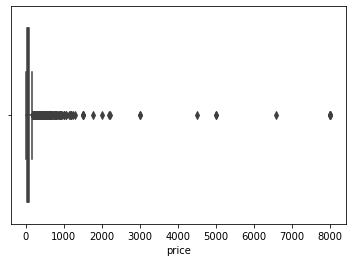

In [ ]:
# Check outlier price
sns.boxplot(data = listings_new,
             x = 'price')

In [ ]:
# Remove outliers
# q1_price = np.quantile(listings_new['price'], 0.25)
# q3_price = np.quantile(listings_new['price'], 0.75)
# iqr_price = q3_price - q1_price
# price_upper = q3_price + 1.5 * iqr_price
# price_lower = q1_price - 1.5 * iqr_price
# upper_price_df = listings_new[listings_new['price'] > q3_price]
# lower_price_df = listings_new[listings_new['price'] < q1_price]

In [ ]:
# Check minimum night
listings_new['minimum_nights'].value_counts()

1       5040
2       4397
3       1506
4        357
5        264
7        162
30        76
6         60
10        53
15        39
20        32
28        32
14        21
25        11
60        11
90        10
365        8
12         7
9          5
8          5
24         4
180        4
29         4
11         3
100        3
150        3
35         3
21         2
50         2
55         2
45         2
200        2
27         2
18         2
1000       2
19         2
500        2
62         1
240        1
84         1
26         1
17         1
201        1
41         1
13         1
120        1
31         1
168        1
250        1
800        1
444        1
40         1
322        1
370        1
22         1
364        1
66         1
182        1
222        1
300        1
157        1
Name: minimum_nights, dtype: int64

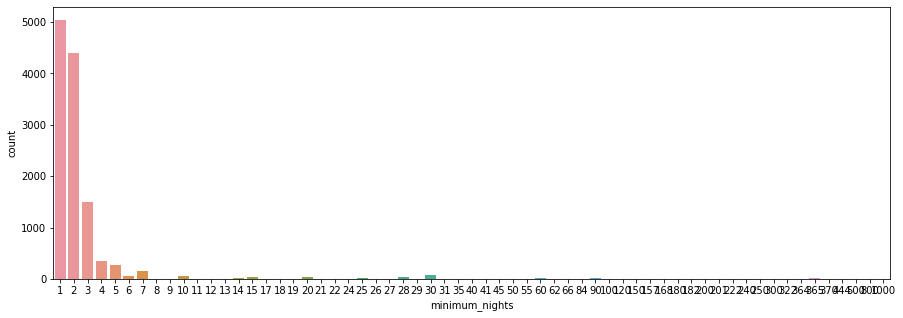

In [ ]:
# Minimum night distribution
plt.figure(figsize = (15,5))
sns.countplot(data = listings_new,
             x = 'minimum_nights')

In [ ]:
# Check maximum night
listings_new['maximum_nights'].value_counts(normalize = True)

1125    0.506084
365     0.178395
30      0.056643
90      0.028527
60      0.026554
28      0.026061
15      0.012167
20      0.010358
10      0.010194
180     0.009372
31      0.009290
14      0.008879
1124    0.007234
120     0.006659
7       0.006659
25      0.004850
21      0.004357
1000    0.004357
300     0.004028
100     0.003946
40      0.003782
29      0.003699
89      0.003371
360     0.003206
35      0.002877
200     0.002549
350     0.002549
45      0.002466
5       0.002384
730     0.002220
150     0.002137
50      0.002137
6       0.001809
500     0.001809
3       0.001644
8       0.001398
12      0.001398
27      0.001315
62      0.001233
4       0.001151
9       0.001151
250     0.001069
1       0.001069
32      0.000987
65      0.000904
720     0.000904
364     0.000822
22      0.000822
70      0.000822
16      0.000740
1123    0.000740
95      0.000658
91      0.000575
600     0.000575
999     0.000575
80      0.000493
99      0.000493
36      0.000493
33      0.0004

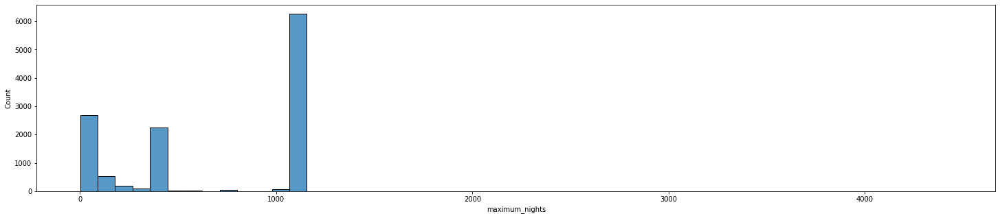

In [ ]:
# Minimum night distribution
plt.figure(figsize = (25,5))
sns.histplot(data = listings_new,
             x = 'maximum_nights')

In [ ]:
# Check minimum nights avg values
listings_new['minimum_nights_avg_ntm'].value_counts()

2.0       4342
1.0       4090
3.0       1480
4.0        339
5.0        255
1.3        155
7.0        154
1.1         99
1.4         83
1.9         79
30.0        72
2.6         64
6.0         59
1.6         50
1.2         48
10.0        48
2.8         48
2.5         44
2.1         43
15.0        35
4.8         35
3.8         35
20.0        31
28.0        29
2.9         29
1.7         25
1.5         24
2.3         20
14.0        19
3.4         19
2.4         18
1.8         16
2.7         12
3.3         12
25.0        11
3.5         11
2.2         11
90.0        10
60.0         8
3.1          8
365.0        8
3.2          7
3.7          7
8.0          7
3.6          7
3.9          7
12.0         6
180.0        5
9.0          5
7.1          4
4.9          4
24.0         3
100.0        3
6.4          3
9.2          3
6.6          3
11.0         3
4.1          3
4.6          3
12.6         3
4.7          3
35.0         3
27.0         2
7.4          2
19.0         2
10.4         2
4.5       

In [ ]:
# Check minimum nights avg values
listings_new['maximum_nights_avg_ntm'].value_counts()

1125.0    8213
365.0     1593
30.0       327
28.0       162
90.0       143
60.0       120
15.0        76
10.0        71
14.0        70
20.0        59
7.0         53
31.0        52
180.0       51
1124.0      41
999.0       37
21.0        36
25.0        32
899.1       31
350.0       28
120.0       26
100.0       25
300.0       24
99.0        23
45.0        23
1000.0      20
6.0         17
40.0        17
5.0         17
8.0         15
29.0        15
3.0         14
35.0        13
360.0       13
200.0       12
720.0       11
50.0        11
4.0         11
730.0       11
150.0       11
9.0         10
12.0        10
1.0          8
31.5         8
61.0         8
500.0        7
242.9        7
1119.9       7
679.4        7
250.0        7
62.0         6
27.0         6
364.0        6
353.0        5
264.6        5
163.1        5
145.8        5
911.8        5
1122.5       5
1038.2       5
1117.4       4
33.0         4
364.2        4
89.0         4
70.0         4
80.0         4
1040.7       4
806.1     

In [ ]:
# Check has_availability values
listings_new['has_availability'].value_counts(normalize = True)

t    0.989231
f    0.010769
Name: has_availability, dtype: float64

In [ ]:
# Drop has_availability column due to high biased towards t class
listings_new = listings_new.drop(columns = 'has_availability')

In [ ]:
# Check availability_365 values
listings_new['availability_365'].value_counts()

0      802
365    277
354    203
364    184
358    165
353    156
262    155
362    137
347    137
355    131
356    130
359    129
348    126
323    124
349    121
357    118
360    117
352    114
363    110
341    110
351    110
340    108
336    107
342    106
350    105
344    101
337     99
339     98
324     95
361     93
335     92
345     91
338     90
346     86
328     85
334     81
331     80
333     79
330     79
343     78
332     77
326     74
327     74
325     72
329     71
321     68
320     66
293     65
318     61
77      59
180     54
319     54
1       53
316     53
322     52
172     50
317     49
81      48
315     48
203     46
231     46
313     46
90      45
169     45
263     44
170     44
88      43
179     42
312     42
76      41
173     41
142     41
314     40
309     39
311     39
89      38
168     38
167     37
111     37
2       36
157     36
302     35
177     35
83      35
294     35
138     33
178     32
82      32
307     31
164     31
78      31

In [ ]:
# Since availability_365 extract from calender df, check if 0 is true value
samp_df = pd.DataFrame(calendar[['listing_id', 'available']].value_counts()).rename(columns = {0:'count'}).reset_index()
new_df = pd.merge(left = listings_new,
                  right = samp_df[samp_df['available'] == 't'],
                  left_on = 'id',
                  right_on = 'listing_id',
                  how = 'left').drop(columns = ['listing_id', 'available'])
new_df['count'].value_counts()

365.0    277
354.0    203
364.0    185
358.0    165
353.0    156
262.0    155
362.0    137
347.0    137
355.0    131
356.0    130
359.0    129
348.0    126
323.0    124
349.0    121
357.0    118
360.0    117
352.0    114
363.0    110
341.0    110
351.0    110
340.0    108
336.0    107
342.0    107
350.0    105
344.0    101
337.0     99
339.0     98
324.0     95
361.0     93
335.0     92
338.0     91
345.0     91
328.0     86
346.0     86
334.0     81
331.0     80
330.0     79
333.0     79
343.0     78
332.0     77
326.0     74
327.0     74
325.0     72
329.0     71
321.0     68
320.0     66
293.0     65
318.0     61
77.0      59
180.0     54
319.0     54
316.0     53
1.0       53
322.0     52
172.0     50
317.0     49
315.0     49
81.0      48
231.0     46
203.0     46
313.0     46
169.0     45
90.0      45
263.0     44
170.0     44
88.0      43
179.0     42
312.0     42
173.0     41
76.0      41
142.0     41
314.0     40
311.0     39
309.0     39
89.0      38
168.0     38
111.0     37

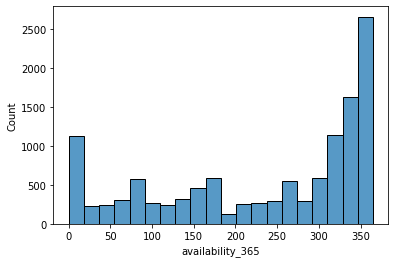

In [ ]:
sns.histplot(data = listings_new,
             x = 'availability_365')

In [ ]:
# Replace 0 with mean
# listings_new['availability_365'] = listings_new['availability_365'].replace(0,listings_new['availability_365'].mean())

# Do nothing

In [ ]:
# Check number of reviews values
listings_new['number_of_reviews'].value_counts()

0      1972
1       802
2       591
3       451
4       416
5       320
6       279
7       234
8       227
11      188
9       188
10      176
13      155
17      146
15      145
14      142
12      139
16      137
18      131
19      125
20      109
27      107
21      106
23      105
22       95
25       90
24       89
28       86
34       81
26       81
29       80
30       78
31       75
37       72
33       66
38       62
40       61
36       58
32       58
35       57
45       56
47       56
42       52
44       51
48       50
41       49
59       45
46       45
39       44
55       42
60       42
49       40
51       39
53       39
67       37
50       37
54       36
56       35
52       35
58       34
68       34
43       34
66       33
71       33
62       32
70       32
57       31
63       31
75       31
64       31
87       30
61       27
78       27
93       27
92       27
72       27
65       26
80       26
97       26
86       26
69       25
81       25
76       25
88  

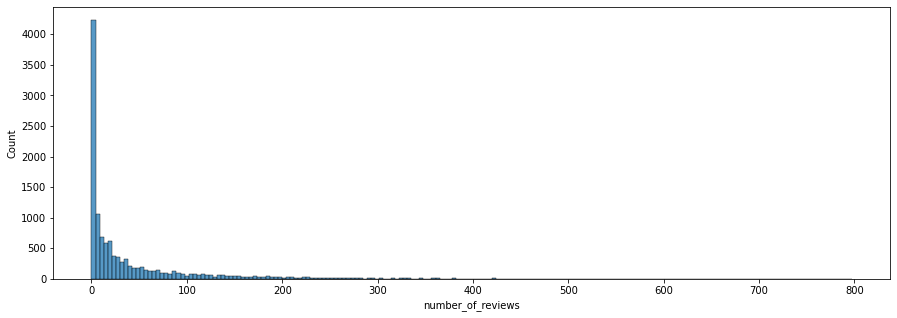

In [ ]:
# Check number of reviews distribution
plt.figure(figsize = (15,5))
sns.histplot(data = listings_new,
             x = 'number_of_reviews')

In [ ]:
# Create new number of reviews category, 0:0 reviews, 1: At least 1 review
listings_new['has_reviews'] = listings_new['number_of_reviews'].apply(lambda row: 0 if row == 0 else 1)

In [ ]:
# Check review_scores_rating values
listings_new['review_scores_rating'].unique()

array([4.37, 3.67, 4.85,  nan, 5.  , 4.77, 4.9 , 4.94, 4.99, 3.83, 4.93,
       4.7 , 4.51, 4.35, 4.84, 4.67, 4.33, 4.8 , 4.97, 4.86, 0.  , 4.95,
       4.75, 4.2 , 4.5 , 4.47, 4.92, 4.  , 4.36, 3.  , 4.45, 4.87, 4.58,
       4.64, 4.96, 4.83, 4.73, 4.78, 4.6 , 4.66, 4.88, 4.25, 4.65, 4.61,
       4.81, 3.5 , 4.63, 4.79, 4.89, 4.53, 4.39, 4.57, 4.4 , 4.91, 4.82,
       4.76, 4.42, 4.22, 4.55, 4.69, 4.13, 4.18, 4.71, 4.72, 4.74, 4.15,
       4.62, 4.48, 4.54, 4.08, 4.09, 4.26, 4.98, 4.56, 4.59, 4.49, 4.38,
       4.44, 2.  , 4.43, 4.41, 4.23, 4.52, 4.28, 4.46, 3.8 , 4.14, 3.88,
       3.89, 4.68, 4.21, 1.  , 4.31, 4.17, 4.29, 3.92, 2.33, 4.34, 4.27,
       4.06, 4.19, 2.5 , 4.11, 3.2 , 3.75, 4.3 , 4.32, 3.6 , 3.86, 3.63,
       4.24, 4.03, 4.05, 3.33, 4.12, 3.91, 3.71, 3.84, 3.4 , 4.1 , 3.78,
       3.93, 4.07, 3.81, 3.94, 3.82, 3.38, 3.25, 4.16, 3.43, 3.31, 3.17,
       3.76, 3.85, 4.04, 3.29, 3.7 , 2.9 , 3.46, 3.73, 2.8 , 3.45, 1.5 ,
       4.02])

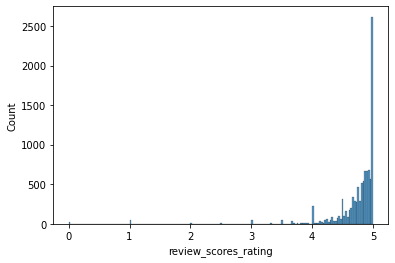

In [ ]:
# Check review_scores_rating distribution
sns.histplot(data = listings_new,
             x = 'review_scores_rating')

In [ ]:
# Check null review_scores_rating
listings_new[listings_new['review_scores_rating'].isnull()].isnull().sum()

id                                                 0
last_scraped                                       0
description                                        0
host_id                                            0
host_since                                         0
host_response_time                                 0
host_response_rate                                 0
host_acceptance_rate                               0
host_is_superhost                                  0
host_has_profile_pic                               0
host_identity_verified                             0
neighbourhood_cleansed                             0
latitude                                           0
longitude                                          0
property_type                                      0
room_type                                          0
accommodates                                       0
bathrooms_text                                     0
bedrooms                                      

In [ ]:
# If review_scores_rating is null, then other review_scores category also null
listings_new.corr()['review_scores_rating']

id                                             -0.031836
host_id                                        -0.071148
host_response_rate                              0.176749
host_acceptance_rate                            0.046202
latitude                                       -0.062540
longitude                                      -0.008752
accommodates                                    0.011492
bedrooms                                        0.001221
beds                                           -0.014264
price                                           0.048377
minimum_nights                                  0.006408
maximum_nights                                 -0.011750
minimum_nights_avg_ntm                          0.006678
maximum_nights_avg_ntm                          0.063523
availability_365                               -0.031602
number_of_reviews                               0.111463
review_scores_rating                            1.000000
review_scores_accuracy         

In [ ]:
listings_new.groupby(['has_reviews'])['review_scores_rating'].agg(['median', 'std'])

,median,std
has_reviews,,
0,NaN,NaN
1,4.86,0.482377


In [ ]:
# It seems that where number_of_reviews is 0, review_score_ratings is 0
# Drop rows with no review_scores_rating
listings_new = listings_new.drop(index = listings_new[listings_new['review_scores_rating'].isnull()].index)

In [ ]:
# Check review_scores_accuracy null values
listings_new[listings_new['review_scores_accuracy'].isnull()].isnull().sum()

id                                               0
last_scraped                                     0
description                                      0
host_id                                          0
host_since                                       0
host_response_time                               0
host_response_rate                               0
host_acceptance_rate                             0
host_is_superhost                                0
host_has_profile_pic                             0
host_identity_verified                           0
neighbourhood_cleansed                           0
latitude                                         0
longitude                                        0
property_type                                    0
room_type                                        0
accommodates                                     0
bathrooms_text                                   0
bedrooms                                         0
beds                           

In [ ]:
# 'review_scores_accuracy', 'review_scores_cleanliness', 'review_scores_checkin', 
# 'review_scores_checkin', 'review_scores_communication', 'review_scores_location', 'review_scores_value'
# all missing together
# Drop these colums
listings_new = listings_new.drop(index = listings_new[listings_new['review_scores_accuracy'].isnull()].index)

In [ ]:
# Check review_scores_value null
listings_new[listings_new['review_scores_value'].isnull()]

,id,last_scraped,description,host_id,host_since,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_has_profile_pic,host_identity_verified,neighbourhood_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,availability_365,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,acceptance_rate_group,response_rate_group,property_type_cat,has_reviews
500,4894903,2022-09-20,This studio has a double bed. It includes a ki...,2370772,2012-05-14,a few days or more,0.0,0.0,f,t,f,ΕΜΠΟΡΙΚΟ ΤΡΙΓΩΝΟ-ΠΛΑΚΑ,37.97816,23.72557,Private room in bed and breakfast,Private room,2,1 bath,1.0,1.0,"Smoke alarm,Long term stays allowed,Heating,Dr...",120.0,1,1125,1.0,1125.0,365,1,4.0,3.0,5.0,5.0,5.0,4.0,NaN,f,9,1,8,0,0.01,0-24,0-24,Other,1


In [ ]:
# Drop this as well
listings_new = listings_new.drop(index = listings_new[listings_new['review_scores_value'].isnull()].index)

In [ ]:
# Check instant_bookable values
listings_new['instant_bookable'].value_counts()

t    7438
f    2727
Name: instant_bookable, dtype: int64

In [ ]:
# check calculated_host_listings_count values
listings_new['calculated_host_listings_count'].value_counts().sort_index()

1      3637
2      1166
3       634
4       481
5       321
6       362
7       258
8       254
9       195
10      179
11      158
12      139
13      148
14       91
15       89
16       73
17       71
18       91
19       71
20       50
21       30
22       75
23       45
24       46
25       53
26       39
27       23
28       52
29       58
32       30
33      150
34       32
35       63
36       33
37       61
38       73
39       67
40       40
42       35
43       35
44       76
53       44
63       62
64       58
65       53
76       73
90       85
222     206
Name: calculated_host_listings_count, dtype: int64

In [ ]:
# check calculated_host_listings_count_entire_homes values
listings_new['calculated_host_listings_count_entire_homes'].value_counts()

1      3670
2      1155
3       638
0       471
4       410
6       284
5       279
7       249
8       209
222     206
12      172
10      162
9       149
13      140
11      139
33      129
14      106
35       96
90       85
22       75
61       73
38       73
19       71
17       71
18       67
39       67
20       66
25       64
63       62
37       61
15       60
29       58
64       58
24       46
44       44
48       44
16       44
40       40
26       39
42       35
31       35
34       32
21       30
32       30
28       25
23       23
27       23
Name: calculated_host_listings_count_entire_homes, dtype: int64

In [ ]:
# Check reviews_per_month value
listings_new['reviews_per_month'].value_counts()

1.00     217
0.08     114
2.00     109
0.03     108
0.06      90
        ... 
9.71       1
6.58       1
4.27       1
5.90       1
10.49      1
Name: reviews_per_month, Length: 786, dtype: int64

In [ ]:
listings_new.isnull().sum()

id                                              0
last_scraped                                    0
description                                     0
host_id                                         0
host_since                                      0
host_response_time                              0
host_response_rate                              0
host_acceptance_rate                            0
host_is_superhost                               0
host_has_profile_pic                            0
host_identity_verified                          0
neighbourhood_cleansed                          0
latitude                                        0
longitude                                       0
property_type                                   0
room_type                                       0
accommodates                                    0
bathrooms_text                                  0
bedrooms                                        0
beds                                            0


In [ ]:
top_20_amenities = listings_new['amenities'].str.get_dummies(sep = ',').sum().sort_values(ascending = False)[0:20].index.tolist()

In [ ]:
def amenities_score(row):
  global top_20_amenities
  common_set = set(row.split(',')).intersection(top_20_amenities)
  score = len(common_set) / 2
  return score

listings_new['amenities_score'] = listings_new['amenities'].apply(amenities_score)

In [ ]:
listings_new['amenities_count'] = listings_new['amenities'].apply(lambda x: len(x.split(',')))

In [ ]:
# Additional columns host durations
listings_new['host_duration_days'] = listings_new.apply(lambda row: int(str(listings_new['last_scraped'].max() - row['host_since']).split(' ')[0]), axis = 1)

In [ ]:
import nltk
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('omw-1.4')
!pip uninstall googletrans -y
!pip install googletrans==4.0.0rc1

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 55 kB 2.4 MB/s 
     |████████████████████████████████| 42 kB 1.5 MB/s 
     |████████████████████████████████| 1.5 MB 11.3 MB/s 
     |████████████████████████████████| 65 kB 3.8 MB/s 
     |████████████████████████████████| 53 kB 2.5 MB/s 
  Created wheel for googletrans: filename=googletrans-4.0.0rc1-py3-none-any.whl size=17414 sha256=6fd786fcf78d7e7550fc77757877a01ab312174c085ee6d36fbb82442c1bb7f3
  Stored in directory: /root/.cache/pip/wheels/a9/25/af/715361fa79594524c89c75d293def652045f3fdce6ca398712
Successfully built googletrans


In [ ]:
from nltk.corpus import stopwords
from bs4 import BeautifulSoup
from nltk.stem.porter import PorterStemmer
from nltk.stem import WordNetLemmatizer
from googletrans import Translator
import re
# from translate import Translator
# translator = Translator(from_lang='el', to_lang='en')
translator = Translator()
stops_greek = stopwords.words('greek')
extra_stops = ['located', 'athen', 'area', 'comfortable', 'enjoy', 'room', 'space',
               'room', 'includ', 'accommod', 'live', 'bedroom', 'citi',
               'build', 'ideal', 'kitchen', 'bathroom', 'bedroom',
               'living', 'athens']
stops_english = stopwords.words('english') + extra_stops
porter = PorterStemmer()
lemmatizer = WordNetLemmatizer()
print(stops_greek)
print(stops_english)

['αλλα', 'αν', 'αντι', 'απο', 'αυτα', 'αυτεσ', 'αυτη', 'αυτο', 'αυτοι', 'αυτοσ', 'αυτουσ', 'αυτων', 'αἱ', 'αἳ', 'αἵ', 'αὐτόσ', 'αὐτὸς', 'αὖ', 'γάρ', 'γα', 'γα^', 'γε', 'για', 'γοῦν', 'γὰρ', "δ'", 'δέ', 'δή', 'δαί', 'δαίσ', 'δαὶ', 'δαὶς', 'δε', 'δεν', "δι'", 'διά', 'διὰ', 'δὲ', 'δὴ', 'δ’', 'εαν', 'ειμαι', 'ειμαστε', 'ειναι', 'εισαι', 'ειστε', 'εκεινα', 'εκεινεσ', 'εκεινη', 'εκεινο', 'εκεινοι', 'εκεινοσ', 'εκεινουσ', 'εκεινων', 'ενω', 'επ', 'επι', 'εἰ', 'εἰμί', 'εἰμὶ', 'εἰς', 'εἰσ', 'εἴ', 'εἴμι', 'εἴτε', 'η', 'θα', 'ισωσ', 'κ', 'καί', 'καίτοι', 'καθ', 'και', 'κατ', 'κατά', 'κατα', 'κατὰ', 'καὶ', 'κι', 'κἀν', 'κἂν', 'μέν', 'μή', 'μήτε', 'μα', 'με', 'μεθ', 'μετ', 'μετά', 'μετα', 'μετὰ', 'μη', 'μην', 'μἐν', 'μὲν', 'μὴ', 'μὴν', 'να', 'ο', 'οι', 'ομωσ', 'οπωσ', 'οσο', 'οτι', 'οἱ', 'οἳ', 'οἷς', 'οὐ', 'οὐδ', 'οὐδέ', 'οὐδείσ', 'οὐδεὶς', 'οὐδὲ', 'οὐδὲν', 'οὐκ', 'οὐχ', 'οὐχὶ', 'οὓς', 'οὔτε', 'οὕτω', 'οὕτως', 'οὕτωσ', 'οὖν', 'οὗ', 'οὗτος', 'οὗτοσ', 'παρ', 'παρά', 'παρα', 'παρὰ', 'περί', 'περὶ', 'πο

In [ ]:
def clean_text(row, stops_english):
  raw = BeautifulSoup(row, "html.parser").get_text()
  clean = re.sub(r'[^A-Za-zα-ωΑ-Ω\d\s]', " ",raw).lower()
  clean = [lemmatizer.lemmatize(word) for word in clean.split() if word not in stops_greek]
  clean = [word for word in clean if word not in stops_english]
  return ' '.join(clean)

In [ ]:
# New description_clean columns
listings_new['description_clean'] = listings_new['description'].apply(clean_text, args = ([stops_english]))

In [ ]:
# Drop description column
# listings_new = listings_new.drop('description', axis = 1)

In [ ]:
neighbourhood_dict = {'ΝΕΟΣ ΚΟΣΜΟΣ' : 'NEOS KOSMOS', 'ΠΕΤΡΑΛΩΝΑ':'PETRALONA', 'ΡΟΥΦ':'ROUF',
                      'ΠΕΝΤΑΓΩΝΟ':'PENTAGONO', 'ΒΟΤΑΝΙΚΟΣ':'VOTANIKOS', 'ΠΑΤΗΣΙΑ':'PATISIA',
                      'ΑΝΩ ΚΥΨΕΛΗ':'ANO KYPSELI', 'ΓΟΥΒΑ':'GOUVA', 'ΙΛΙΣΙΑ':'ILISIA',
                      'ΑΚΑΔΗΜΙΑ ΠΛΑΤΩΝΟΣ':'AKADIMIA PLATONOS', 'ΓΟΥΔΙ':'GOUDI', 'ΚΟΥΚΑΚΙ-ΜΑΚΡΥΓΙΑΝΝΗ':'KOUKAKI-MAKRYGIANNI',
                      'ΑΚΡΟΠΟΛΗ':'AKROPOLI', 'ΠΑΓΚΡΑΤΙ':'PANGRATI', 'ΠΡΟΜΠΟΝΑ':'PROBONAS', 'ΑΜΠΕΛΟΚΗΠΟΙ':'AMPELOKIPOI',
                      'ΕΜΠΟΡΙΚΟ ΤΡΙΓΩΝΟ-ΠΛΑΚΑ':'EMPORIKO TRIGONO-PLAKA', 'ΑΓΙΟΣ ΚΩΝΣΤΑΝΤΙΝΟΣ-ΠΛΑΤΕΙΑ ΒΑΘΗΣ':'AGIOU KONSTANTINOU-VATHI',
                      'ΣΤΑΔΙΟ':'STADIO', 'ΝΕΑ ΚΥΨΕΛΗ':'NEA KYPSELI', 'ΚΟΛΩΝΑΚΙ':'KOLONAKI', 'ΜΟΥΣΕΙΟ-ΕΞΑΡΧΕΙΑ-ΝΕΑΠΟΛΗ':'MOUSIO-EXARCHEIA-NEAPOLI',
                      'ΑΝΩ ΠΑΤΗΣΙΑ':'PATISIA', 'ΚΕΡΑΜΕΙΚΟΣ':'KERAMIKOS', 'ΠΛΑΤΕΙΑ ΑΜΕΡΙΚΗΣ':'AMERIKIS SQUARE', 'ΘΗΣΕΙΟ':'THISEIO',
                      'ΠΕΔΙΟ ΑΡΕΩΣ':'PEDION TOU AREOS', '1Ο ΝΕΚΡΟΤΑΦΕΙΟ':'FIRST CEMETARY OF ATHENS', 'ΓΚΑΖΙ':'GAZI',
                      'ΚΟΛΩΝΟΣ':'COLONUS', 'ΝΙΡΒΑΝΑ':'NIRVANA', 'ΚΥΨΕΛΗ':'KYPSELI', 'ΠΛΑΤΕΙΑ ΑΤΤΙΚΗΣ':'ATTIKI SQUARE',
                      'ΖΑΠΠΕΙΟ':'ZAPPIO', 'ΛΥΚΑΒΗΤΤΟΣ':'LYCABETTUS', 'ΓΚΥΖΗ':'GYZI', 'ΑΓΙΟΣ ΝΙΚΟΛΑΟΣ':'AGIOS NIKOLAOS',
                      'ΣΤΑΘΜΟΣ ΛΑΡΙΣΗΣ':'LARISSIS STATION', 'ΠΟΛΥΓΩΝΟ':'POLYGONO', 'ΑΓΙΟΣ ΕΛΕΥΘΕΡΙΟΣ':'AGIOS ELEFTHERIOS',
                      'ΕΛΛΗΝΟΡΩΣΩΝ':'ELLINOROSON', 'ΡΗΓΙΛΛΗΣ':'RIGILLIS', 'ΚΟΛΟΚΥΝΘΟΥ':'KOLOKYNTHOU',
                      'ΣΕΠΟΛΙΑ':'SEPOLIA', 'ΡΙΖΟΥΠΟΛΗ':'RIZOUPOLI'}

In [ ]:
listings_new['neighbourhood_eng'] = listings_new['neighbourhood_cleansed'].apply(lambda x: neighbourhood_dict[x])

# EDA

## Seperate price classes

In [ ]:
# Check price ranges
listings_new.describe()['price']

count    10165.000000
mean        86.588392
std        155.995455
min         10.000000
25%         43.000000
50%         61.000000
75%         94.000000
max       8000.000000
Name: price, dtype: float64

In [ ]:
q1_price = np.quantile(listings_new['price'], 0.25)
q3_price = np.quantile(listings_new['price'], 0.75)
iqr_price = q3_price - q1_price
lower_price = q1_price - 1.5 * iqr_price
upper_price = q3_price + 1.5 * iqr_price
high_price_df = listings_new[listings_new['price'] > upper_price]
normal_price_df = listings_new[(listings_new['price'] > lower_price) & (listings_new['price'] < upper_price)]
low_price_df = listings_new[(listings_new['price'] < listings_new['price'].median())]
normal_price_df = listings_new[(listings_new['price'] > listings_new['price'].median())]

In [ ]:
# Mean reviews per month of 3 price ranges, act as threshold
low_reviews_mean = low_price_df['reviews_per_month'].mean()
normal_reviews_mean = normal_price_df['reviews_per_month'].mean()
high_reviews_mean = high_price_df['reviews_per_month'].mean()
print(low_reviews_mean)
print(normal_reviews_mean)
print(high_reviews_mean)

1.7192956903431764
1.7626392730146185
1.5668506056527591


In [ ]:
# Filter low price df
top_20_thres_low = low_price_df[(low_price_df['reviews_per_month'] >= low_reviews_mean)].sort_values(by = 'review_scores_rating',ascending = False).shape[0] * 0.2
top_20_thres_low = round(top_20_thres_low)
top_20_pct_low = low_price_df[(low_price_df['reviews_per_month'] >= low_reviews_mean)].sort_values(by = 'review_scores_rating',ascending = False)[:top_20_thres_low]
top_20_pct_low

,id,last_scraped,description,host_id,host_since,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_has_profile_pic,host_identity_verified,neighbourhood_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,availability_365,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,acceptance_rate_group,response_rate_group,property_type_cat,has_reviews,amenities_score,amenities_count,host_duration_days,description_clean,neighbourhood_eng
12160,631899913512154009,2022-09-20,"Cozy renovated apartment in Nea Smyrni, close ...",460237847,2022-05-21,within an hour,100.000000,100.000000,f,t,t,ΝΕΟΣ ΚΟΣΜΟΣ,37.954285,23.715139,Entire condo,Entire home/apt,4,1 bath,1.0,2.0,"Ceiling fan,Hot water kettle,Shower gel,Outdoo...",49.0,1,60,1.0,1125.0,0,6,5.00,5.00,5.00,5.00,5.00,5.00,5.00,t,1,1,0,0,2.73,75-100,75-100,Entire condo,1,8.5,49,134,cozy renovated apartment nea smyrni close city...,NEOS KOSMOS
10277,662169258785941710,2022-09-20,A perfect crash pad for exploring the center o...,373002294,2020-10-23,within an hour,100.000000,98.000000,t,t,t,ΠΑΓΚΡΑΤΙ,37.971931,23.746696,Entire rental unit,Entire home/apt,2,1 bath,1.0,1.0,"Hot water kettle,Nespresso machine,Shower gel,...",53.0,2,30,2.0,1125.0,204,4,5.00,5.00,5.00,5.00,5.00,4.75,5.00,t,5,5,0,0,3.43,75-100,75-100,Entire rental unit,1,6.0,34,709,perfect crash pad exploring center 5 walk nati...,PANGRATI
5491,37658928,2022-09-20,"Athens Apartment, located in central and safe ...",60037520,2016-02-23,within an hour,100.000000,96.000000,f,t,t,ΝΕΟΣ ΚΟΣΜΟΣ,37.963350,23.730080,Entire condo,Entire home/apt,2,1.5 baths,1.0,1.0,"Hot water kettle,Shower gel,Hangers,Laundromat...",35.0,3,30,3.0,30.0,76,6,5.00,4.83,4.83,5.00,5.00,4.83,4.83,f,2,2,0,0,4.39,75-100,75-100,Entire condo,1,6.0,24,2413,apartment central safe 800m acropolis museum 5...,NEOS KOSMOS
10250,660177424206199860,2022-09-20,Το Kerameikos Neoclassical House βρίσκεται στ...,389251011,2021-02-19,within an hour,100.000000,100.000000,f,t,t,ΚΕΡΑΜΕΙΚΟΣ,37.982141,23.716664,Entire home,Entire home/apt,4,1 bath,1.0,3.0,"Hot water kettle,Nespresso machine,Syoss shamp...",60.0,2,1125,2.0,1125.0,107,8,5.00,5.00,4.88,5.00,5.00,5.00,4.88,t,1,1,0,0,6.32,75-100,75-100,Other,1,6.0,37,590,kerameikos neoclassical house βρ σκεται καρδι ...,KERAMIKOS
10237,659424490375485209,2022-09-20,Our apartment has just been renovated with tas...,229843463,2018-12-09,within an hour,100.000000,100.000000,t,t,t,ΚΥΨΕΛΗ,38.002676,23.743892,Entire condo,Entire home/apt,2,1 bath,1.0,1.0,"Hot water kettle,Hangers,Clothing storage: clo...",30.0,3,180,3.0,1125.0,354,6,5.00,5.00,5.00,5.00,5.00,5.00,4.83,t,2,2,0,0,2.61,75-100,75-100,Entire condo,1,7.5,34,1393,apartment ha renovated taste attention detail ...,KYPSELI
10236,659399939091027879,2022-09-20,Welcome to Derigny Mansion .<br />Fully renova...,47267002,2015-10-23,within an hour,100.000000,100.000000,t,t,t,ΠΛΑΤΕΙΑ ΑΤΤΙΚΗΣ,37.993717,23.730608,Private room in rental unit,Private room,2,1 private bath,1.0,1.0,"Hot water kettle,Outdoor furniture,Cooking bas...",60.0,3,365,3.0,365.0,6,3,5.00,5.00,5.00,5.00,5.00,5.00,5.00,t,44,33,11,0,1.80,75-100,75-100,Other,1,6.0,25,2536,welcome derigny mansion fully renovated furbis...,ATTIKI SQUARE
10235,659355003065424598,2022-09-20,"Just 50 meters from Petralona metro station, a...",21001569,2014-09-06,within an hour,100.000000,100.000000,f,t,t,ΠΕΤΡΑΛΩΝΑ,37.968562,23.707073,Entire condo,Entire home/apt,2,1 bath,1.0,1.0,"Central heating,Microwave,Dishes and silverwar...",60.0,5,365,5.0,365.0,79,4,5.00,5.00,5.00,5.0

In [ ]:
# Add column to categorize top 20% from the others
low_price_df['is_top_20_pct'] = low_price_df.apply(lambda x: 't' if x.name in top_20_pct_low.index else 'f', axis = 1)

<ipython-input-168-c54870f93fa9>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  low_price_df['is_top_20_pct'] = low_price_df.apply(lambda x: 't' if x.name in top_20_pct_low.index else 'f', axis = 1)


In [ ]:
# Filter normal price df
top_20_thres_normal = normal_price_df[(normal_price_df['reviews_per_month'] >= normal_reviews_mean)].sort_values(by = 'review_scores_rating',ascending = False).shape[0] * 0.2
top_20_thres_normal = round(top_20_thres_normal)
top_20_pct_normal = normal_price_df[(normal_price_df['reviews_per_month'] >= normal_reviews_mean)].sort_values(by = 'review_scores_rating',ascending = False)[:top_20_thres_normal]
top_20_pct_normal.shape

(370, 50)

In [ ]:
# Add column to categorize top 20% from the others
normal_price_df['is_top_20_pct'] = normal_price_df.apply(lambda x: 't' if x.name in top_20_pct_normal.index else 'f', axis = 1)

<ipython-input-170-dbabc225ca14>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  normal_price_df['is_top_20_pct'] = normal_price_df.apply(lambda x: 't' if x.name in top_20_pct_normal.index else 'f', axis = 1)


In [ ]:
# Filter high price df
top_20_thres_high = high_price_df[(high_price_df['reviews_per_month'] >= high_reviews_mean)].sort_values(by = 'review_scores_rating',ascending = False).shape[0] * 0.2
top_20_thres_high = round(top_20_thres_high)
top_20_pct_high = high_price_df[(high_price_df['reviews_per_month'] >= high_reviews_mean)].sort_values(by = 'review_scores_rating',ascending = False)[:top_20_thres_high]
top_20_pct_high

,id,last_scraped,description,host_id,host_since,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_has_profile_pic,host_identity_verified,neighbourhood_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,availability_365,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,acceptance_rate_group,response_rate_group,property_type_cat,has_reviews,amenities_score,amenities_count,host_duration_days,description_clean,neighbourhood_eng
9586,622276444123892324,2022-09-20,Jenny's Dream home is a fully renovated 2 Bedr...,458038370,2022-05-08,within an hour,100.000000,100.000000,f,t,t,ΑΚΡΟΠΟΛΗ,37.968580,23.728790,Entire rental unit,Entire home/apt,6,1 bath,2.0,3.0,"Hot water kettle,Shower gel,Outdoor furniture,...",183.0,2,30,2.0,1125.0,352,14,5.00,4.93,5.00,5.00,5.00,5.00,4.86,t,1,1,0,0,4.20,75-100,75-100,Entire rental unit,1,9.0,56,147,jenny dream home fully renovated 2 apt heart 1...,AKROPOLI
9853,638768154987391643,2022-09-20,This renovated apartment (summer 2022) is a he...,748818,2011-06-27,within an hour,96.000000,93.000000,f,t,t,ΕΜΠΟΡΙΚΟ ΤΡΙΓΩΝΟ-ΠΛΑΚΑ,37.972960,23.730840,Entire rental unit,Entire home/apt,4,2.5 baths,2.0,2.0,"Hangers,Cooking basics,Shampoo,Long term stays...",180.0,1,1125,2.0,65.5,319,17,5.00,4.94,4.88,4.94,4.94,4.94,4.94,t,76,61,15,0,4.59,75-100,75-100,Entire rental unit,1,8.0,24,4115,renovated apartment summer 2022 heartbeat away...,EMPORIKO TRIGONO-PLAKA
2646,24253786,2022-09-20,Visiting Athens? You just found the perfect pl...,130914759,2017-05-18,within an hour,100.000000,100.000000,f,t,t,ΚΟΥΚΑΚΙ-ΜΑΚΡΥΓΙΑΝΝΗ,37.968520,23.729560,Entire rental unit,Entire home/apt,4,2 baths,2.0,2.0,"Hot water kettle,Nespresso machine,Portable fa...",246.0,1,1125,1.0,1125.0,332,92,5.00,5.00,5.00,5.00,5.00,5.00,4.98,t,1,1,0,0,1.82,75-100,75-100,Entire rental unit,1,8.0,61,1963,visiting found perfect place stay fully renova...,KOUKAKI-MAKRYGIANNI
9477,613536877057816235,2022-09-20,This luxurious Loft is located in the heart of...,22873922,2014-10-23,within an hour,100.000000,100.000000,t,t,t,ΕΜΠΟΡΙΚΟ ΤΡΙΓΩΝΟ-ΠΛΑΚΑ,37.977870,23.725250,Entire loft,Entire home/apt,2,1 bath,1.0,1.0,"Portable air conditioning,Hot water kettle,Nes...",188.0,1,365,1.0,1125.0,354,11,5.00,4.91,5.00,4.91,5.00,5.00,5.00,t,6,6,0,0,2.52,75-100,75-100,Other,1,7.5,62,2901,luxurious loft heart city center making best s...,EMPORIKO TRIGONO-PLAKA
9405,607197403644732330,2022-09-20,The ultimate luxury experience is offered by o...,22873922,2014-10-23,within an hour,100.000000,100.000000,t,t,t,ΚΟΥΚΑΚΙ-ΜΑΚΡΥΓΙΑΝΝΗ,37.969530,23.730910,Entire condo,Entire home/apt,6,1 bath,2.0,3.0,"Hot water kettle,Nespresso machine,Shower gel,...",368.0,1,365,1.0,1125.0,319,12,5.00,5.00,5.00,5.00,5.00,5.00,4.83,t,6,6,0,0,3.43,75-100,75-100,Entire condo,1,9.5,55,2901,ultimate luxury experience offered newly renov...,KOUKAKI-MAKRYGIANNI
9259,594713757137342184,2022-09-20,"Nestled within the heart of Athens, the stylis...",114156592,2017-01-31,within an hour,100.000000,98.000000,t,t,t,ΕΜΠΟΡΙΚΟ ΤΡΙΓΩΝΟ-ΠΛΑΚΑ,37.973030,23.726547,Entire home,Entire home/apt,3,1 bath,1.0,2.0,"Hot water kettle,Shower gel,Outdoor furniture,...",227.0,1,1125,2.0,1125.0,338,2,5.00,5.00,5.00,5.00,5.00,5.00,5.00,t,43,31,11,0,1.71,75-100,75-100,Other,1,8.0,42,2070,nestled within heart stylish sophisticated two...,EMPORIKO TRIGONO-PLAKA
9112,578680159574635383,2022-09-20,Luxury accommodation under the shadow of Acrop...,448711708,2022-03-09,within an hour,100.000000,100.000000,f,t,t,ΕΜΠΟΡΙΚΟ ΤΡΙΓΩΝΟ-ΠΛΑΚΑ,37.974442,23.728209,Entire 

In [ ]:
# Add column to categorize top 20% from the others
high_price_df['is_top_20_pct'] = high_price_df.apply(lambda x: 't' if x.name in top_20_pct_high.index else 'f', axis = 1)

<ipython-input-172-a2fa3a6f5c8f>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_price_df['is_top_20_pct'] = high_price_df.apply(lambda x: 't' if x.name in top_20_pct_high.index else 'f', axis = 1)


In [ ]:
def price_class(row):
  global top_20_pct_low, top_20_pct_normal, top_20_pct_high
  if row['id'] in top_20_pct_low['id'].tolist():
    return 'Top 20% low price'
  elif row['id'] in top_20_pct_normal['id'].tolist():
    return 'Top 20% normal price'
  elif row['id'] in top_20_pct_high['id'].tolist():
    return 'Top 20% high price'
  else:
    return 'None'
listings_new['price_class'] = listings_new.apply(price_class, axis = 1)

## Low price EDA

### Univariate

In [ ]:
top_20_pct_low.head()

,id,last_scraped,description,host_id,host_since,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_has_profile_pic,host_identity_verified,neighbourhood_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,availability_365,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,acceptance_rate_group,response_rate_group,property_type_cat,has_reviews,amenities_score,amenities_count,host_duration_days,description_clean,neighbourhood_eng
12160,631899913512154009,2022-09-20,"Cozy renovated apartment in Nea Smyrni, close ...",460237847,2022-05-21,within an hour,100.0,100.0,f,t,t,ΝΕΟΣ ΚΟΣΜΟΣ,37.954285,23.715139,Entire condo,Entire home/apt,4,1 bath,1.0,2.0,"Ceiling fan,Hot water kettle,Shower gel,Outdoo...",49.0,1,60,1.0,1125.0,0,6,5.0,5.00,5.00,5.0,5.0,5.00,5.00,t,1,1,0,0,2.73,75-100,75-100,Entire condo,1,8.5,49,134,cozy renovated apartment nea smyrni close city...,NEOS KOSMOS
10277,662169258785941710,2022-09-20,A perfect crash pad for exploring the center o...,373002294,2020-10-23,within an hour,100.0,98.0,t,t,t,ΠΑΓΚΡΑΤΙ,37.971931,23.746696,Entire rental unit,Entire home/apt,2,1 bath,1.0,1.0,"Hot water kettle,Nespresso machine,Shower gel,...",53.0,2,30,2.0,1125.0,204,4,5.0,5.00,5.00,5.0,5.0,4.75,5.00,t,5,5,0,0,3.43,75-100,75-100,Entire rental unit,1,6.0,34,709,perfect crash pad exploring center 5 walk nati...,PANGRATI
5491,37658928,2022-09-20,"Athens Apartment, located in central and safe ...",60037520,2016-02-23,within an hour,100.0,96.0,f,t,t,ΝΕΟΣ ΚΟΣΜΟΣ,37.963350,23.730080,Entire condo,Entire home/apt,2,1.5 baths,1.0,1.0,"Hot water kettle,Shower gel,Hangers,Laundromat...",35.0,3,30,3.0,30.0,76,6,5.0,4.83,4.83,5.0,5.0,4.83,4.83,f,2,2,0,0,4.39,75-100,75-100,Entire condo,1,6.0,24,2413,apartment central safe 800m acropolis museum 5...,NEOS KOSMOS
10250,660177424206199860,2022-09-20,Το Kerameikos Neoclassical House βρίσκεται στ...,389251011,2021-02-19,within an hour,100.0,100.0,f,t,t,ΚΕΡΑΜΕΙΚΟΣ,37.982141,23.716664,Entire home,Entire home/apt,4,1 bath,1.0,3.0,"Hot water kettle,Nespresso machine,Syoss shamp...",60.0,2,1125,2.0,1125.0,107,8,5.0,5.00,4.88,5.0,5.0,5.00,4.88,t,1,1,0,0,6.32,75-100,75-100,Other,1,6.0,37,590,kerameikos neoclassical house βρ σκεται καρδι ...,KERAMIKOS
10237,659424490375485209,2022-09-20,Our apartment has just been renovated with tas...,229843463,2018-12-09,within an hour,100.0,100.0,t,t,t,ΚΥΨΕΛΗ,38.002676,23.743892,Entire condo,Entire home/apt,2,1 bath,1.0,1.0,"Hot water kettle,Hangers,Clothing storage: clo...",30.0,3,180,3.0,1125.0,354,6,5.0,5.00,5.00,5.0,5.0,5.00,4.83,t,2,2,0,0,2.61,75-100,75-100,Entire condo,1,7.5,34,1393,apartment ha renovated taste attention detail ...,KYPSELI


,within an hour,within a few hours,within a day,a few days or more
Other,0.847498,0.083477,0.041631,0.027394
Top 20%,0.944149,0.050532,0.005319,0.000000


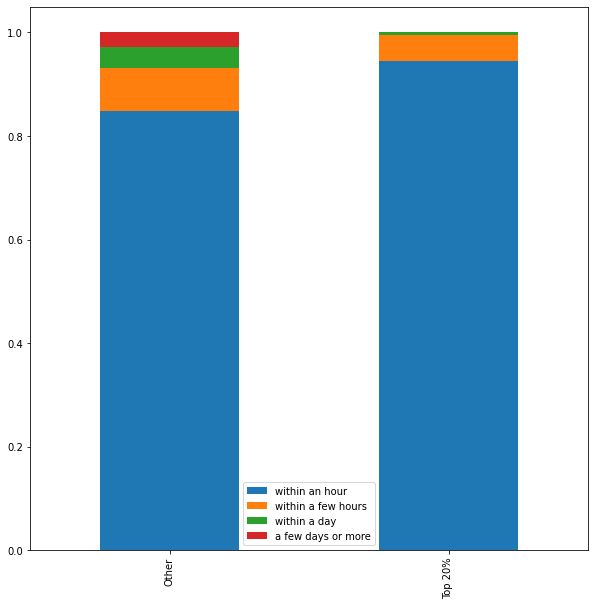

In [ ]:
merge_resp_time = pd.merge(right = top_20_pct_low['host_response_time'].value_counts(normalize = True),
                          left = low_price_df[low_price_df['is_top_20_pct'] == 'f']['host_response_time'].value_counts(normalize = True),
                          left_index = True,
                          right_index = True,
                          how = 'left').fillna(0).rename(columns = {'host_response_time_x':'Other', 'host_response_time_y':'Top 20%'}).T
display(merge_resp_time)

merge_resp_time.plot(kind = 'bar', stacked = True, figsize = (10,10))

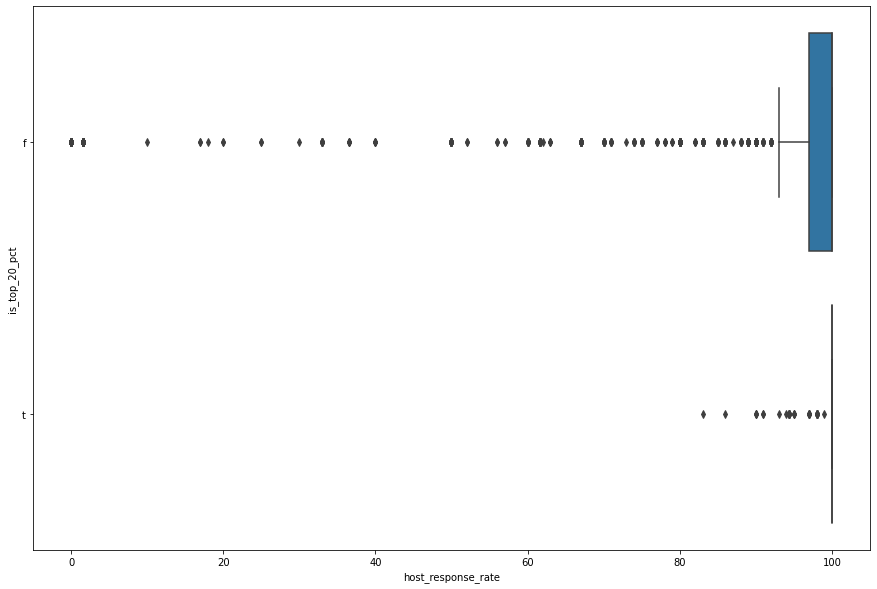

In [ ]:
plt.figure(figsize = (15,10))
# plt.subplot(211)
# sns.histplot(data = top_20_pct_low,
#               x = 'host_response_rate')

# plt.subplot(212)
# sns.histplot(data = low_price_df,
#               x = 'host_response_rate',
#              hue = 'is_top_20_pct')

sns.boxplot(data = low_price_df,
            x = 'host_response_rate',
            y = 'is_top_20_pct')

,host_response_rate
is_top_20_pct,
Other,94.974954
Top 20%,99.461378


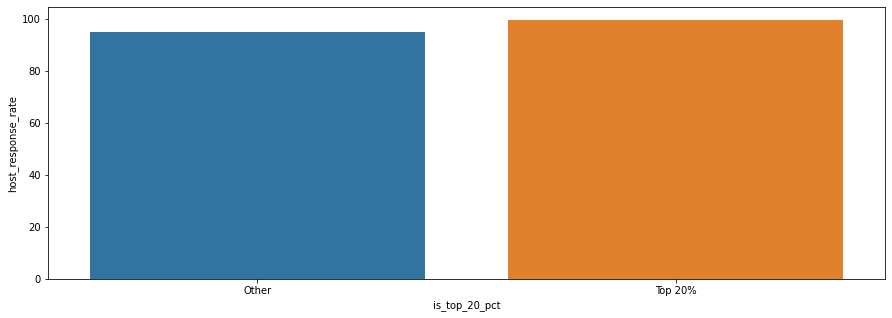

In [ ]:
response_rate_mean = low_price_df.groupby('is_top_20_pct')[['host_response_rate']].mean().rename(index = {'f':'Other', 't':'Top 20%'})
display(response_rate_mean)
plt.figure(figsize = (15,5))
sns.barplot(data = response_rate_mean,
            x = response_rate_mean.index,
            y = 'host_response_rate')

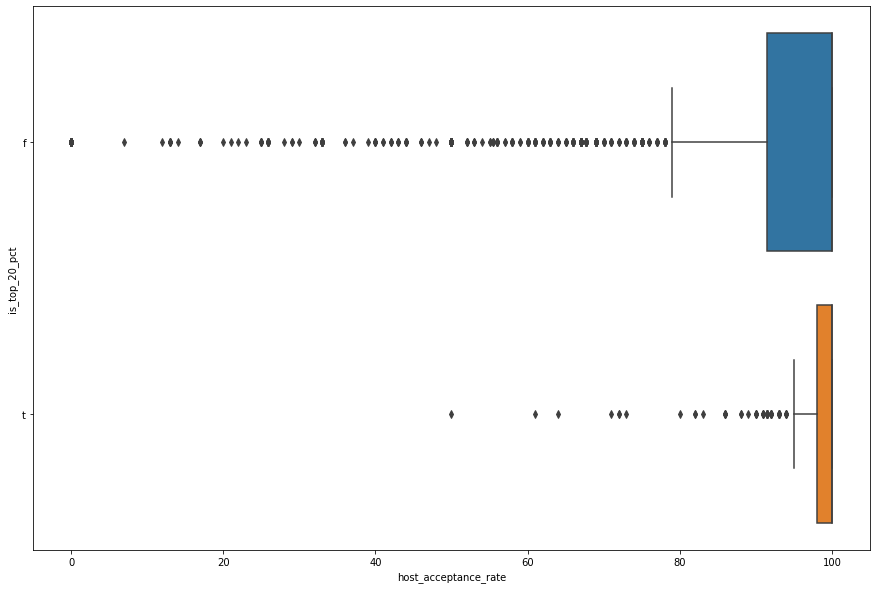

In [ ]:
plt.figure(figsize = (15,10))

# plt.subplot(211)
# sns.histplot(data = top_20_pct_low,
#               x = 'host_acceptance_rate')

# plt.subplot(212)
# sns.histplot(data = low_price_df,
#               x = 'host_acceptance_rate',
#              hue = 'is_top_20_pct')

sns.boxplot(data = low_price_df,
            x = 'host_acceptance_rate',
            y = 'is_top_20_pct')

,host_acceptance_rate
is_top_20_pct,
Other,91.347605
Top 20%,97.785226


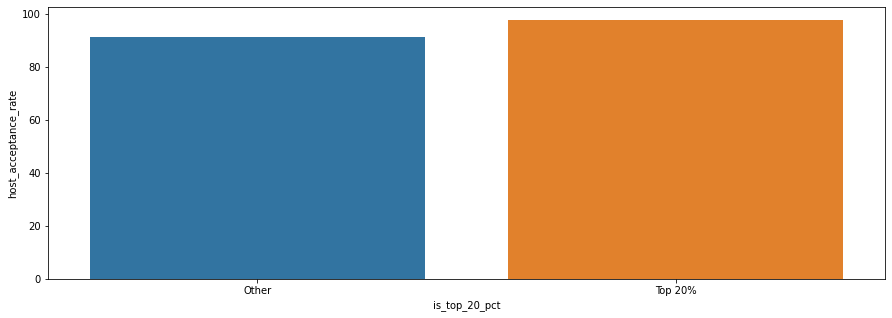

In [ ]:
acceptance_rate_mean = low_price_df.groupby('is_top_20_pct')[['host_acceptance_rate']].mean().rename(index = {'f':'Other', 't':'Top 20%'})
display(acceptance_rate_mean)
plt.figure(figsize = (15,5))
sns.barplot(data = acceptance_rate_mean,
            x = acceptance_rate_mean.index,
            y = 'host_acceptance_rate')

As it can be seen, hosts in general, not just the top 20% are expected to always respond and respond immediately, specifically within an hour. There are still some flexibility in response time, but the top 20% group latest reply should be within a day as oppose to several days like the other group

The top 20% group is very strict with their response rate as well as acceptance rate since both remains nearly 100%, even the lower whisker is close to the 100% mark. While the other group have lower whisker as low as 90% and 80% respectively

,f,t
Other,0.691329,0.308671
Top 20%,0.462766,0.537234


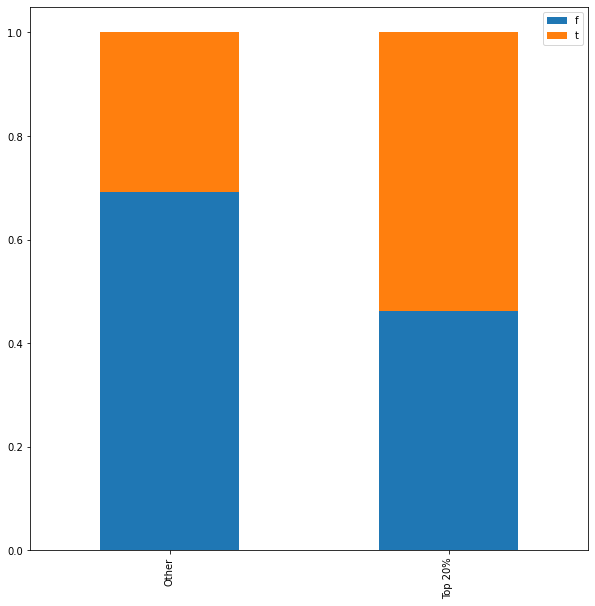

In [ ]:
superhost_val_20 = top_20_pct_low['host_is_superhost'].value_counts(normalize = True)
superhost_val_all = low_price_df[low_price_df['is_top_20_pct'] == 'f']['host_is_superhost'].value_counts(normalize = True)

merge_acc_rate = pd.merge(left = superhost_val_all,
                          right = superhost_val_20,
                          left_index = True,
                          right_index = True).rename(columns = {'host_is_superhost_x':'Other', 'host_is_superhost_y':'Top 20%'}).T
display(merge_acc_rate)
merge_acc_rate.plot(kind = 'bar', stacked = True, figsize = (10,10))

,t,f
Other,0.993097,0.006903
Top 20%,0.981383,0.018617


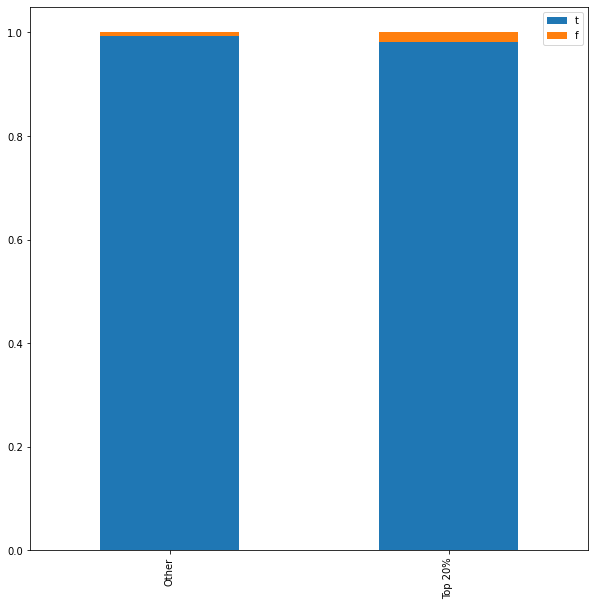

In [ ]:
profile_pic_val_20 = top_20_pct_low['host_has_profile_pic'].value_counts(normalize = True)
profile_pic_val_all = low_price_df[low_price_df['is_top_20_pct'] == 'f']['host_has_profile_pic'].value_counts(normalize = True)

merge_profile_pic = pd.merge(right = profile_pic_val_20,
                          left = profile_pic_val_all,
                          left_index = True,
                          right_index = True).rename(columns = {'host_has_profile_pic_x':'Other', 'host_has_profile_pic_y':'Top 20%'}).T
display(merge_profile_pic)
merge_profile_pic.plot(kind = 'bar', stacked = True, figsize = (10,10))

,t,f
Other,0.773080,0.226920
Top 20%,0.824468,0.175532


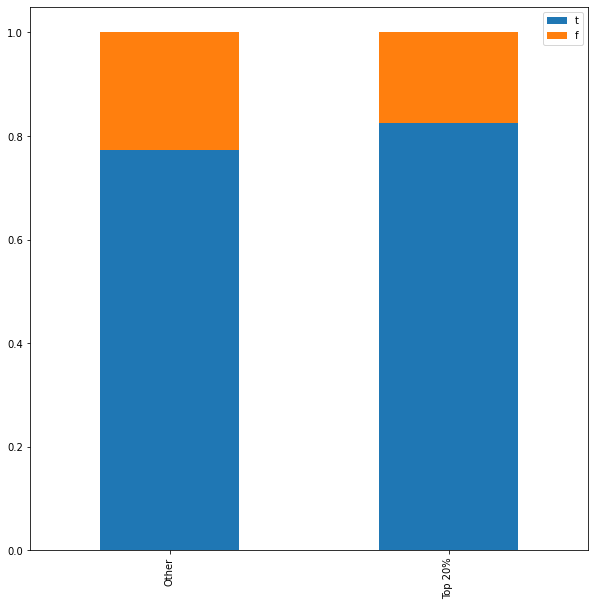

In [ ]:
host_iden_val_20 = top_20_pct_low['host_identity_verified'].value_counts(normalize = True)
host_iden_val_all = low_price_df[low_price_df['is_top_20_pct'] == 'f']['host_identity_verified'].value_counts(normalize = True)

merge_host_iden_pic = pd.merge(right = host_iden_val_20,
                               left = host_iden_val_all,
                               left_index = True,
                               right_index = True).rename(columns = {'host_identity_verified_x':'Other', 'host_identity_verified_y':'Top 20%'}).T
display(merge_host_iden_pic)
merge_host_iden_pic.plot(kind = 'bar', stacked = True, figsize = (10,10))

,Entire rental unit,Entire condo,Other
Other,0.625539,0.204271,0.17019
Top 20%,0.417553,0.457447,0.12500


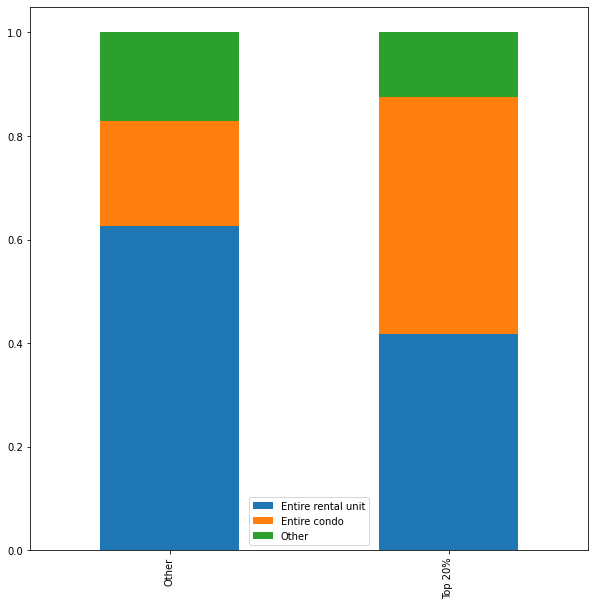

In [ ]:
prop_type_val_20 = top_20_pct_low['property_type_cat'].value_counts(normalize = True)
prop_type_val_all = low_price_df[low_price_df['is_top_20_pct'] == 'f']['property_type_cat'].value_counts(normalize = True)

merge_prop_type_pic = pd.merge(right = prop_type_val_20,
                               left = prop_type_val_all,
                               left_index = True,
                               right_index = True).rename(columns = {'property_type_cat_x':'Other', 'property_type_cat_y':'Top 20%'}).T
display(merge_prop_type_pic)
merge_prop_type_pic.plot(kind = 'bar', stacked = True, figsize = (10,10))

,Entire home/apt,Private room,Shared room,Hotel room
Other,0.887619,0.099871,0.011001,0.00151
Top 20%,0.960106,0.039894,0.000000,0.00000


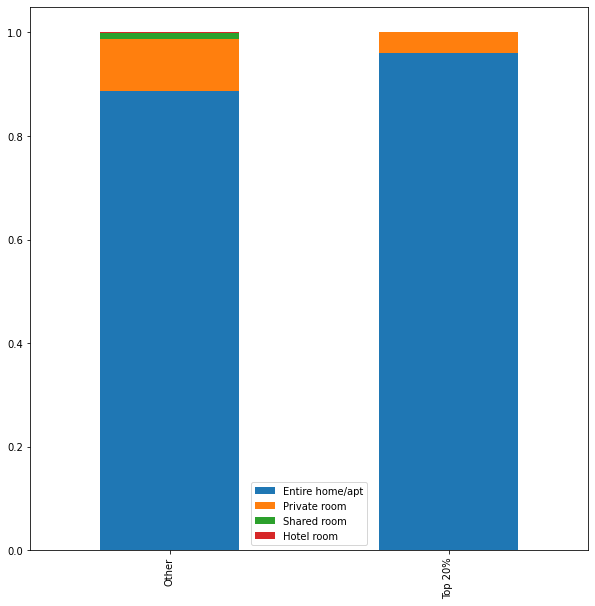

In [ ]:
room_type_val_20 = top_20_pct_low['room_type'].value_counts(normalize = True)
room_type_val_all = low_price_df[low_price_df['is_top_20_pct'] == 'f']['room_type'].value_counts(normalize = True)

merge_room_type = pd.merge(right = room_type_val_20,
                           left = room_type_val_all,
                           left_index = True,
                           right_index = True,
                           how = 'left').rename(columns = {'room_type_x':'Other', 'room_type_y':'Top 20%'}).fillna(0).T
display(merge_room_type)
merge_room_type.plot(kind = 'bar', stacked = True, figsize = (10,10))

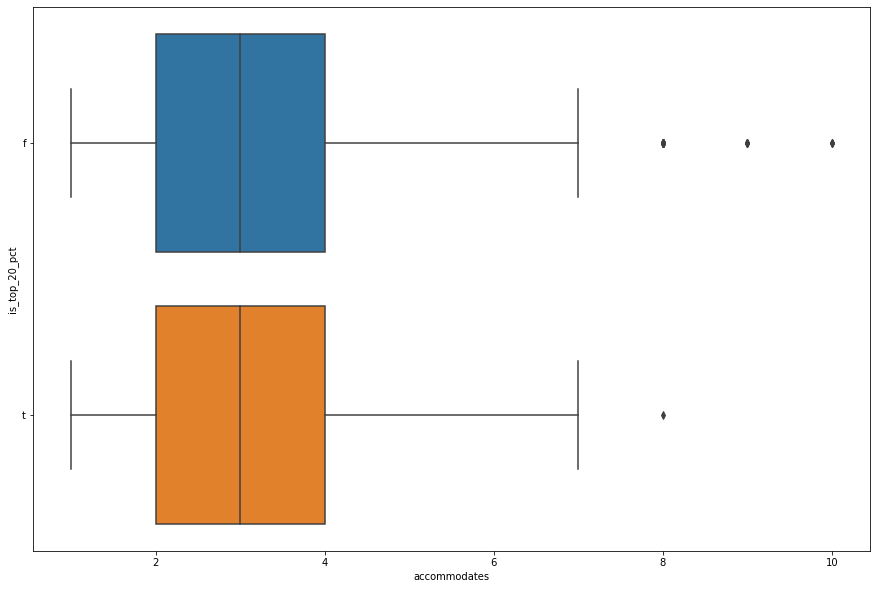

In [ ]:
plt.figure(figsize = (15,10))

# accom_val_20 = top_20_pct_low['accommodates'].value_counts(normalize = True)
# accom_val_all = low_price_df[low_price_df['is_top_20_pct'] == 'f']['accommodates'].value_counts(normalize = True)

# merge_accom = pd.merge(right = accom_val_20,
#                            left = accom_val_all,
#                            left_index = True,
#                            right_index = True,
#                            how = 'left').rename(columns = {'accommodates_x':'Other', 'accommodates_y':'Top 20%'}).fillna(0).T
# display(merge_accom)
# merge_accom.plot(kind = 'bar', stacked = True, figsize = (10,10))

sns.boxplot(data = low_price_df,
            x = 'accommodates',
            y = 'is_top_20_pct')

,1 bath,1.5 baths,1 shared bath,1.5 shared baths,1 private bath,2 baths,2 shared baths,3 shared baths,3 baths,4 shared baths,Half-bath,2.5 baths,0 baths,2.5 shared baths,0 shared baths,Shared half-bath,5 shared baths
Other,0.792709,0.087144,0.048102,0.019845,0.019198,0.014021,0.006687,0.005393,0.001726,0.001294,0.001079,0.000647,0.000647,0.000647,0.000431,0.000216,0.000216
Top 20%,0.896277,0.045213,0.018617,0.002660,0.010638,0.023936,0.002660,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


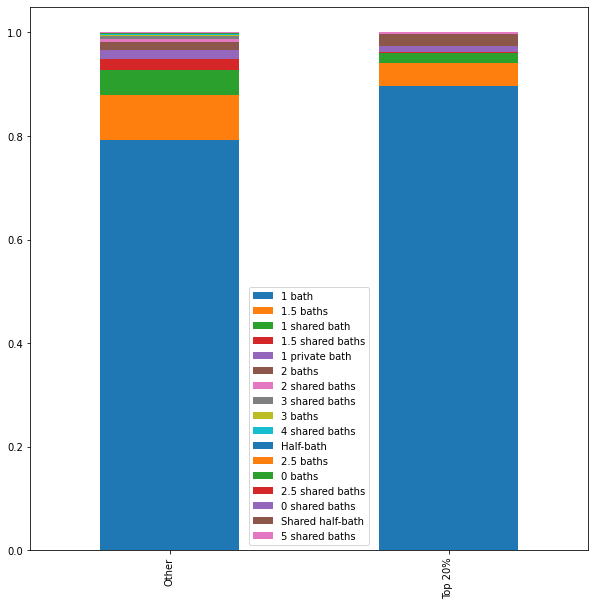

In [ ]:
# plt.figure(figsize = (15,15))

# plt.subplot(211)
# sns.countplot(data = top_20_pct_low,
#               y = 'bathrooms_text')

# plt.subplot(212)
# sns.countplot(data = low_price_df,
#               y = 'bathrooms_text',
#              hue = 'is_top_20_pct')

bath_val_20 = top_20_pct_low['bathrooms_text'].value_counts(normalize = True)
bath_val_all = low_price_df[low_price_df['is_top_20_pct'] == 'f']['bathrooms_text'].value_counts(normalize = True)

merge_bath = pd.merge(right = bath_val_20,
                           left = bath_val_all,
                           left_index = True,
                           right_index = True,
                           how = 'left').rename(columns = {'bathrooms_text_x':'Other', 'bathrooms_text_y':'Top 20%'}).fillna(0).T
display(merge_bath)
merge_bath.plot(kind = 'bar', stacked = True, figsize = (10,10))

,1.0,2.0,3.0,4.0,5.0,6.0,8.0,7.0,10.0
Other,0.499784,0.331536,0.110009,0.045082,0.009060,0.00302,0.001079,0.000216,0.000216
Top 20%,0.507979,0.337766,0.117021,0.026596,0.010638,0.00000,0.000000,0.000000,0.000000


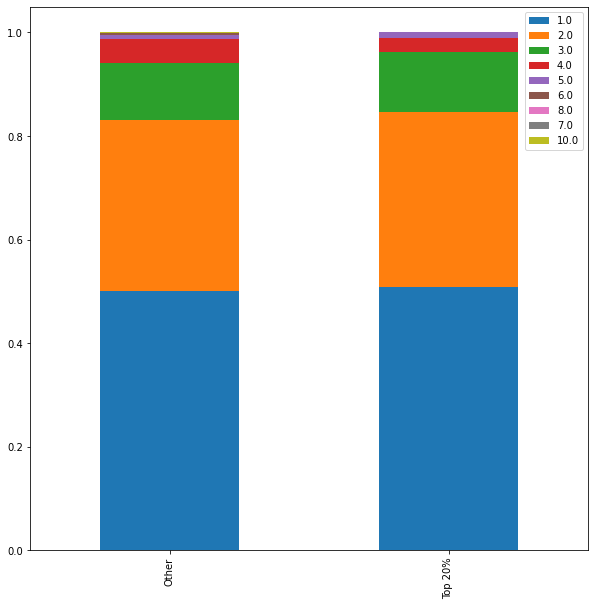

In [ ]:
beds_val_20 = top_20_pct_low['beds'].value_counts(normalize = True)
beds_val_all = low_price_df[low_price_df['is_top_20_pct'] == 'f']['beds'].value_counts(normalize = True)

merge_beds = pd.merge(right = beds_val_20,
                           left = beds_val_all,
                           left_index = True,
                           right_index = True,
                           how = 'left').rename(columns = {'beds_x':'Other', 'beds_y':'Top 20%'}).fillna(0).T
display(merge_beds)
merge_beds.plot(kind = 'bar', stacked = True, figsize = (10,10))

,1.0,2.0,3.0,4.0,5.0
Other,0.794651,0.185289,0.016825,0.002588,0.000647
Top 20%,0.853723,0.138298,0.007979,0.000000,0.000000


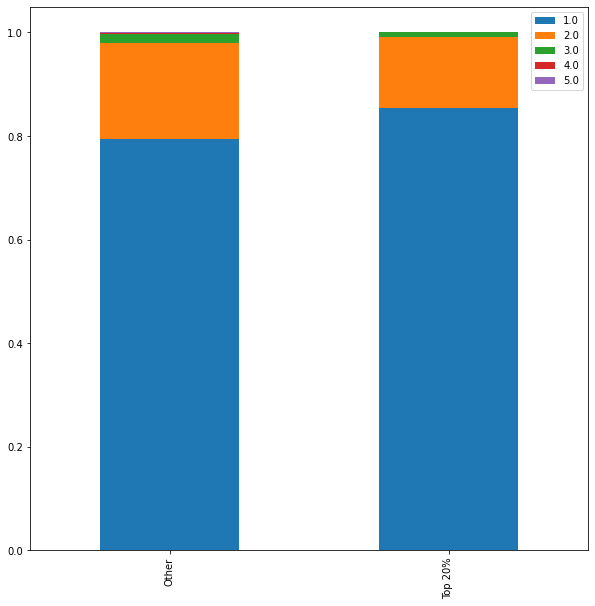

In [ ]:
# plt.figure(figsize = (15,15))

# plt.subplot(211)
# sns.countplot(data = top_20_pct_low,
#               y = 'bedrooms')

# plt.subplot(212)
# sns.countplot(data = low_price_df,
#               y = 'bedrooms',
#              hue = 'is_top_20_pct')

bedrooms_val_20 = top_20_pct_low['bedrooms'].value_counts(normalize = True)
bedrooms_val_all = low_price_df[low_price_df['is_top_20_pct'] == 'f']['bedrooms'].value_counts(normalize = True)

merge_bedrooms = pd.merge(right = bedrooms_val_20,
                          left = bedrooms_val_all,
                          left_index = True,
                          right_index = True,
                          how = 'left').rename(columns = {'bedrooms_x':'Other', 'bedrooms_y':'Top 20%'}).fillna(0).T
display(merge_bedrooms)
merge_bedrooms.plot(kind = 'bar', stacked = True, figsize = (10,10))

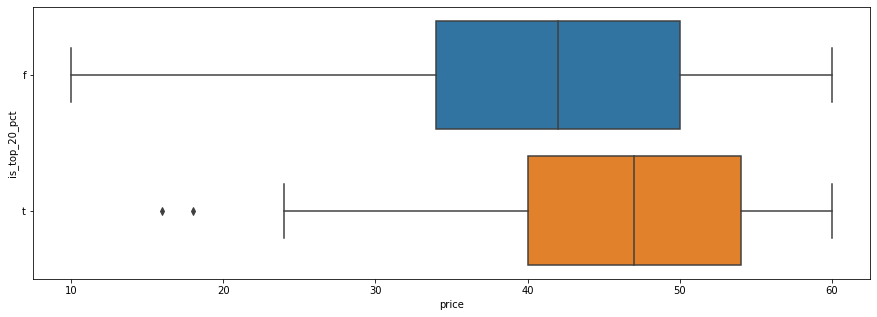

In [ ]:
plt.figure(figsize = (15,5))

# plt.subplot(211)
# sns.boxplot(data = top_20_pct_low,
#               x = 'price')

# plt.subplot(212)
sns.boxplot(data = low_price_df,
              x = 'price',
             y = 'is_top_20_pct')

Generally speaking, those who manage to reach the top 20% group tend to be able to charge at a slightly higher price

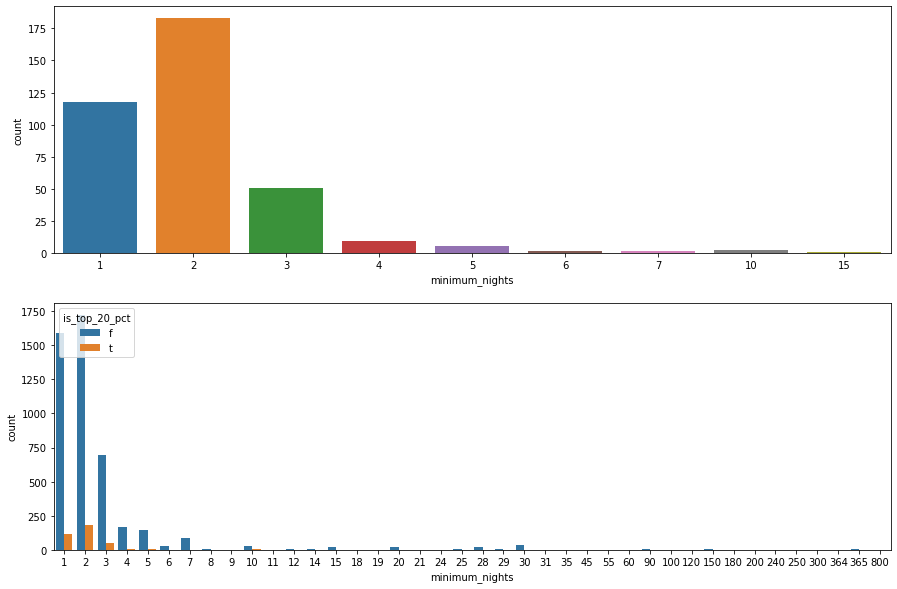

In [ ]:
plt.figure(figsize = (15,10))

plt.subplot(211)
sns.countplot(data = top_20_pct_low,
              x = 'minimum_nights')

plt.subplot(212)
sns.countplot(data = low_price_df,
              x = 'minimum_nights',
             hue = 'is_top_20_pct')

(0.0, 20.0)

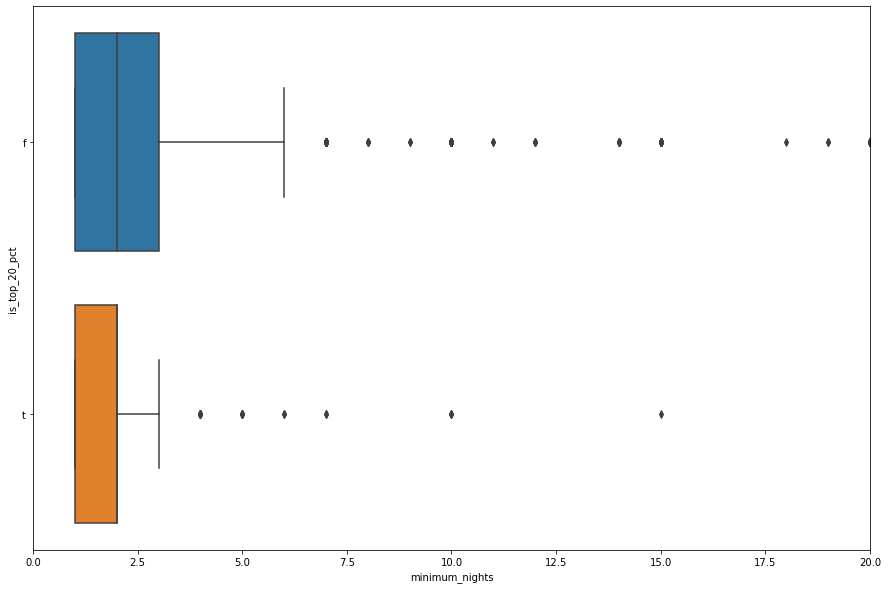

In [ ]:
plt.figure(figsize = (15,10))
sns.boxplot(data = low_price_df,
            x = 'minimum_nights',
            y = 'is_top_20_pct')
plt.xlim(0,20)

The top 20% group tend to offer greater staying flexibility compare to the other group, since the upper whisker of the top 20% group only reach as far as over 2 nights, while the upper whisker of the other group can reach as high as over 5 nights of minimum staying time

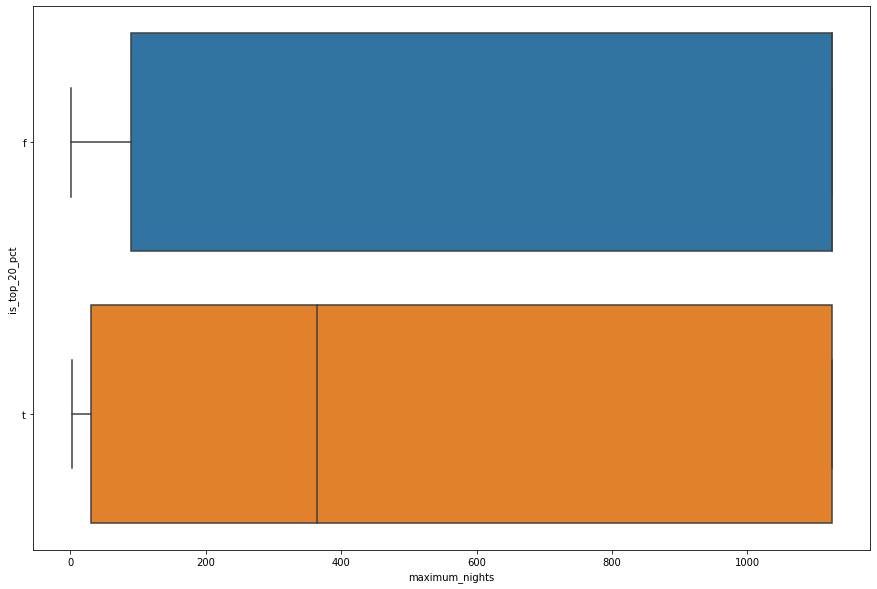

In [ ]:
plt.figure(figsize = (15,10))

# plt.subplot(211)
# sns.histplot(data = top_20_pct_low,
#               x = 'maximum_nights')

# plt.subplot(212)
# sns.histplot(data = low_price_df,
#               x = 'maximum_nights',
#              hue = 'is_top_20_pct',
#              multiple="dodge")
sns.boxplot(data = low_price_df,
            x = 'maximum_nights',
            y = 'is_top_20_pct')

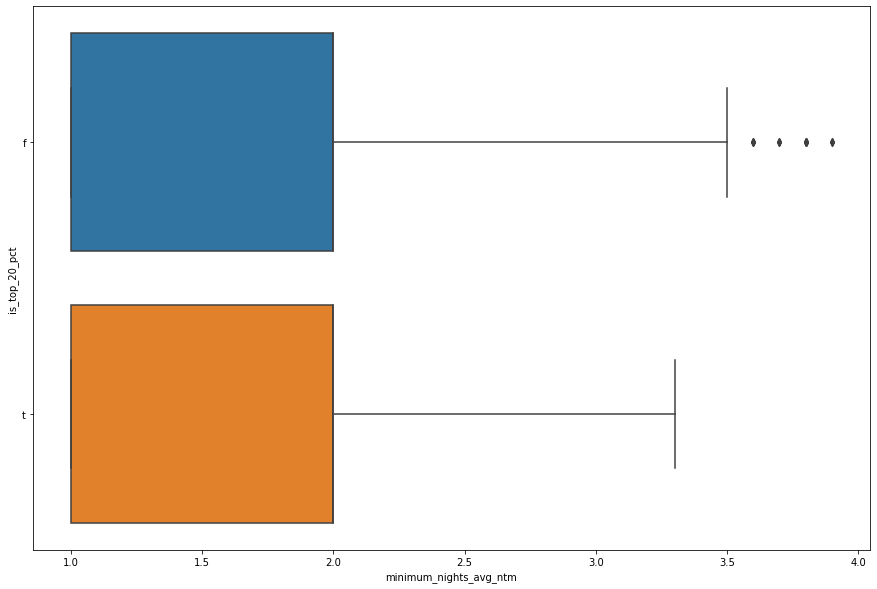

In [ ]:
plt.figure(figsize = (15,10))

# plt.subplot(211)
# sns.histplot(data = top_20_pct_low,
#               y = 'minimum_nights_avg_ntm',
#              binwidth = 2)

# plt.subplot(212)
# sns.histplot(data = low_price_df,
#               y = 'minimum_nights_avg_ntm',
#              hue = 'is_top_20_pct',
#               binwidth = 2)

# print(low_price_df['minimum_nights_avg_ntm'].value_counts())
low_price_df_cp = low_price_df.copy()
q1_minimum_nights_avg = np.quantile(low_price_df_cp['minimum_nights_avg_ntm'], 0.25)
q3_minimum_nights_avg = np.quantile(low_price_df_cp['minimum_nights_avg_ntm'], 0.75)
iqr_minimum_nights_avg = q3_minimum_nights_avg - q1_minimum_nights_avg
low_price_df_cp = low_price_df_cp[(low_price_df_cp['minimum_nights_avg_ntm'] > q1_minimum_nights_avg - 1.5 * iqr_minimum_nights_avg) &
                                  (low_price_df_cp['minimum_nights_avg_ntm'] < q1_minimum_nights_avg + 1.5 * iqr_minimum_nights_avg)]
sns.boxplot(data = low_price_df_cp,
            x = 'minimum_nights_avg_ntm',
            y = 'is_top_20_pct')

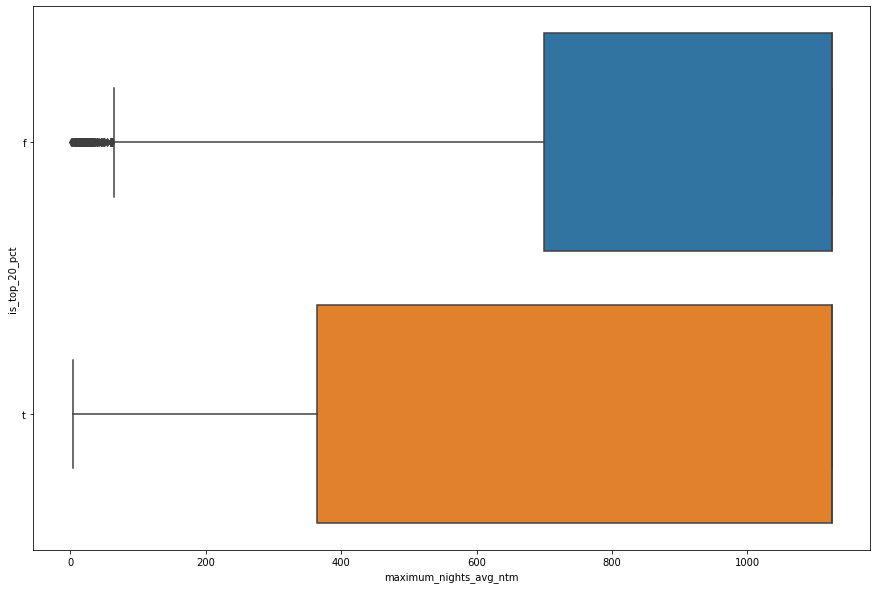

In [ ]:
plt.figure(figsize = (15,10))

# plt.subplot(211)
# sns.histplot(data = top_20_pct_low,
#               y = 'maximum_nights_avg_ntm',
#              binwidth = 10)

# plt.subplot(212)
# sns.histplot(data = low_price_df,
#               y = 'maximum_nights_avg_ntm',
#              hue = 'is_top_20_pct',
#               binwidth = 10)

# print(low_price_df['maximum_nights_avg_ntm'].value_counts())

sns.boxplot(data = low_price_df,
            x = 'maximum_nights_avg_ntm',
            y = 'is_top_20_pct')

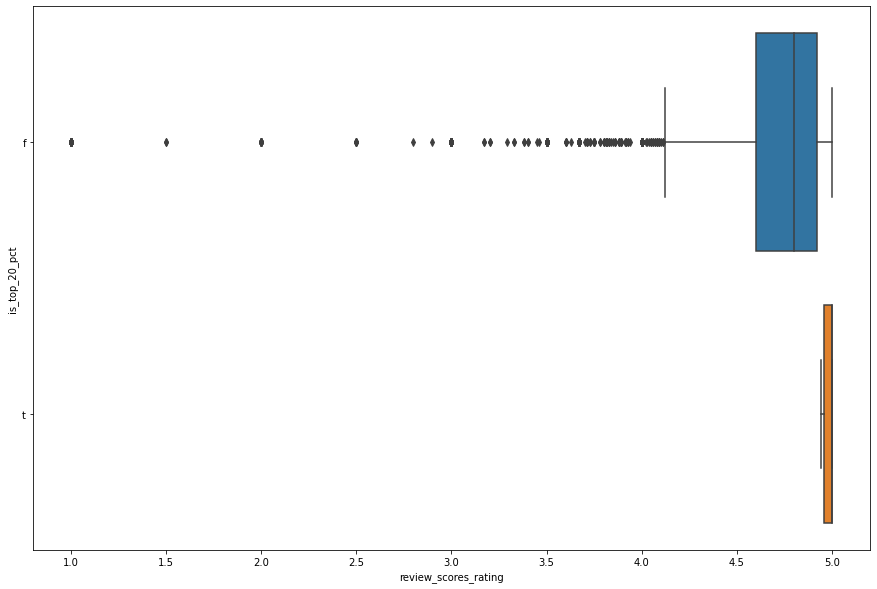

In [ ]:
plt.figure(figsize = (15,10))

# plt.subplot(211)
# sns.histplot(data = top_20_pct_low,
#               x = 'review_scores_rating')

# plt.subplot(212)
# sns.histplot(data = low_price_df,
#               x = 'review_scores_rating',
#              hue = 'is_top_20_pct')
sns.boxplot(data = low_price_df,
            x = 'review_scores_rating',
            y = 'is_top_20_pct')

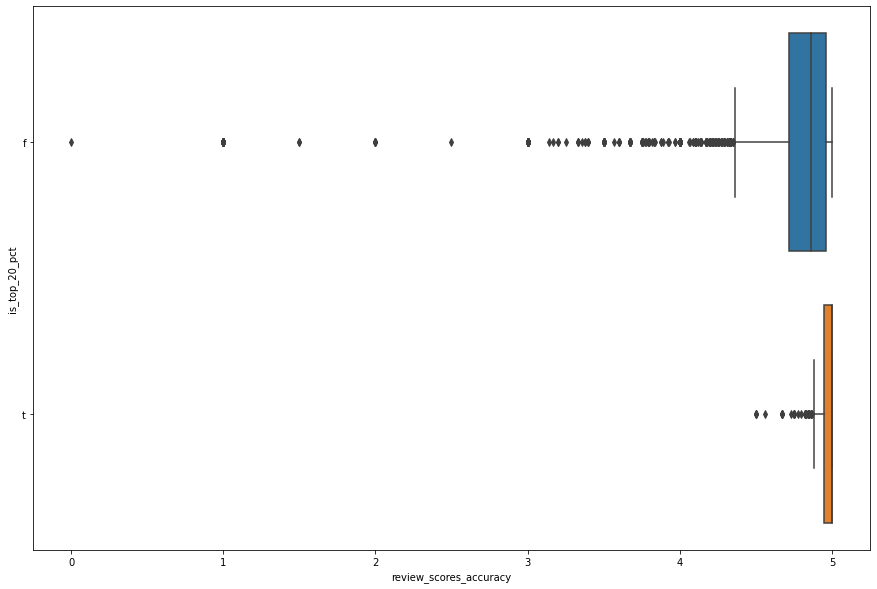

In [ ]:
plt.figure(figsize = (15,10))

# plt.subplot(211)
# sns.histplot(data = top_20_pct_low,
#               x = 'review_scores_accuracy')

# plt.subplot(212)
# sns.histplot(data = low_price_df,
#               x = 'review_scores_accuracy',
#              hue = 'is_top_20_pct')

sns.boxplot(data = low_price_df,
            x = 'review_scores_accuracy',
            y = 'is_top_20_pct')

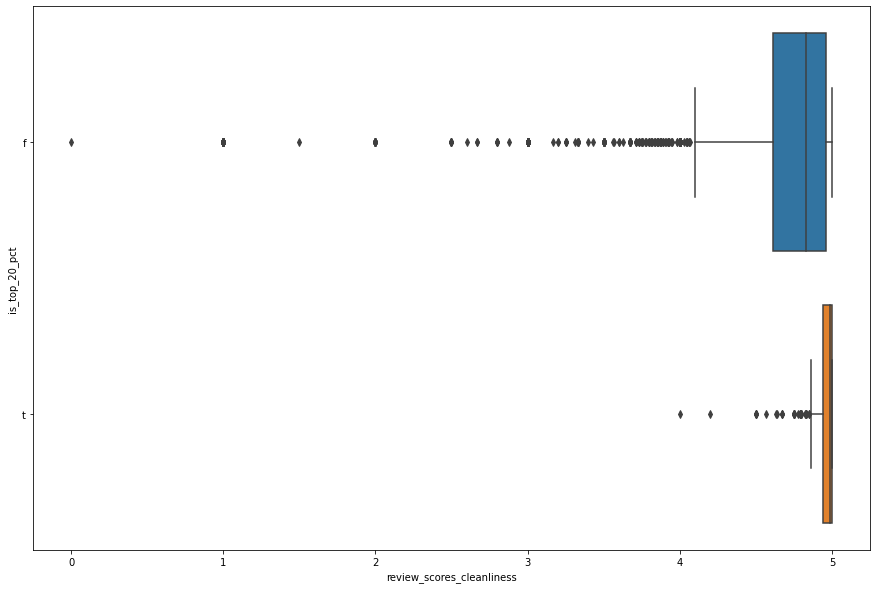

In [ ]:
plt.figure(figsize = (15,10))

# plt.subplot(211)
# sns.histplot(data = top_20_pct_low,
#               x = 'review_scores_cleanliness')

# plt.subplot(212)
# sns.histplot(data = low_price_df,
#               x = 'review_scores_cleanliness',
#              hue = 'is_top_20_pct')

sns.boxplot(data = low_price_df,
            x = 'review_scores_cleanliness',
            y = 'is_top_20_pct')

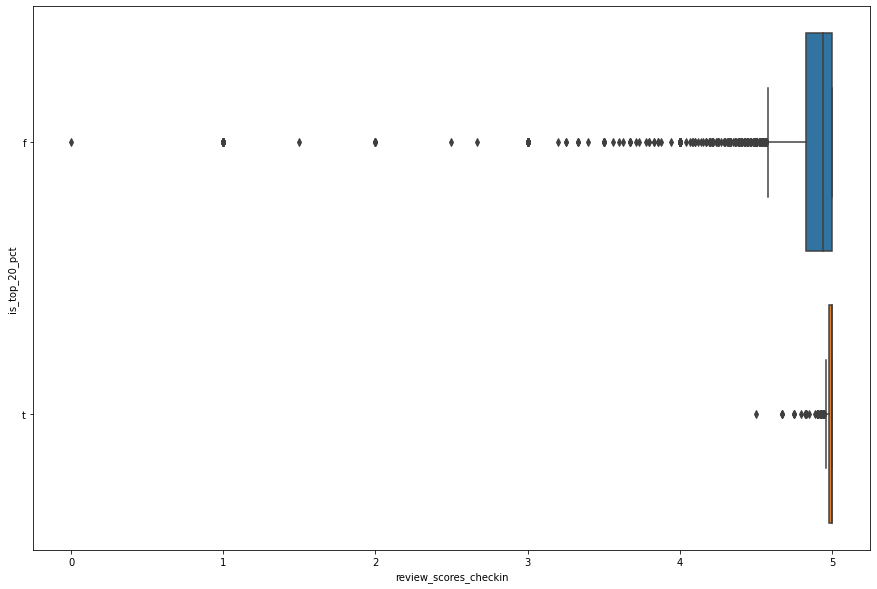

In [ ]:
plt.figure(figsize = (15,10))

# plt.subplot(211)
# sns.histplot(data = top_20_pct_low,
#               x = 'review_scores_checkin')

# plt.subplot(212)
# sns.histplot(data = low_price_df,
#               x = 'review_scores_checkin',
#              hue = 'is_top_20_pct')

sns.boxplot(data = low_price_df,
            x = 'review_scores_checkin',
            y = 'is_top_20_pct')

The range of checkin score of the top 20% is extremely tight compare to that of the other group, nearly at 5, even the lower whisker is very close to 5. This could indicate that hosts in the top 20% group put great importance in checkin flexibility and provide easy check in for the customers with various checkin methods

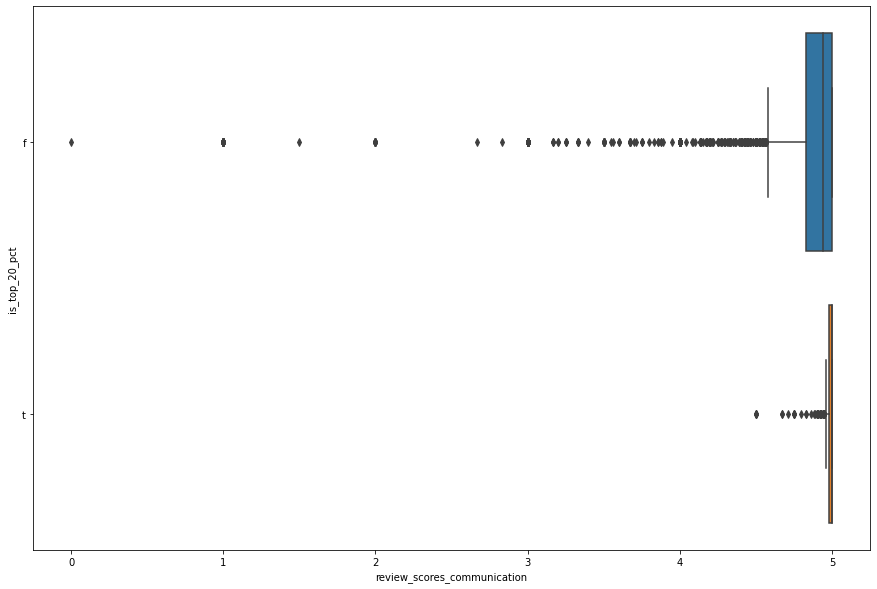

In [ ]:
plt.figure(figsize = (15,10))

# plt.subplot(211)
# sns.histplot(data = top_20_pct_low,
#               x = 'review_scores_communication')

# plt.subplot(212)
# sns.histplot(data = low_price_df,
#               x = 'review_scores_communication',
#              hue = 'is_top_20_pct')

sns.boxplot(data = low_price_df,
            x = 'review_scores_communication',
            y = 'is_top_20_pct')

Similar to checkin score, communication score range is also extremely tight, with lower whisker nearly at maximum score. This further reinforce the findings above where top 20% hosts need to reply within 1 hour and always reply. But that is not all, this could also regard to any form of communications during the staying of customer

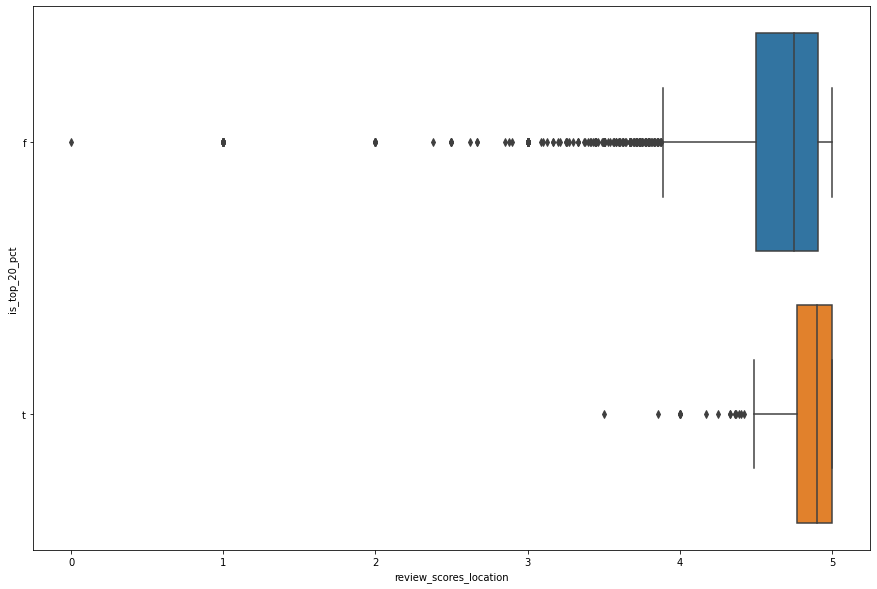

In [ ]:
plt.figure(figsize = (15,10))

# plt.subplot(211)
# sns.histplot(data = top_20_pct_low,
#               x = 'review_scores_location')

# plt.subplot(212)
# sns.histplot(data = low_price_df,
#               x = 'review_scores_location',
#              hue = 'is_top_20_pct')

sns.boxplot(data = low_price_df,
            x = 'review_scores_location',
            y = 'is_top_20_pct')

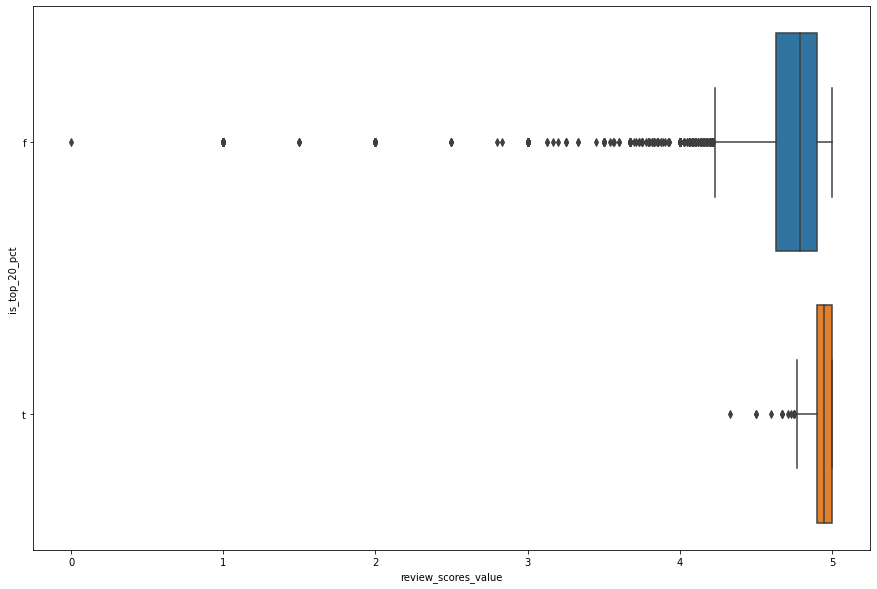

In [ ]:
plt.figure(figsize = (15,10))

# plt.subplot(211)
# sns.histplot(data = top_20_pct_low,
#               x = 'review_scores_value')

# plt.subplot(212)
# sns.histplot(data = low_price_df,
#               x = 'review_scores_value',
#              hue = 'is_top_20_pct')

sns.boxplot(data = low_price_df,
            x = 'review_scores_value',
            y = 'is_top_20_pct')

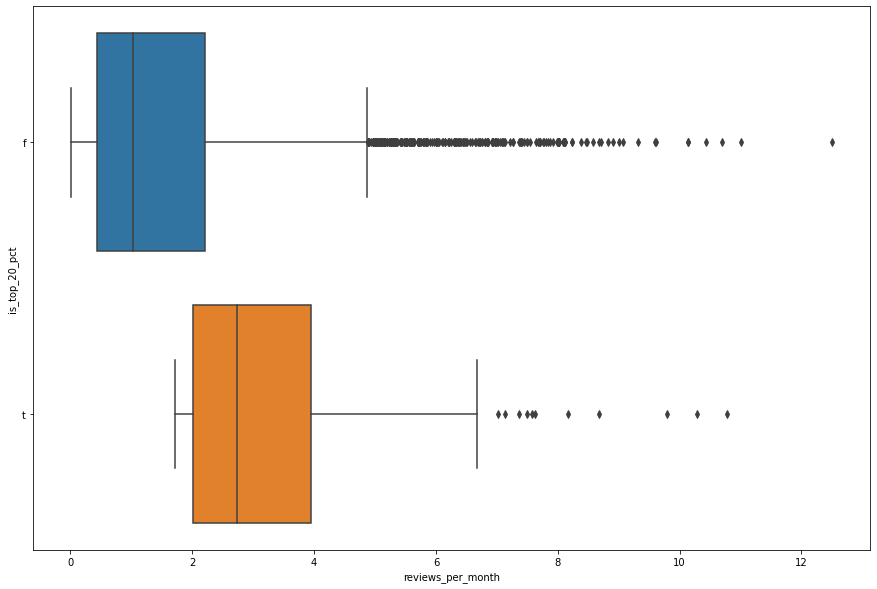

In [ ]:
plt.figure(figsize = (15,10))

# plt.subplot(211)
# sns.histplot(data = top_20_pct_low,
#               x = 'reviews_per_month')

# plt.subplot(212)
# sns.histplot(data = low_price_df,
#               x = 'reviews_per_month',
#              hue = 'is_top_20_pct')

sns.boxplot(data = low_price_df,
            x = 'reviews_per_month',
            y = 'is_top_20_pct')

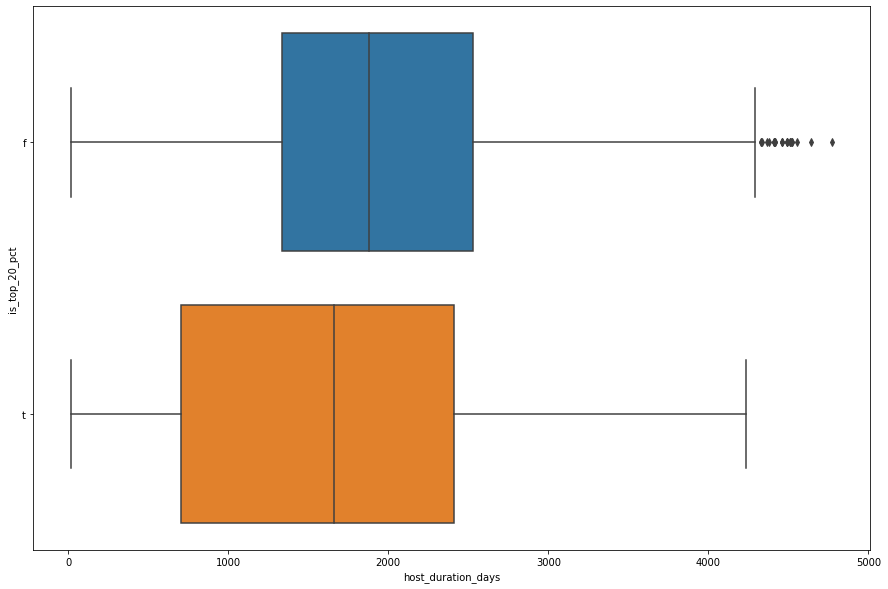

In [ ]:
plt.figure(figsize = (15,10))

# plt.subplot(211)
# sns.histplot(data = top_20_pct_low,
#               x = 'host_duration_days')

# plt.subplot(212)
# sns.histplot(data = low_price_df,
#               x = 'host_duration_days',
#              hue = 'is_top_20_pct')

sns.boxplot(data = low_price_df,
            x = 'host_duration_days',
            y = 'is_top_20_pct')

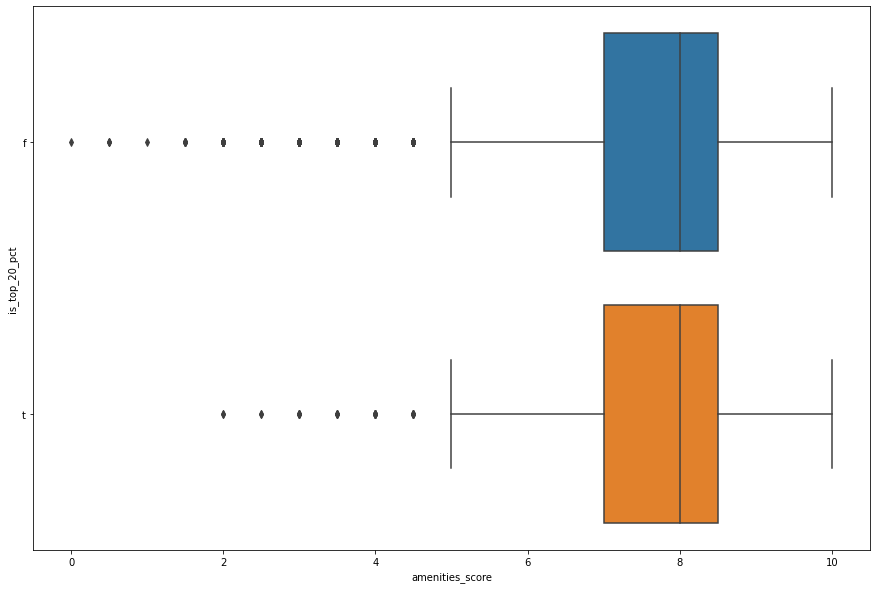

In [ ]:
plt.figure(figsize = (15,10))
sns.boxplot(data = low_price_df,
            x = 'amenities_score',
            y = 'is_top_20_pct')

In [ ]:
# Get top items from top 20% and other
top_items_20_pct = pd.DataFrame(top_20_pct_low['amenities'].str.get_dummies(sep = ',').sum().sort_values(ascending = False)[0:10]).reset_index().rename(columns = {'index':'Items', 0:'Count'})
top_items_other = pd.DataFrame(low_price_df.loc[low_price_df['is_top_20_pct'] == 'f','amenities'].str.get_dummies(sep = ',').sum().sort_values(ascending = False)[0:10]).reset_index().rename(columns = {'index':'Items', 0:'Count'})

In [ ]:
a = top_items_20_pct['Items'].sort_values().values
b = top_items_other['Items'].sort_values().values
sim = [x for x in a if x in b]
diff_a = [x for x in a if x not in b]
diff_b = [x for x in b if x not in a]
print(sim)
print(diff_a)
print(diff_b)

['Dishes and silverware', 'Essentials', 'Hair dryer', 'Hangers', 'Hot water', 'Iron', 'Kitchen', 'Long term stays allowed', 'Wifi']
['Cooking basics']
['Shampoo']


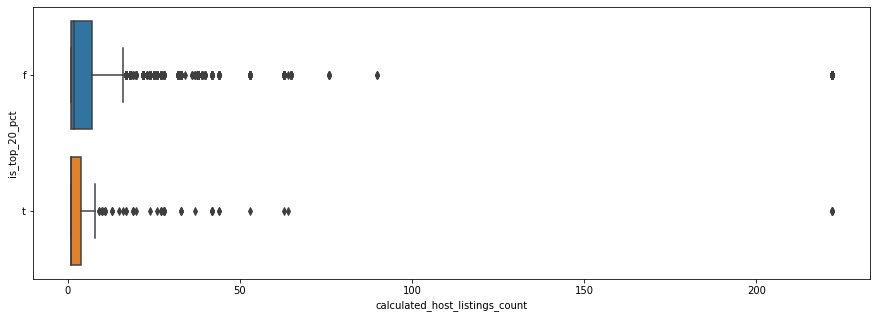

In [ ]:
plt.figure(figsize = (15,5))
# sns.histplot(data = top_20_pct_low.groupby('host_id')[['calculated_host_listings_count']].max(),
#              x = 'calculated_host_listings_count',
#              binwidth = 2)

sns.boxplot(data = low_price_df,
            x = 'calculated_host_listings_count',
            y = 'is_top_20_pct')

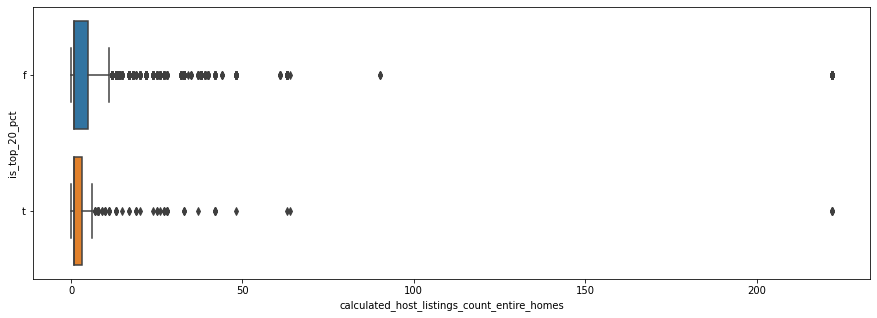

In [ ]:
plt.figure(figsize = (15,5))
# sns.histplot(data = top_20_pct_low.groupby('host_id')[['calculated_host_listings_count_entire_homes']].max(),
#              x = 'calculated_host_listings_count_entire_homes',
#              binwidth = 2)
sns.boxplot(data = low_price_df,
            x = 'calculated_host_listings_count_entire_homes',
            y = 'is_top_20_pct')

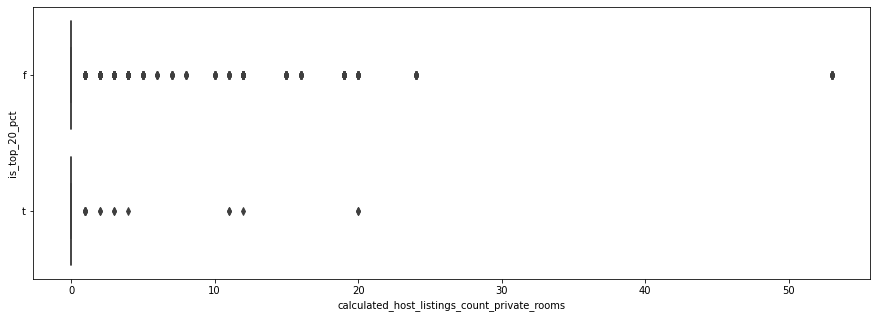

In [ ]:
plt.figure(figsize = (15,5))
# sns.histplot(data = top_20_pct_low.groupby('host_id')[['calculated_host_listings_count_private_rooms']].max(),
#              x = 'calculated_host_listings_count_private_rooms')
sns.boxplot(data = low_price_df,
            x = 'calculated_host_listings_count_private_rooms',
            y = 'is_top_20_pct')

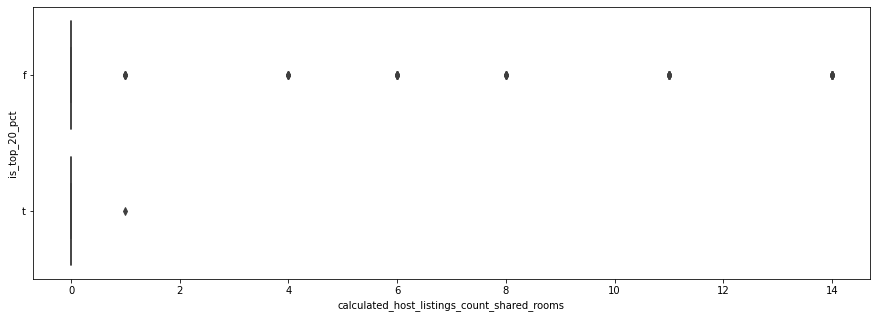

In [ ]:
plt.figure(figsize = (15,5))
# sns.histplot(data = top_20_pct_low.groupby('host_id')[['calculated_host_listings_count_shared_rooms']].max(),
#              x = 'calculated_host_listings_count_shared_rooms')
sns.boxplot(data = low_price_df,
            x = 'calculated_host_listings_count_shared_rooms',
            y = 'is_top_20_pct')

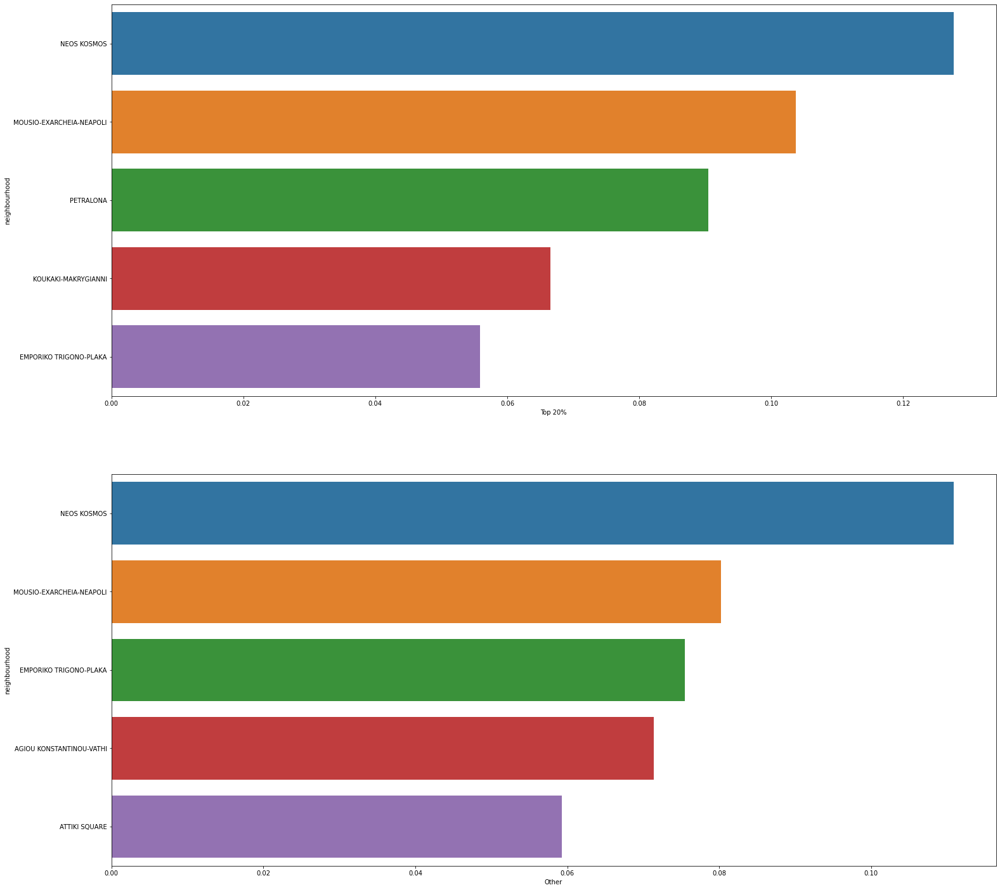

In [ ]:
# Neighbourhood
top_20_pct_neigh = top_20_pct_low['neighbourhood_eng'].value_counts(normalize = True).sort_values(ascending = False)[0:5].reset_index().rename(columns = {'index':'neighbourhood','neighbourhood_eng':'Top 20%'})
other_neigh = low_price_df.loc[low_price_df['is_top_20_pct'] == 'f', 'neighbourhood_eng'].value_counts(normalize = True)[0:5].sort_values(ascending = False).reset_index().rename(columns = {'index':'neighbourhood','neighbourhood_eng':'Other'})
merge_neigh_20_all = pd.merge(left = top_20_pct_neigh,
                              right = other_neigh,
                              left_on = 'neighbourhood',
                              right_on = 'neighbourhood').set_index('neighbourhood')

plt.figure(figsize = (25,25))

plt.subplot(211)
sns.barplot(data = top_20_pct_neigh,
            x = 'Top 20%',
            y = 'neighbourhood')

plt.subplot(212)
sns.barplot(data = other_neigh,
            x = 'Other',
            y = 'neighbourhood')

In terms of listings location, there are several differences among the top 5 locations in both groups. Specfically, listings from both group tends to favour Neos Kosmos, Mousio-Exarcheia-Neapoli and Emporiko-Trigono-Plaka

The difference is top 20% include, Petralona and Koukaki-Makrygianni

In [ ]:
# Word count function
def count_word(sentence):
    for word in sentence.split():
        if word not in result_dict:
            result_dict[word] = 1
        else:
            result_dict[word] += 1

In [ ]:
# Word count top 20%
result_dict = {}
top_20_pct_low['description_clean'].apply(count_word)

12160    None
10277    None
5491     None
10250    None
10237    None
10236    None
10235    None
10232    None
10210    None
10193    None
10192    None
10187    None
10185    None
10134    None
10104    None
10101    None
10095    None
10060    None
10012    None
10000    None
9998     None
9990     None
9983     None
9981     None
9962     None
9950     None
9941     None
9938     None
9924     None
9922     None
9874     None
10259    None
10298    None
10466    None
10305    None
10460    None
10459    None
10456    None
4814     None
10445    None
10439    None
10437    None
10434    None
4992     None
10418    None
10410    None
10390    None
10389    None
10386    None
10385    None
5135     None
10379    None
10375    None
10365    None
10364    None
10363    None
10362    None
10357    None
10355    None
10340    None
10335    None
10334    None
10326    None
10319    None
9867     None
9859     None
9844     None
9843     None
9184     None
9174     None
9142     None
9130  

In [ ]:
pd.Series(result_dict).sort_values(ascending = False)[0:100]

apartment       452
bed             257
fully           197
metro           191
station         190
license         181
equipped        180
floor           166
one             165
acropolis       162
ha              154
renovated       149
minute          142
guest           138
2               138
double          137
walk            134
center          132
city            124
1               121
balcony         119
stay            119
away            117
studio          117
ς               114
modern          106
two              98
tv               94
sofa             94
access           88
also             88
απ               86
square           85
flat             85
view             84
coffee           83
5                80
α                80
restaurant       80
building         79
walking          78
close            73
ε                73
museum           73
quiet            73
spacethe         72
distance         71
place            71
home             68
neighborhood     68


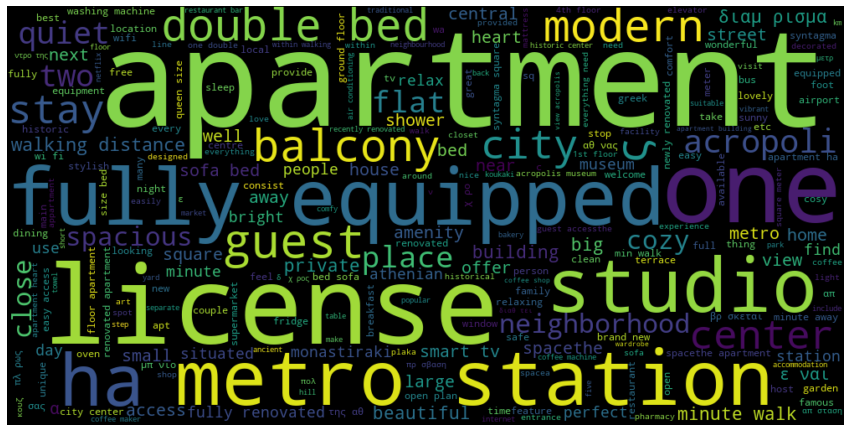

In [ ]:
# Word cloud top 20%
from wordcloud import WordCloud
plt.figure(figsize=(15,15))
WC = WordCloud(width=1000,height=500,max_words=250,min_font_size=5)

# The syntax requires parameter as a body of text. 
text = ' '.join(top_20_pct_low['description_clean'].values)
words = WC.generate(text)

plt.imshow(words,interpolation='bilinear')
plt.axis("off")
plt.show()

In [ ]:
# Word count top 20%
result_dict = {}
low_price_df.loc[low_price_df['is_top_20_pct'] == 'f','description_clean'].apply(count_word)

0        None
1        None
2        None
6        None
9        None
         ... 
12149    None
12151    None
12154    None
12159    None
12161    None
Name: description_clean, Length: 4636, dtype: object

In [ ]:
pd.Series(result_dict).sort_values(ascending = False)[0:100]

apartment       6478
bed             3188
metro           2667
station         2529
fully           2274
ha              2240
equipped        2141
floor           2120
minute          1981
one             1945
guest           1944
license         1934
2               1889
center          1879
acropolis       1847
double          1669
walk            1655
renovated       1622
city            1614
balcony         1606
1               1485
studio          1324
also            1296
access          1277
two             1189
stay            1185
square          1153
flat            1141
close           1140
away            1134
tv              1132
sofa            1113
building        1106
quiet           1071
ς               1064
walking         1051
5               1039
restaurant      1032
min              999
coffee           996
place            992
neighborhood     986
distance         977
museum           960
house            946
small            933
view             923
modern       

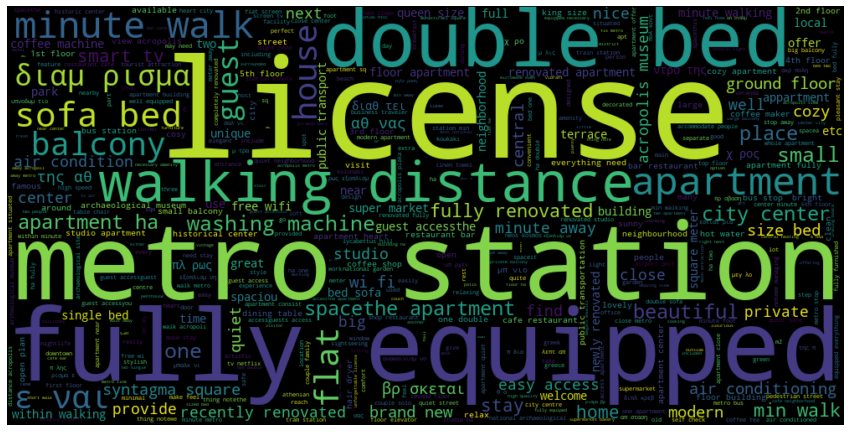

In [ ]:
# Word cloud top other
plt.figure(figsize=(15,15))
WC = WordCloud(width=1000,height=500,max_words=500,min_font_size=5)

# The syntax requires parameter as a body of text. 
text = ' '.join(low_price_df.loc[low_price_df['is_top_20_pct'] == 'f','description_clean'].values)
words = WC.generate(text)

plt.imshow(words,interpolation='bilinear')
plt.axis("off")
plt.show()

Difference description:

All: Fully equipped, metro station

Top 20%: Apartment, studio, balcony, modern, one

Generally speaking besides having a fully equipped listings that near a metro station. Based on the differences in description between the 2 groups’ customers. Specifically, it seems that customers from the top 20% group prefer a small studio apartment with a modern design in a quiet location, and maybe enough for one bed or person

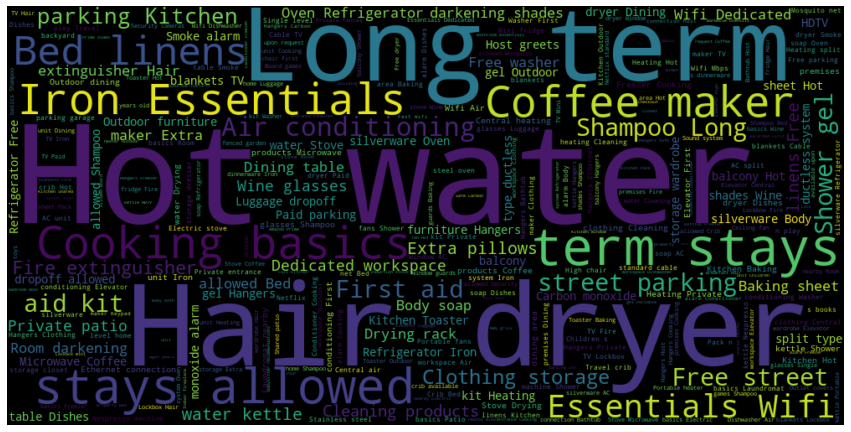

In [ ]:
# Word cloud top 20% amenities
from wordcloud import WordCloud
plt.figure(figsize=(15,15))
WC = WordCloud(width=1000,height=500,max_words=500,min_font_size=5)

# The syntax requires parameter as a body of text. 
text = ' '.join(top_20_pct_low['amenities'].values)
words = WC.generate(text)

plt.imshow(words,interpolation='bilinear')
plt.axis("off")
plt.show()

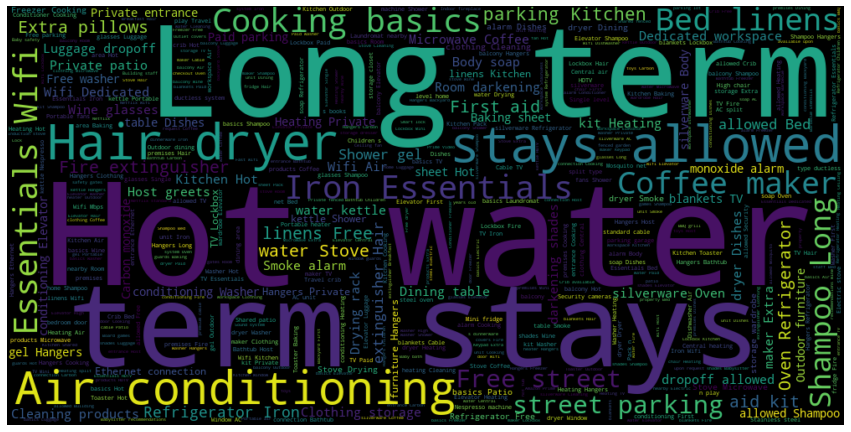

In [ ]:
# Word cloud top other amenities
plt.figure(figsize=(15,15))
WC = WordCloud(width=1000,height=500,max_words=500,min_font_size=5)

# The syntax requires parameter as a body of text. 
text = ' '.join(low_price_df.loc[low_price_df['is_top_20_pct'] == 'f','amenities'].values)
words = WC.generate(text)

plt.imshow(words,interpolation='bilinear')
plt.axis("off")
plt.show()

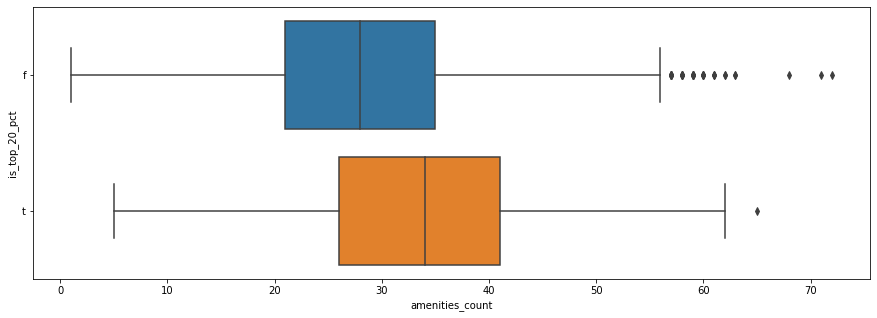

In [ ]:
plt.figure(figsize = (15,5))
sns.boxplot(data = low_price_df,
            x = 'amenities_count',
            y = 'is_top_20_pct')

### Multivariate_1.1

In [ ]:
top_20_pct_low.head()

,id,last_scraped,description,host_id,host_since,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_has_profile_pic,host_identity_verified,neighbourhood_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,availability_365,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,acceptance_rate_group,response_rate_group,property_type_cat,has_reviews,amenities_score,amenities_count,host_duration_days,description_clean,neighbourhood_eng
12160,631899913512154009,2022-09-20,"Cozy renovated apartment in Nea Smyrni, close ...",460237847,2022-05-21,within an hour,100.0,100.0,f,t,t,ΝΕΟΣ ΚΟΣΜΟΣ,37.954285,23.715139,Entire condo,Entire home/apt,4,1 bath,1.0,2.0,"Ceiling fan,Hot water kettle,Shower gel,Outdoo...",49.0,1,60,1.0,1125.0,0,6,5.0,5.00,5.00,5.0,5.0,5.00,5.00,t,1,1,0,0,2.73,75-100,75-100,Entire condo,1,8.5,49,134,cozy renovated apartment nea smyrni close city...,NEOS KOSMOS
10277,662169258785941710,2022-09-20,A perfect crash pad for exploring the center o...,373002294,2020-10-23,within an hour,100.0,98.0,t,t,t,ΠΑΓΚΡΑΤΙ,37.971931,23.746696,Entire rental unit,Entire home/apt,2,1 bath,1.0,1.0,"Hot water kettle,Nespresso machine,Shower gel,...",53.0,2,30,2.0,1125.0,204,4,5.0,5.00,5.00,5.0,5.0,4.75,5.00,t,5,5,0,0,3.43,75-100,75-100,Entire rental unit,1,6.0,34,709,perfect crash pad exploring center 5 walk nati...,PANGRATI
5491,37658928,2022-09-20,"Athens Apartment, located in central and safe ...",60037520,2016-02-23,within an hour,100.0,96.0,f,t,t,ΝΕΟΣ ΚΟΣΜΟΣ,37.963350,23.730080,Entire condo,Entire home/apt,2,1.5 baths,1.0,1.0,"Hot water kettle,Shower gel,Hangers,Laundromat...",35.0,3,30,3.0,30.0,76,6,5.0,4.83,4.83,5.0,5.0,4.83,4.83,f,2,2,0,0,4.39,75-100,75-100,Entire condo,1,6.0,24,2413,apartment central safe 800m acropolis museum 5...,NEOS KOSMOS
10250,660177424206199860,2022-09-20,Το Kerameikos Neoclassical House βρίσκεται στ...,389251011,2021-02-19,within an hour,100.0,100.0,f,t,t,ΚΕΡΑΜΕΙΚΟΣ,37.982141,23.716664,Entire home,Entire home/apt,4,1 bath,1.0,3.0,"Hot water kettle,Nespresso machine,Syoss shamp...",60.0,2,1125,2.0,1125.0,107,8,5.0,5.00,4.88,5.0,5.0,5.00,4.88,t,1,1,0,0,6.32,75-100,75-100,Other,1,6.0,37,590,kerameikos neoclassical house βρ σκεται καρδι ...,KERAMIKOS
10237,659424490375485209,2022-09-20,Our apartment has just been renovated with tas...,229843463,2018-12-09,within an hour,100.0,100.0,t,t,t,ΚΥΨΕΛΗ,38.002676,23.743892,Entire condo,Entire home/apt,2,1 bath,1.0,1.0,"Hot water kettle,Hangers,Clothing storage: clo...",30.0,3,180,3.0,1125.0,354,6,5.0,5.00,5.00,5.0,5.0,5.00,4.83,t,2,2,0,0,2.61,75-100,75-100,Entire condo,1,7.5,34,1393,apartment ha renovated taste attention detail ...,KYPSELI


#### Does the non-superhost or the non-verfied host have profile pic in the top 20% group
It would seems that the 100% superhost have a profile pic and around over 95% for the non-superhost
Same goes for identity verification

,not_superhost,is_superhost
has_profile_pic,0.95977,1.0
no_profile_pic,0.04023,0.0


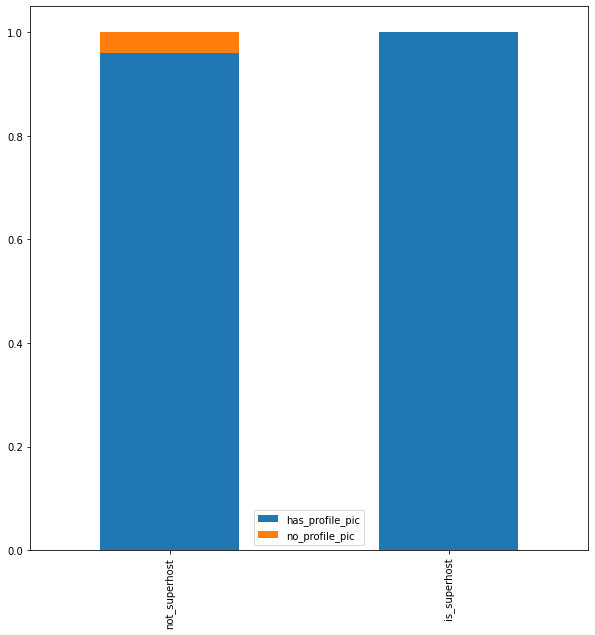

In [ ]:
superhost_profile_t = top_20_pct_low.loc[top_20_pct_low['host_is_superhost'] == 't', 
                                         'host_has_profile_pic'].value_counts(normalize = True)
superhost_profile_f = top_20_pct_low.loc[top_20_pct_low['host_is_superhost'] == 'f', 
                                         'host_has_profile_pic'].value_counts(normalize = True)
superhost_profile = pd.merge(left = superhost_profile_f,
                             right = superhost_profile_t,
                             left_index = True,
                             right_index = True,
                             how = 'left').rename(columns = {'host_has_profile_pic_x':'not_superhost',
                                                             'host_has_profile_pic_y':'is_superhost'},
                                                  index = {'t':'has_profile_pic',
                                                           'f':'no_profile_pic'}).fillna(0)
display(superhost_profile)
superhost_profile.T.plot(kind = 'bar', stacked = True, figsize = (10,10))

,id_not_verified,id_verified
has_profile_pic,0.909091,0.996774
no_profile_pic,0.090909,0.003226


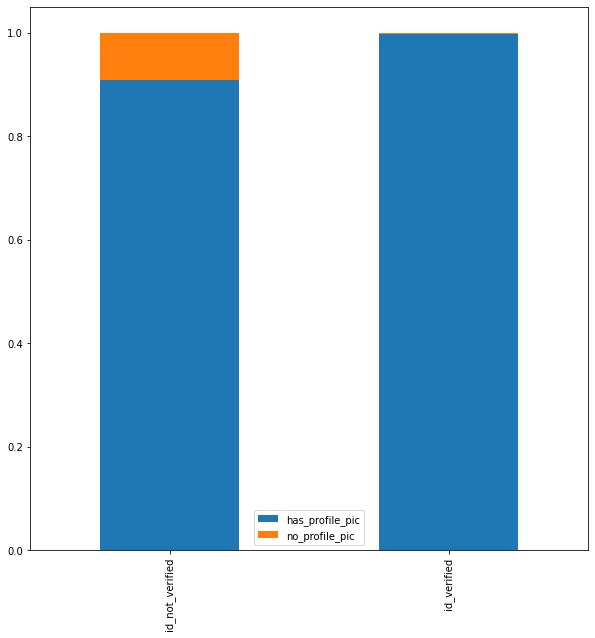

In [ ]:
identity_profile_t = top_20_pct_low.loc[top_20_pct_low['host_identity_verified'] == 't', 
                                         'host_has_profile_pic'].value_counts(normalize = True)
identity_profile_f = top_20_pct_low.loc[top_20_pct_low['host_identity_verified'] == 'f', 
                                         'host_has_profile_pic'].value_counts(normalize = True)
identity_profile = pd.merge(left = identity_profile_f,
                             right = identity_profile_t,
                             left_index = True,
                             right_index = True,
                             how = 'left').rename(columns = {'host_has_profile_pic_x':'id_not_verified',
                                                             'host_has_profile_pic_y':'id_verified'},
                                                  index = {'t':'has_profile_pic',
                                                           'f':'no_profile_pic'}).fillna(0)
display(identity_profile)
identity_profile.T.plot(kind = 'bar', stacked = True, figsize = (10,10))

#### Does entire condo or entire rental unit in the top 20% have different room type preferences or the same as analyze earlier. Are there differences in accommodation of each property + room type
Regardless of the property type, room type will always entire home/apt. And there seems to be no significant difference in accommodation between these property types, except other types offer less accommodation flexibility probably due to specific property type that has smaller capacity

In [ ]:
low_price_df.head()

,id,last_scraped,description,host_id,host_since,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_has_profile_pic,host_identity_verified,neighbourhood_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,availability_365,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,acceptance_rate_group,response_rate_group,property_type_cat,has_reviews,amenities_score,amenities_count,host_duration_days,description_clean,neighbourhood_eng,is_top_20_pct
0,42384166,2022-09-20,The apartment just got renovated! The simple b...,337177735,2020-02-18,within an hour,100.0,100.0,f,t,f,ΝΕΟΣ ΚΟΣΜΟΣ,37.94835,23.70327,Entire rental unit,Entire home/apt,2,1 bath,1.0,1.0,"First aid kit,Shampoo,Hangers,TV,Iron,Essentia...",35.0,2,7,2.0,1125.0,360,30,4.37,4.33,4.63,4.80,4.67,4.47,4.40,t,1,1,0,0,0.96,75-100,75-100,Entire rental unit,1,5.5,12,957,apartment got renovated simple clean design pl...,NEOS KOSMOS,f
1,31100111,2022-09-20,Προσφατα ανακαινισμένο διαμερισμα ενος μεγαλου...,90434832,2016-08-17,within a few hours,100.0,0.0,f,t,t,ΠΕΤΡΑΛΩΝΑ,37.95633,23.69534,Entire rental unit,Entire home/apt,3,1 bath,1.0,3.0,"Hangers,Bathtub,Cooking basics,Patio or balcon...",22.0,7,90,7.0,1125.0,74,6,3.67,3.50,3.33,3.83,4.00,4.17,3.83,t,3,3,0,0,0.15,0-24,75-100,Entire rental unit,1,8.5,30,2237,προσφατα ανακαινισμ νο διαμερισμα ενος μεγαλου...,PETRALONA,f
2,36967991,2022-09-20,5 λεπτά από τον ηλεκτρικό σταθμό Καλλιθέας. Εύ...,277896558,2019-07-21,within an hour,100.0,96.0,t,t,t,ΠΕΤΡΑΛΩΝΑ,37.95672,23.69589,Entire rental unit,Entire home/apt,2,1 bath,1.0,1.0,"Air conditioning,Dishes and silverware,Shampoo...",36.0,2,1125,2.0,1125.0,325,112,4.85,4.91,4.90,4.85,4.90,4.78,4.79,t,2,2,0,0,2.91,75-100,75-100,Entire rental unit,1,7.5,17,1169,5 λεπτ απ ηλεκτρικ σταθμ καλλιθ ας ε κολη πρ σ...,PETRALONA,f
6,34796120,2022-09-20,Έχει πολύ πυκνές και άμεσα προσβάσιμες συγκοι...,262360777,2019-05-17,within an hour,100.0,100.0,f,t,t,ΡΟΥΦ,37.98711,23.67311,Entire rental unit,Entire home/apt,3,1 bath,1.0,1.0,"Hangers,Private entrance,Host greets you,Cooki...",28.0,2,1125,2.0,1125.0,18,59,4.85,4.88,4.81,4.92,4.97,4.75,4.92,t,1,1,0,0,1.47,75-100,75-100,Entire rental unit,1,7.0,23,1234,χει πολ πυκν ς μεσα προσβ σιμες συγκοινων ες α...,ROUF,f
9,19772970,2022-09-20,Το διαμέρισμα των 54 τ.μ που είναι πρόσφατα αν...,139469605,2017-07-09,within a day,100.0,0.0,f,t,f,ΠΕΤΡΑΛΩΝΑ,37.95423,23.69522,Entire rental unit,Entire home/apt,5,1 bath,1.0,5.0,"Hangers,Children’s books and toys,Host greets ...",24.0,1,28,1.0,28.0,38,203,4.90,4.93,4.93,4.97,4.96,4.73,4.89,f,1,1,0,0,3.23,0-24,75-100,Entire rental unit,1,10.0,32,1911,διαμ ρισμα 54 τ μ ε ναι πρ σφατα ανακαινισμ νο...,PETRALONA,f


,Entire condo,Entire rental unit
Entire home/apt,1.0,1.0


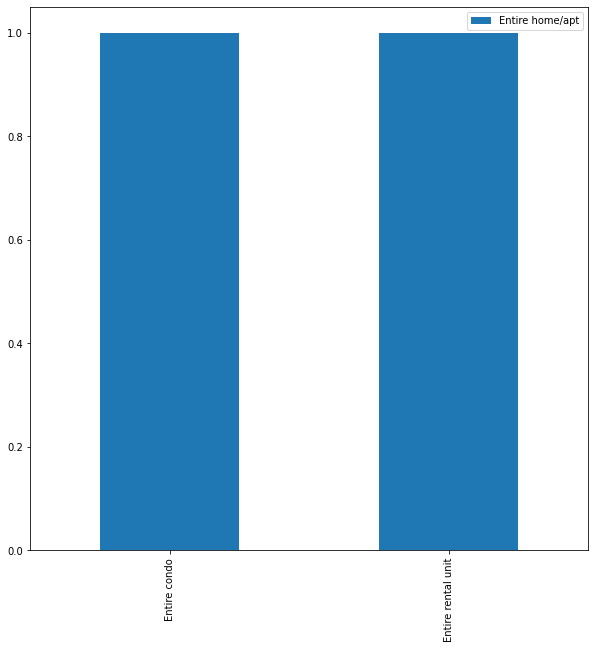

In [ ]:
condo_room = top_20_pct_low.loc[top_20_pct_low['property_type_cat'] == 'Entire condo', 'room_type'].value_counts(normalize = True)
rental_room = top_20_pct_low.loc[top_20_pct_low['property_type_cat'] == 'Entire rental unit', 'room_type'].value_counts(normalize = True)
prop_room = pd.merge(left = condo_room,
                     right = rental_room,
                     right_index = True,
                     left_index = True,
                     how = 'left').rename(columns = {'room_type_x':'Entire condo',
                                                     'room_type_y':'Entire rental unit'})
display(prop_room)
prop_room.T.plot(kind = 'bar', stacked = True, figsize = (10,10))

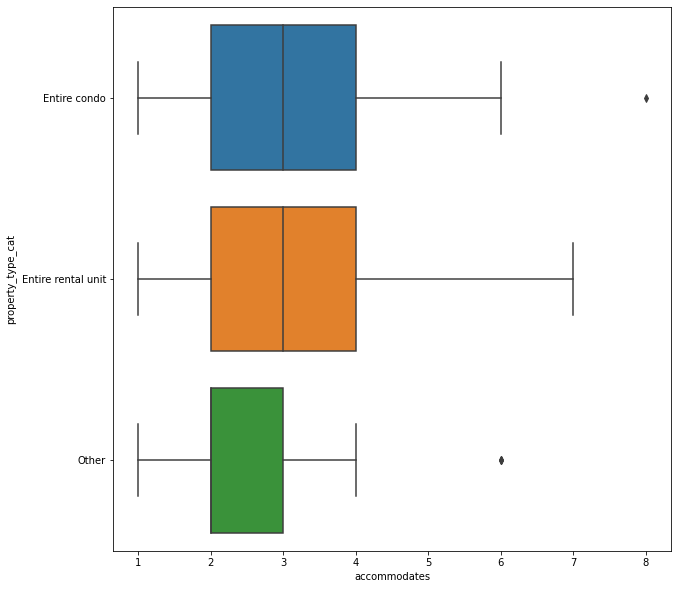

In [ ]:
plt.figure(figsize = (10,10))
sns.boxplot(data = top_20_pct_low,
            x = 'accommodates',
            y = 'property_type_cat')

#### Does accommodation have a relationship with bedrooms, beds or bath. If so, how?

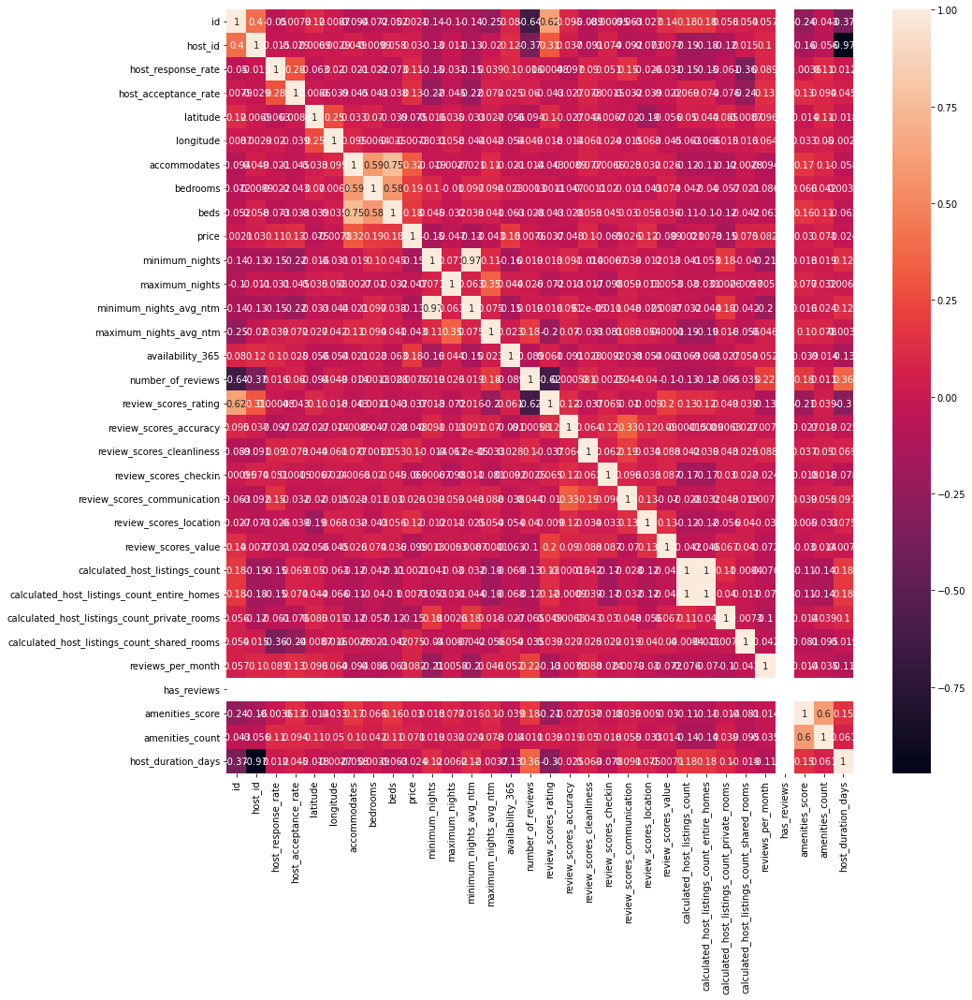

In [ ]:
plt.figure(figsize = (15,15))
sns.heatmap(data = top_20_pct_low.corr(),
            annot = True)

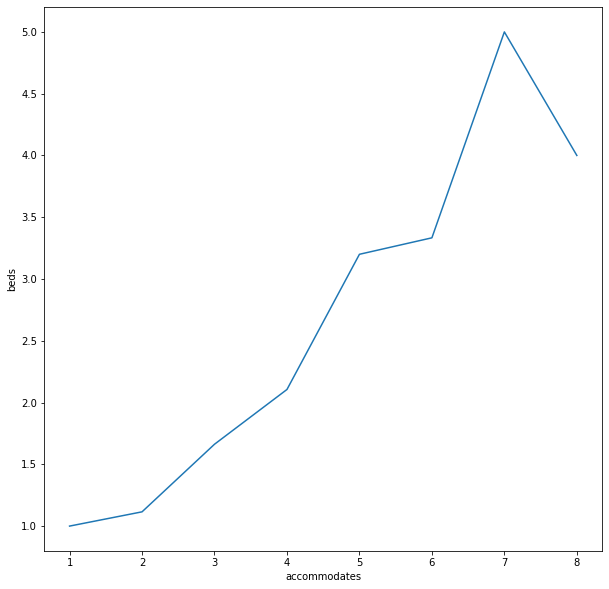

In [ ]:
plt.figure(figsize = (10,10))
sns.lineplot(data = top_20_pct_low,
           x = 'accommodates',
           y = 'beds',
           err_style = None)

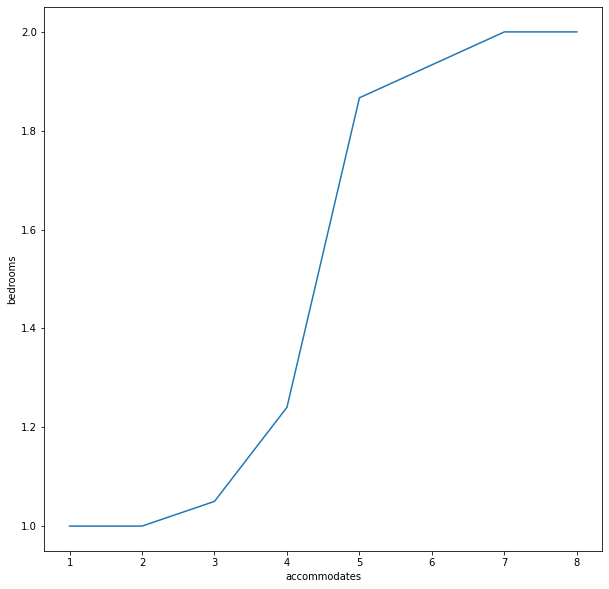

In [ ]:
plt.figure(figsize = (10,10))
sns.lineplot(data = top_20_pct_low,
           x = 'accommodates',
           y = 'bedrooms',
           err_style = None)

#### Does bathroom count correlated with accommodations

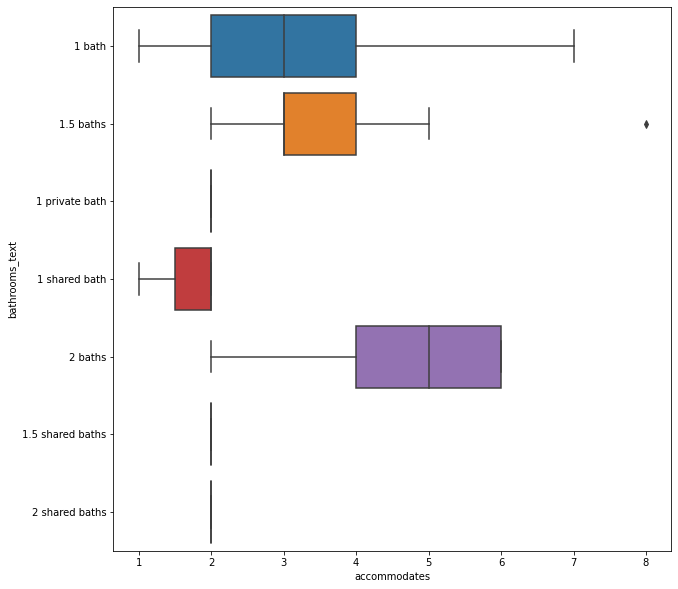

In [ ]:
plt.figure(figsize = (10,10))
sns.boxplot(data = top_20_pct_low,
            x = 'accommodates',
            y = 'bathrooms_text')

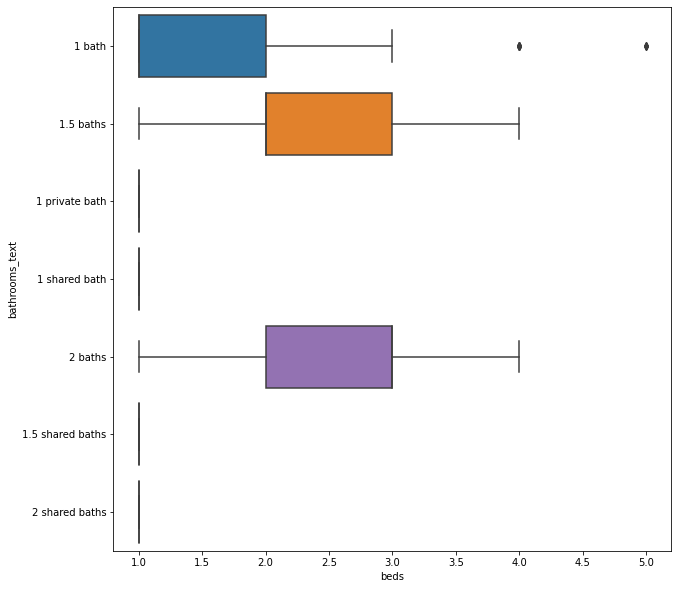

In [ ]:
plt.figure(figsize = (10,10))
sns.boxplot(data = top_20_pct_low,
            x = 'beds',
            y = 'bathrooms_text')

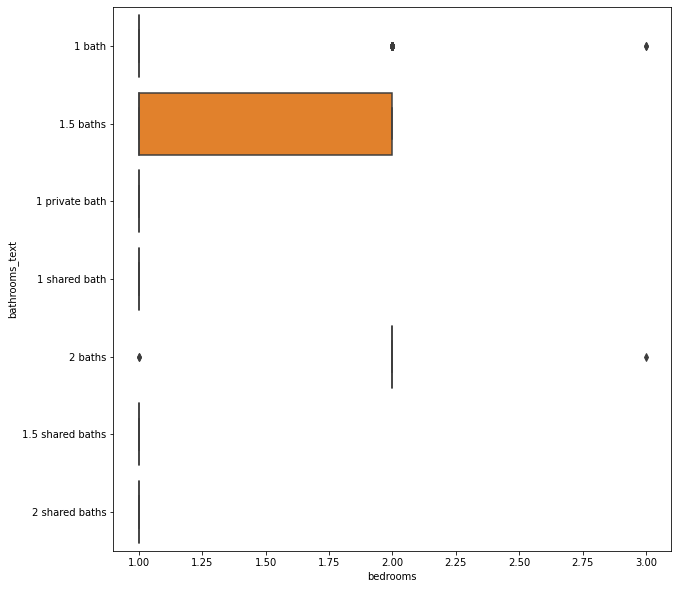

In [ ]:
plt.figure(figsize = (10,10))
sns.boxplot(data = top_20_pct_low,
            x = 'bedrooms',
            y = 'bathrooms_text')

#### Are there any differences in property type among the top 5 neighborhoods of top 20% group
It seems that as for the top 5 neighborhoods of the top 20% group, property type references remain similar (to the property type analyze earlier) regardless of neighborhood. Same situation with others group

In [ ]:
neigh_prop_20 = pd.DataFrame(index = ['Entire condo', 'Entire rental unit', 'Other'])
for x in top_20_pct_neigh['neighbourhood'].values:
  merge_df = top_20_pct_low.loc[top_20_pct_low['neighbourhood_eng'] == x,
                                'property_type_cat'].value_counts(normalize = True).reset_index().set_index('index').rename(columns = {'property_type_cat':x})
  neigh_prop_20 = neigh_prop_20.merge(merge_df, left_index = True, right_index = True, how = 'left')
neigh_prop_20 = neigh_prop_20.fillna(0)
neigh_prop_20

,NEOS KOSMOS,MOUSIO-EXARCHEIA-NEAPOLI,PETRALONA,KOUKAKI-MAKRYGIANNI,EMPORIKO TRIGONO-PLAKA
Entire condo,0.395833,0.512821,0.441176,0.44,0.333333
Entire rental unit,0.500000,0.384615,0.500000,0.48,0.476190
Other,0.104167,0.102564,0.058824,0.08,0.190476


In [ ]:
neigh_prop_all = pd.DataFrame(index = ['Entire condo', 'Entire rental unit', 'Other'])
for x in other_neigh['neighbourhood'].values:
  merge_df = low_price_df.loc[(low_price_df['is_top_20_pct'] == 'f') & (low_price_df['neighbourhood_eng'] == x),
                              'property_type_cat'].value_counts(normalize = True).reset_index().set_index('index').rename(columns = {'property_type_cat':x})
  neigh_prop_all = neigh_prop_all.merge(merge_df, left_index = True, right_index = True, how = 'left')
neigh_prop_all = neigh_prop_all.fillna(0)
neigh_prop_all

,NEOS KOSMOS,MOUSIO-EXARCHEIA-NEAPOLI,EMPORIKO TRIGONO-PLAKA,AGIOU KONSTANTINOU-VATHI,ATTIKI SQUARE
Entire condo,0.192607,0.169355,0.114286,0.232628,0.229091
Entire rental unit,0.663424,0.642473,0.577143,0.646526,0.629091
Other,0.143969,0.188172,0.308571,0.120846,0.141818


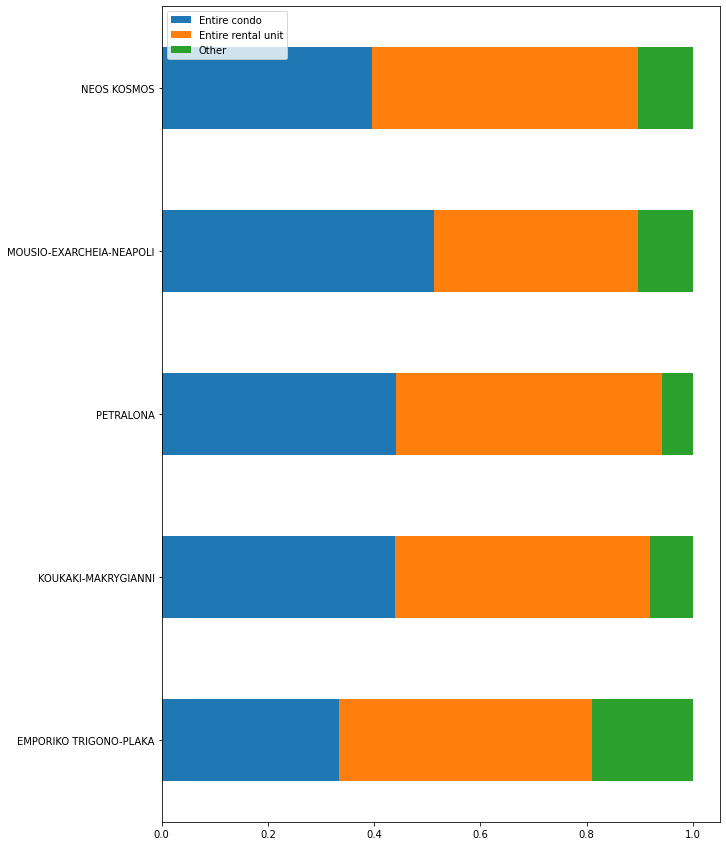

In [ ]:
neigh_prop_20.T.plot(kind = 'barh', stacked = True, figsize = (10,15)).invert_yaxis()

In [ ]:
top_20_pct_low.loc[(top_20_pct_low['neighbourhood_eng'] == 'ATTIKI SQUARE') &
                   (top_20_pct_low['property_type_cat'] == 'Other'),
                   'property_type']

10236    Private room in rental unit
10185    Private room in rental unit
10784          Private room in condo
10829    Private room in rental unit
10713      Entire serviced apartment
10782          Private room in condo
Name: property_type, dtype: object

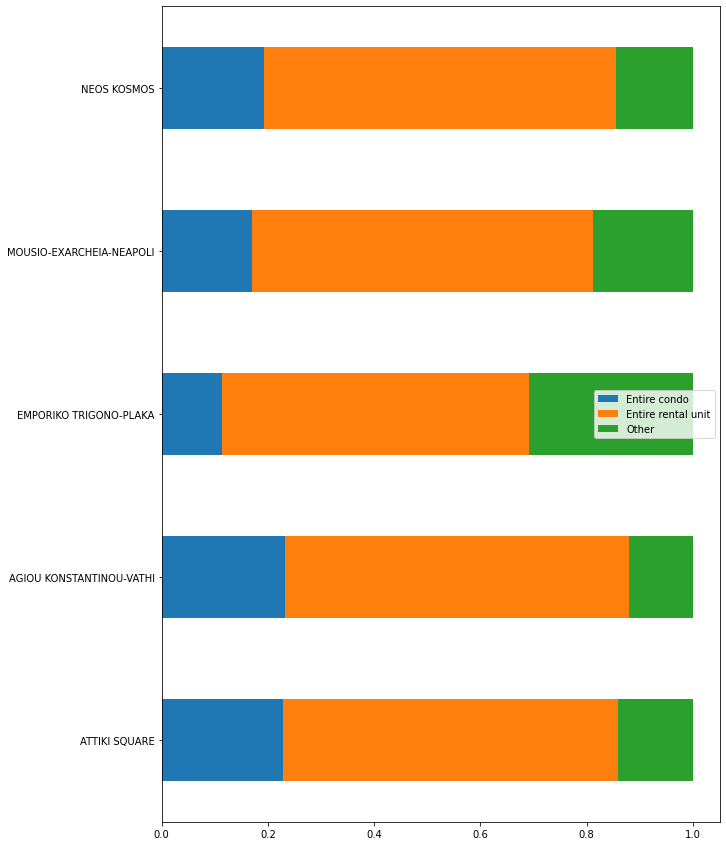

In [ ]:
neigh_prop_all.T.plot(kind = 'barh', stacked = True, figsize = (10,15)).invert_yaxis()

In [ ]:
low_price_df.head()

,id,last_scraped,description,host_id,host_since,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_has_profile_pic,host_identity_verified,neighbourhood_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,availability_365,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,acceptance_rate_group,response_rate_group,property_type_cat,has_reviews,amenities_score,amenities_count,host_duration_days,description_clean,neighbourhood_eng,is_top_20_pct
0,42384166,2022-09-20,The apartment just got renovated! The simple b...,337177735,2020-02-18,within an hour,100.0,100.0,f,t,f,ΝΕΟΣ ΚΟΣΜΟΣ,37.94835,23.70327,Entire rental unit,Entire home/apt,2,1 bath,1.0,1.0,"First aid kit,Shampoo,Hangers,TV,Iron,Essentia...",35.0,2,7,2.0,1125.0,360,30,4.37,4.33,4.63,4.80,4.67,4.47,4.40,t,1,1,0,0,0.96,75-100,75-100,Entire rental unit,1,5.5,12,957,apartment got renovated simple clean design pl...,NEOS KOSMOS,f
1,31100111,2022-09-20,Προσφατα ανακαινισμένο διαμερισμα ενος μεγαλου...,90434832,2016-08-17,within a few hours,100.0,0.0,f,t,t,ΠΕΤΡΑΛΩΝΑ,37.95633,23.69534,Entire rental unit,Entire home/apt,3,1 bath,1.0,3.0,"Hangers,Bathtub,Cooking basics,Patio or balcon...",22.0,7,90,7.0,1125.0,74,6,3.67,3.50,3.33,3.83,4.00,4.17,3.83,t,3,3,0,0,0.15,0-24,75-100,Entire rental unit,1,8.5,30,2237,προσφατα ανακαινισμ νο διαμερισμα ενος μεγαλου...,PETRALONA,f
2,36967991,2022-09-20,5 λεπτά από τον ηλεκτρικό σταθμό Καλλιθέας. Εύ...,277896558,2019-07-21,within an hour,100.0,96.0,t,t,t,ΠΕΤΡΑΛΩΝΑ,37.95672,23.69589,Entire rental unit,Entire home/apt,2,1 bath,1.0,1.0,"Air conditioning,Dishes and silverware,Shampoo...",36.0,2,1125,2.0,1125.0,325,112,4.85,4.91,4.90,4.85,4.90,4.78,4.79,t,2,2,0,0,2.91,75-100,75-100,Entire rental unit,1,7.5,17,1169,5 λεπτ απ ηλεκτρικ σταθμ καλλιθ ας ε κολη πρ σ...,PETRALONA,f
6,34796120,2022-09-20,Έχει πολύ πυκνές και άμεσα προσβάσιμες συγκοι...,262360777,2019-05-17,within an hour,100.0,100.0,f,t,t,ΡΟΥΦ,37.98711,23.67311,Entire rental unit,Entire home/apt,3,1 bath,1.0,1.0,"Hangers,Private entrance,Host greets you,Cooki...",28.0,2,1125,2.0,1125.0,18,59,4.85,4.88,4.81,4.92,4.97,4.75,4.92,t,1,1,0,0,1.47,75-100,75-100,Entire rental unit,1,7.0,23,1234,χει πολ πυκν ς μεσα προσβ σιμες συγκοινων ες α...,ROUF,f
9,19772970,2022-09-20,Το διαμέρισμα των 54 τ.μ που είναι πρόσφατα αν...,139469605,2017-07-09,within a day,100.0,0.0,f,t,f,ΠΕΤΡΑΛΩΝΑ,37.95423,23.69522,Entire rental unit,Entire home/apt,5,1 bath,1.0,5.0,"Hangers,Children’s books and toys,Host greets ...",24.0,1,28,1.0,28.0,38,203,4.90,4.93,4.93,4.97,4.96,4.73,4.89,f,1,1,0,0,3.23,0-24,75-100,Entire rental unit,1,10.0,32,1911,διαμ ρισμα 54 τ μ ε ναι πρ σφατα ανακαινισμ νο...,PETRALONA,f


#### Price differs based on top neighbourhoods of top 20% and others
- As a result of achieving high ratings, hosts can charge their listings a little higher, except for Attiki Square

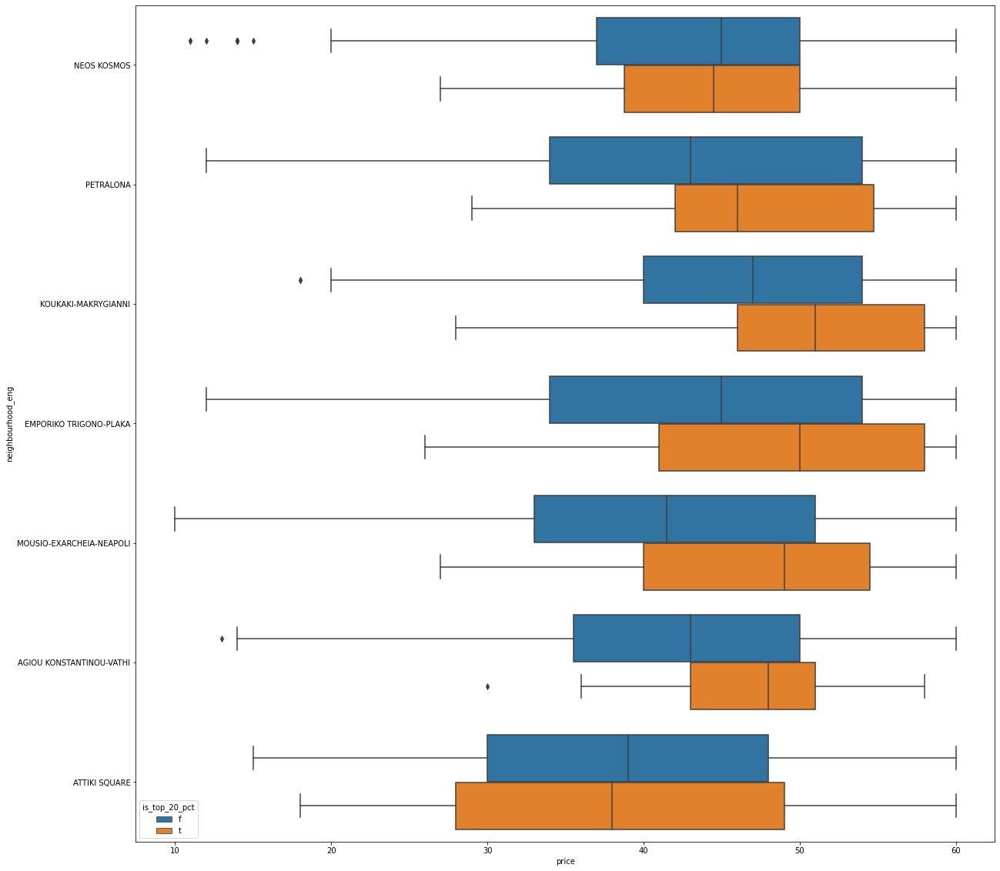

In [ ]:
plt.figure(figsize = (20,20))
sns.boxplot(data = low_price_df[low_price_df['neighbourhood_eng'].isin(neigh_prop_all.columns) | low_price_df['neighbourhood_eng'].isin(neigh_prop_20.columns)],
            x = 'price',
            y = 'neighbourhood_eng',
            hue = 'is_top_20_pct')

#### Description by top 5 neighborhood in top 20% group

Listings in the top 5 neighborhood can have some distinct keywords to their description

Neos Kosmos + Koukaki-Makrygianni: At Neos Kosmos and Koukaki-Makrygianni, hosts can introduce nearby note-worthy coffee shops, restaurants to visitors through the description

Petralona: Or at Petralona, in addition to modern designed, if apartment has been renovated recently, then put it in the description

Emporiko Trigono-Plaka: As for Emporiko Trigono-Plaka, Syntagma square seems to be the more sought after attraction for tourists and visitors, and thus, should captured attention when placed in description

##### NEOS KOSMOS
All: Apartment, License, fully equipped

Top 20%: Acropoli, coffee, modern, restaurant

Others: Metro station, double bed

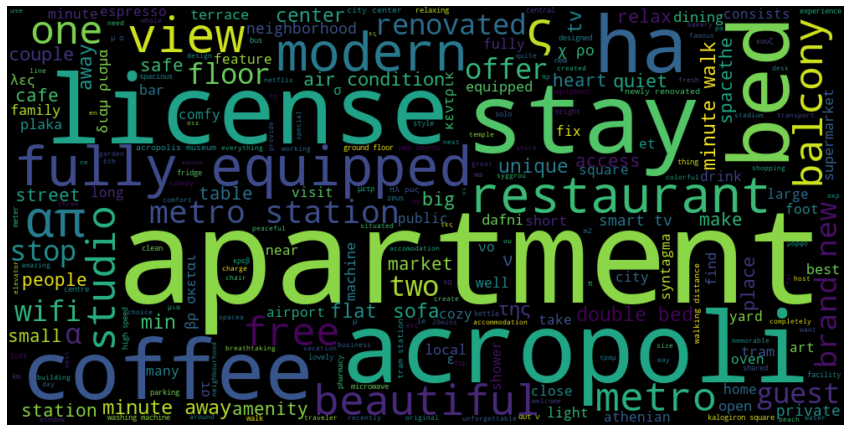

In [ ]:
# Top 20% neighborhood
plt.figure(figsize = (15, 15))
WC = WordCloud(width=1000,height=500,max_words=250,min_font_size=5)

# The syntax requires parameter as a body of text. 
text = ' '.join(top_20_pct_low.loc[top_20_pct_low['neighbourhood_eng'] == 'NEOS KOSMOS', 'description_clean'].values)
words = WC.generate(text)

plt.imshow(words,interpolation='bilinear')
plt.axis("off")
plt.show()

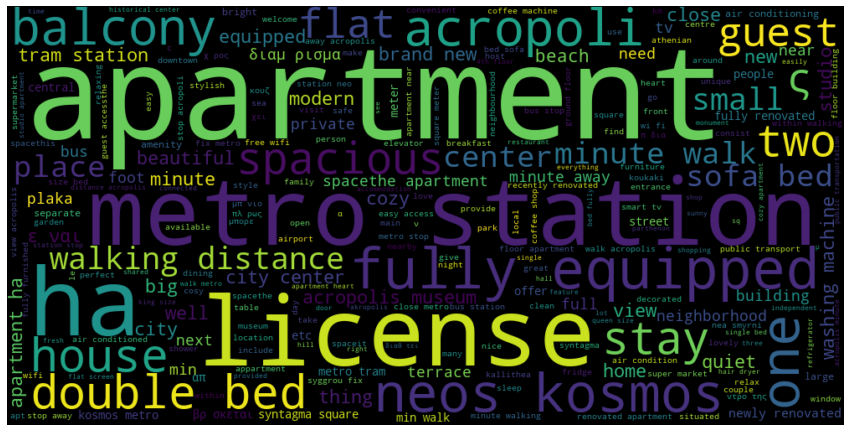

In [ ]:
# Other neighborhood
plt.figure(figsize = (15, 15))
WC = WordCloud(width=1000,height=500,max_words=250,min_font_size=5)

# The syntax requires parameter as a body of text. 
text = ' '.join(low_price_df.loc[(low_price_df['is_top_20_pct'] == 'f') & 
                                 (low_price_df['neighbourhood_eng'] == 'NEOS KOSMOS'),
                                 'description_clean'].values)
words = WC.generate(text)

plt.imshow(words,interpolation='bilinear')
plt.axis("off")
plt.show()

##### MOUSIO-EXARCHEIA-NEAPOLI
All: Apartment, License, Balcony

Top 20%: City Center, Studio, view

Others: Double bed, fully equipped



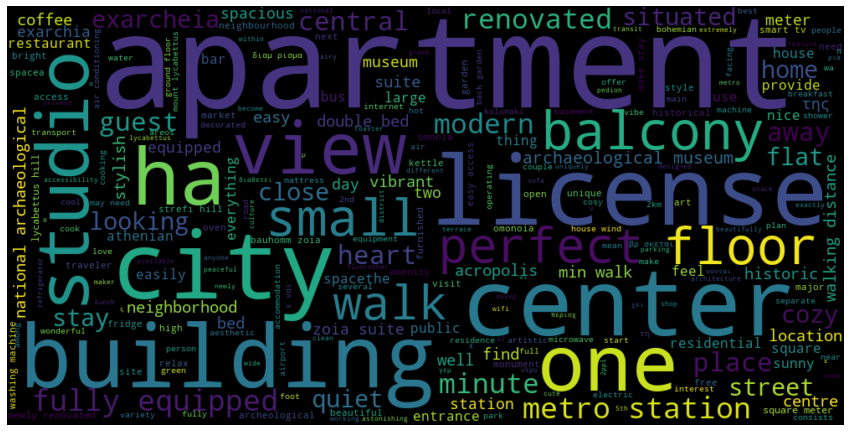

In [ ]:
# Top 20% neighborhood
plt.figure(figsize = (15, 15))
WC = WordCloud(width=1000,height=500,max_words=250,min_font_size=5)

# The syntax requires parameter as a body of text. 
text = ' '.join(top_20_pct_low.loc[top_20_pct_low['neighbourhood_eng'] == 'MOUSIO-EXARCHEIA-NEAPOLI', 'description_clean'].values)
words = WC.generate(text)

plt.imshow(words,interpolation='bilinear')
plt.axis("off")
plt.show()

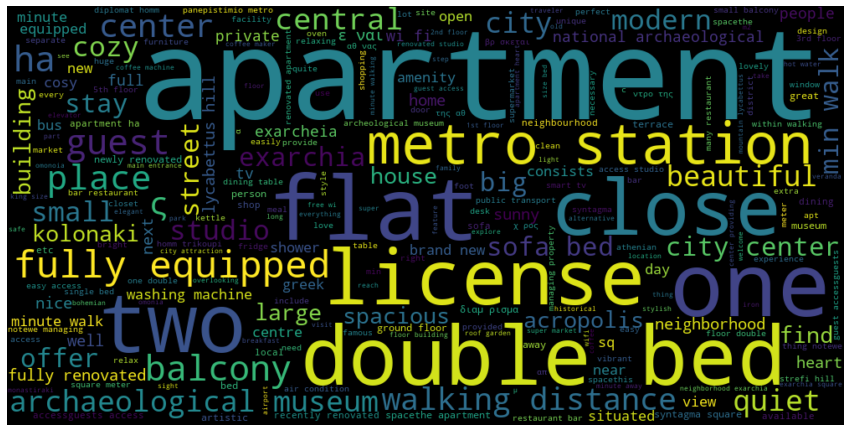

In [ ]:
# Other neighborhood
plt.figure(figsize = (15, 15))
WC = WordCloud(width=1000,height=500,max_words=250,min_font_size=5)

# The syntax requires parameter as a body of text. 
text = ' '.join(low_price_df.loc[(low_price_df['is_top_20_pct'] == 'f') & 
                                 (low_price_df['neighbourhood_eng'] == 'MOUSIO-EXARCHEIA-NEAPOLI'),
                                 'description_clean'].values)
words = WC.generate(text)

plt.imshow(words,interpolation='bilinear')
plt.axis("off")
plt.show()

##### PETRALONA
All: Apartment, License, Acropolis

Top 20%: Renovated, modern

Other: fully equipped, metro station

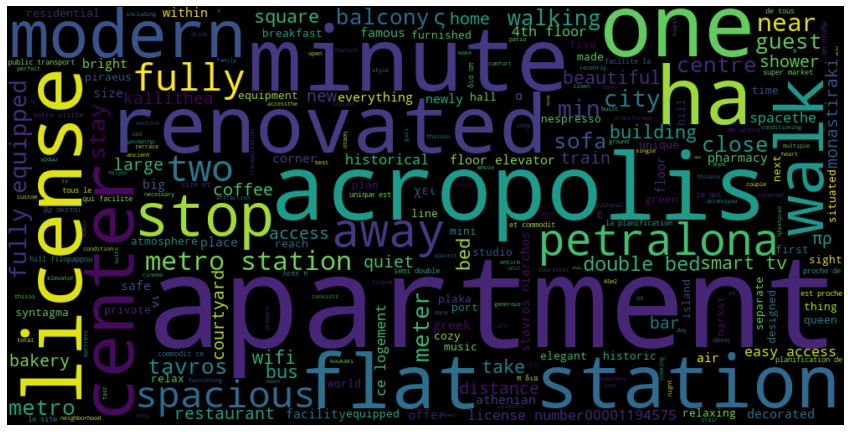

In [ ]:
# Top 20% neighborhood
plt.figure(figsize = (15, 15))
WC = WordCloud(width=1000,height=500,max_words=250,min_font_size=5)

# The syntax requires parameter as a body of text. 
text = ' '.join(top_20_pct_low.loc[top_20_pct_low['neighbourhood_eng'] == 'PETRALONA', 'description_clean'].values)
words = WC.generate(text)

plt.imshow(words,interpolation='bilinear')
plt.axis("off")
plt.show()

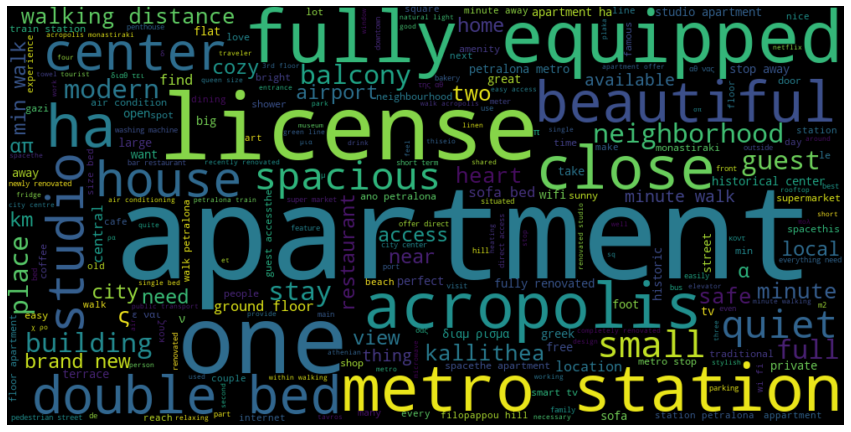

In [ ]:
# Other neighborhood
plt.figure(figsize = (15, 15))
WC = WordCloud(width=1000,height=500,max_words=250,min_font_size=5)

# The syntax requires parameter as a body of text. 
text = ' '.join(low_price_df.loc[(low_price_df['is_top_20_pct'] == 'f') & 
                                 (low_price_df['neighbourhood_eng'] == 'PETRALONA'),
                                 'description_clean'].values)
words = WC.generate(text)

plt.imshow(words,interpolation='bilinear')
plt.axis("off")
plt.show()

##### KOUKAKI-MAKRYGIANNI
All: Apartment, Acropolis, license

Top 20%: bar, shop, coffee, renovated

Other: Metro station, fully equipped, acropolis museum


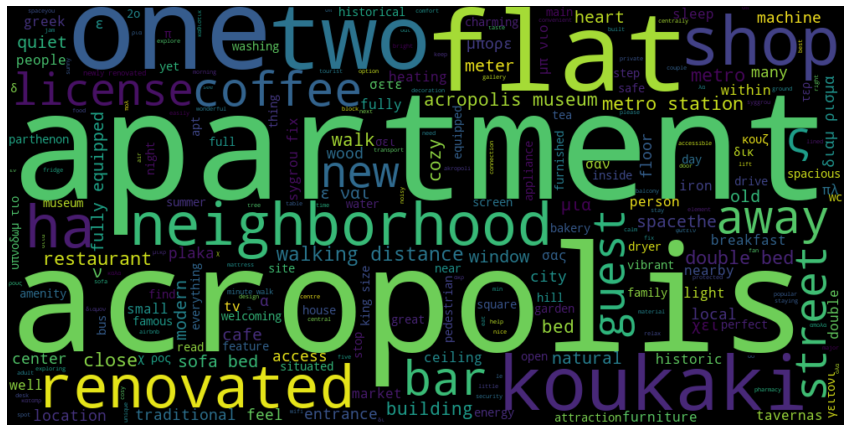

In [ ]:
# Top 20% neighborhood
plt.figure(figsize = (15, 15))
WC = WordCloud(width=1000,height=500,max_words=250,min_font_size=5)

# The syntax requires parameter as a body of text. 
text = ' '.join(top_20_pct_low.loc[top_20_pct_low['neighbourhood_eng'] == 'KOUKAKI-MAKRYGIANNI', 'description_clean'].values)
words = WC.generate(text)

plt.imshow(words,interpolation='bilinear')
plt.axis("off")
plt.show()

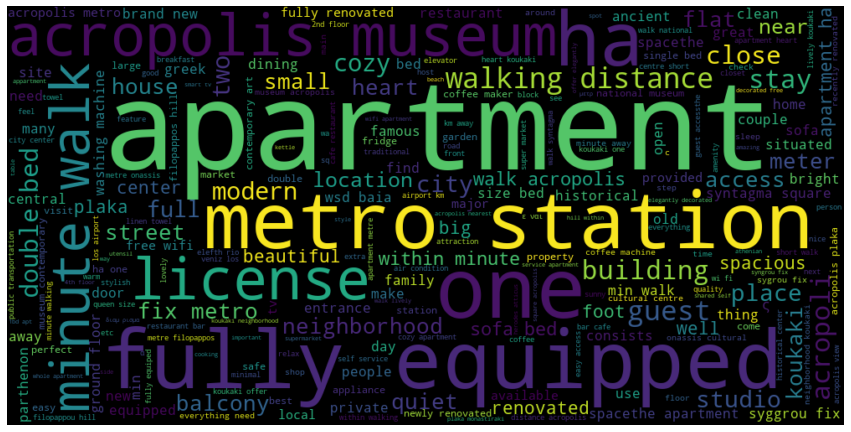

In [ ]:
# Other neighborhood
plt.figure(figsize = (15, 15))
WC = WordCloud(width=1000,height=500,max_words=250,min_font_size=5)

# The syntax requires parameter as a body of text. 
text = ' '.join(low_price_df.loc[(low_price_df['is_top_20_pct'] == 'f') & 
                                 (low_price_df['neighbourhood_eng'] == 'KOUKAKI-MAKRYGIANNI'),
                                 'description_clean'].values)
words = WC.generate(text)

plt.imshow(words,interpolation='bilinear')
plt.axis("off")
plt.show()

##### EMPORIKO TRIGONO-PLAKA
All: Apartment, fully equipped, license

Top 20%: Acropolis, Syntagma, studio

Others: Metro station, double bed


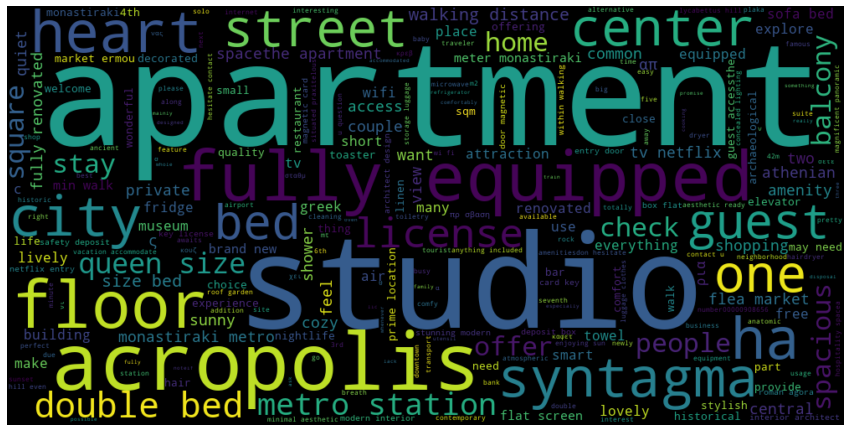

In [ ]:
# Top 20% neighborhood
plt.figure(figsize = (15, 15))
WC = WordCloud(width=1000,height=500,max_words=250,min_font_size=5)

# The syntax requires parameter as a body of text. 
text = ' '.join(top_20_pct_low.loc[top_20_pct_low['neighbourhood_eng'] == 'EMPORIKO TRIGONO-PLAKA', 'description_clean'].values)
words = WC.generate(text)

plt.imshow(words,interpolation='bilinear')
plt.axis("off")
plt.show()

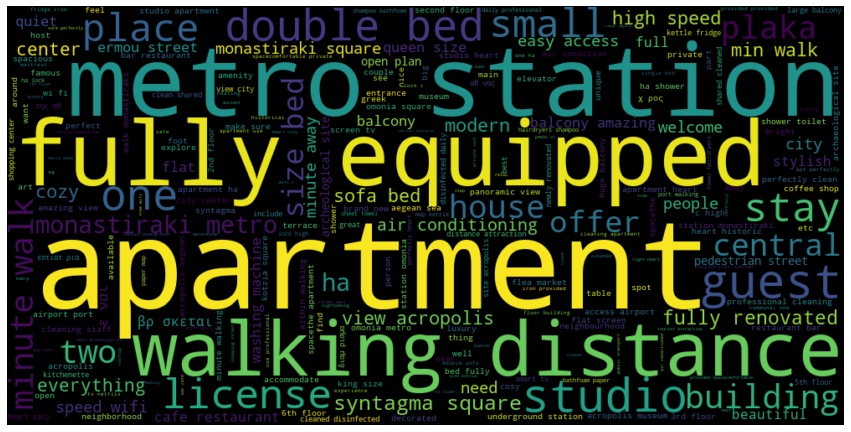

In [ ]:
# Other neighborhood
plt.figure(figsize = (15, 15))
WC = WordCloud(width=1000,height=500,max_words=250,min_font_size=5)

# The syntax requires parameter as a body of text. 
text = ' '.join(low_price_df.loc[(low_price_df['is_top_20_pct'] == 'f') & 
                                 (low_price_df['neighbourhood_eng'] == 'EMPORIKO TRIGONO-PLAKA'),
                                 'description_clean'].values)
words = WC.generate(text)

plt.imshow(words,interpolation='bilinear')
plt.axis("off")
plt.show()

#### Accommodations difference in top 5 neighborhoods

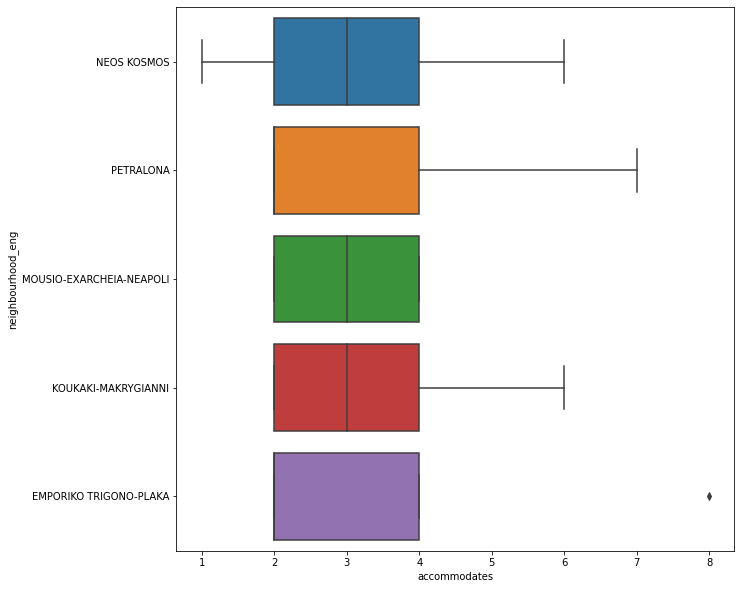

In [ ]:
plt.figure(figsize = (10,10))
sns.boxplot(data = top_20_pct_low[top_20_pct_low['neighbourhood_eng'].isin(neigh_prop_20.columns)],
            x = 'accommodates',
            y = 'neighbourhood_eng')

In [ ]:
top_neigh_20_df = top_20_pct_low.loc[top_20_pct_low['neighbourhood_eng'].isin(neigh_prop_20)]
top_neigh_20_df

,id,last_scraped,description,host_id,host_since,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_has_profile_pic,host_identity_verified,neighbourhood_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,availability_365,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,acceptance_rate_group,response_rate_group,property_type_cat,has_reviews,amenities_score,amenities_count,host_duration_days,description_clean,neighbourhood_eng
12160,631899913512154009,2022-09-20,"Cozy renovated apartment in Nea Smyrni, close ...",460237847,2022-05-21,within an hour,100.000000,100.000000,f,t,t,ΝΕΟΣ ΚΟΣΜΟΣ,37.954285,23.715139,Entire condo,Entire home/apt,4,1 bath,1.0,2.0,"Ceiling fan,Hot water kettle,Shower gel,Outdoo...",49.0,1,60,1.0,1125.0,0,6,5.00,5.00,5.00,5.00,5.00,5.00,5.00,t,1,1,0,0,2.73,75-100,75-100,Entire condo,1,8.5,49,134,cozy renovated apartment nea smyrni close city...,NEOS KOSMOS
5491,37658928,2022-09-20,"Athens Apartment, located in central and safe ...",60037520,2016-02-23,within an hour,100.000000,96.000000,f,t,t,ΝΕΟΣ ΚΟΣΜΟΣ,37.963350,23.730080,Entire condo,Entire home/apt,2,1.5 baths,1.0,1.0,"Hot water kettle,Shower gel,Hangers,Laundromat...",35.0,3,30,3.0,30.0,76,6,5.00,4.83,4.83,5.00,5.00,4.83,4.83,f,2,2,0,0,4.39,75-100,75-100,Entire condo,1,6.0,24,2413,apartment central safe 800m acropolis museum 5...,NEOS KOSMOS
10235,659355003065424598,2022-09-20,"Just 50 meters from Petralona metro station, a...",21001569,2014-09-06,within an hour,100.000000,100.000000,f,t,t,ΠΕΤΡΑΛΩΝΑ,37.968562,23.707073,Entire condo,Entire home/apt,2,1 bath,1.0,1.0,"Central heating,Microwave,Dishes and silverwar...",60.0,5,365,5.0,365.0,79,4,5.00,5.00,5.00,5.00,5.00,5.00,5.00,t,2,2,0,0,2.03,75-100,75-100,Entire condo,1,6.5,17,2948,50 meter petralona metro station spacious cosy...,PETRALONA
10193,658046969414236008,2022-09-20,Το διαμέρισμα βρίσκεται στο κέντρο της Αθήνας ...,466249376,2022-06-26,within an hour,100.000000,100.000000,f,f,f,ΜΟΥΣΕΙΟ-ΕΞΑΡΧΕΙΑ-ΝΕΑΠΟΛΗ,37.985000,23.738239,Entire condo,Entire home/apt,4,1.5 baths,1.0,3.0,"Shower gel,Hangers,Bathtub,Host greets you,Clo...",49.0,2,14,2.0,14.0,12,6,5.00,5.00,5.00,5.00,5.00,5.00,4.83,t,1,1,0,0,2.37,75-100,75-100,Entire condo,1,6.0,29,98,διαμ ρισμα βρ σκεται ντρο της αθ νας περιοχ τη...,MOUSIO-EXARCHEIA-NEAPOLI
10104,653274914834812593,2022-09-20,Modern apartment ideally situated in the heart...,272702874,2019-07-01,within an hour,100.000000,100.000000,f,t,t,ΚΟΥΚΑΚΙ-ΜΑΚΡΥΓΙΑΝΝΗ,37.965997,23.727170,Entire condo,Entire home/apt,3,1 bath,1.0,2.0,"Hot water kettle,Shower gel,Hangers,Conditione...",60.0,1,365,1.0,1125.0,351,6,5.00,5.00,5.00,5.00,5.00,5.00,4.83,t,1,1,0,0,2.81,75-100,75-100,Entire condo,1,9.0,36,1189,modern apartment ideally situated heart 100met...,KOUKAKI-MAKRYGIANNI
10095,652552940324242610,2022-09-20,Your exploration starts right away without nee...,235894509,2019-01-11,within an hour,100.000000,100.000000,t,t,t,ΚΟΥΚΑΚΙ-ΜΑΚΡΥΓΙΑΝΝΗ,37.966015,23.726303,Entire condo,Entire home/apt,2,1 bath,1.0,1.0,"Hot water kettle,Shower gel,Outdoor furniture,...",51.0,2,365,2.0,365.0,350,11,5.00,5.00,5.00,5.00,5.00,5.00,4.73,t,8,8,0,0,3.93,75-100,75-100,Entire condo,1,7.5,38,1360,exploration start right away without need get ...,KOUKAKI-MAKRYGIANNI
10060,651246442197481044,2022-09-20,A fully equipment and recently renovated (2022...,464702931,2022-06-17,within an hour,100.000000,100.000000,f,t,f,ΠΕΤΡΑΛΩΝΑ,37.969488,23.712211,Entire condo,Entire home/apt,4,1 bath,1.0,2.0,"Hot water kettle,Nespresso machine,Shower gel,

## Review low price
All: Metro station, everything need

Top 20%: Host

In terms of customer feedbacks, for the most part, both group does successfully provide customers with mostly everything needed, and successfully introduce them to the metro station. 

One noticeable difference is that feedbacks of the top 20% group constantly mention the word 'host'. Which implies the importance of the host in differentiate the top 20% group and the others group

This fact also reinforce the findings above involve reaction time, as well as communications and checkin score. Indicate that as a host, customers expected them to be responsive in communication as well as flexible in ensuring customer arrival is as smooth as possible

In [ ]:
len(reviews['listing_id'].unique())

9742

In [ ]:
top_20_pct_low_reviews = reviews_new[reviews_new['listing_id'].isin(top_20_pct_low['id'].values)]
low_price_reviews = reviews_new[reviews_new['listing_id'].isin(low_price_df.loc[low_price_df['is_top_20_pct'] == 'f','id'].values)]

In [ ]:
# Additional stopwords for comments
comments_stop = stopwords.words('english') + ['recommend', 'great', 'nice', 'good', 'lovely', 'place', 'wa', 'really',
                                              'thank', 'highly']

In [ ]:
top_20_pct_low_reviews['comments_clean'] = top_20_pct_low_reviews['comments'].apply(clean_text, args = [comments_stop])

<ipython-input-256-32ab445b2f69>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  top_20_pct_low_reviews['comments_clean'] = top_20_pct_low_reviews['comments'].apply(clean_text, args = [comments_stop])


In [ ]:
low_price_reviews['comments_clean'] = low_price_reviews['comments'].apply(clean_text, args = [comments_stop])

<ipython-input-257-7c54c74b4ae5>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  low_price_reviews['comments_clean'] = low_price_reviews['comments'].apply(clean_text, args = [comments_stop])


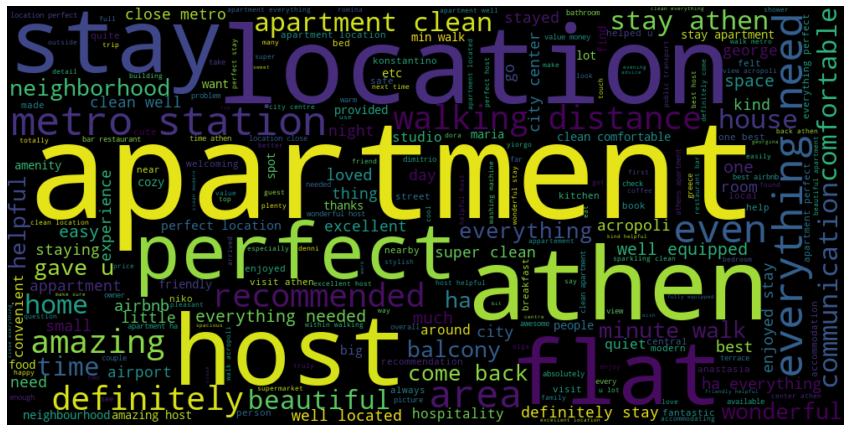

In [ ]:
# Top 20% comments
plt.figure(figsize = (15, 15))
WC = WordCloud(width=1000,height=500,max_words=250,min_font_size=5)

# The syntax requires parameter as a body of text. 
text = ' '.join(top_20_pct_low_reviews.loc[:, 'comments_clean'].values)
words = WC.generate(text)

plt.imshow(words,interpolation='bilinear')
plt.axis("off")
plt.show()

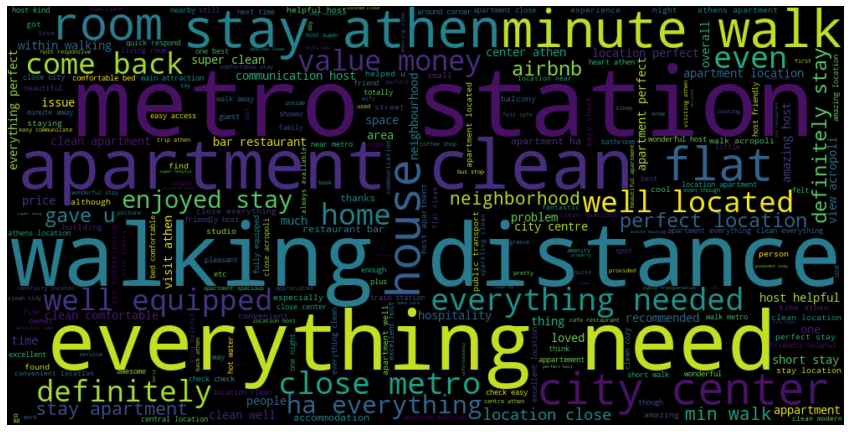

In [ ]:
# Others comments
plt.figure(figsize = (15, 15))
WC = WordCloud(width=1000,height=500,max_words=250,min_font_size=5)

# The syntax requires parameter as a body of text. 
text = ' '.join(low_price_reviews.loc[:, 'comments_clean'].values)
words = WC.generate(text)

plt.imshow(words,interpolation='bilinear')
plt.axis("off")
plt.show()

In [ ]:
# low_price_df.to_csv('low_price_df.csv')
# !cp low_price_df.csv "/content/drive/MyDrive/Colab Notebooks/Milestone Project"

In [ ]:
# other_low = low_price_df[low_price_df['is_top_20_pct'] == 'f']
# top_20_pct_low.to_csv('top_20_pct_low.csv')
# !cp top_20_pct_low.csv "/content/drive/MyDrive/Colab Notebooks/Milestone Project"

# other_low.to_csv('other_low.csv')
# !cp other_low.csv "/content/drive/MyDrive/Colab Notebooks/Milestone Project"

In [ ]:
# top_20_pct_low_reviews.to_csv('top_20_pct_low_reviews.csv')
# !cp top_20_pct_low_reviews.csv "/content/drive/MyDrive/Colab Notebooks/Milestone Project"

# low_price_reviews.to_csv('low_price_reviews.csv')
# !cp low_price_reviews.csv "/content/drive/MyDrive/Colab Notebooks/Milestone Project"

# Conclusions

**Reactions**

As it can be seen, hosts in general, not just the top 20% are expected to always respond and respond immediately, specifically within an hour. There are still some flexibility in response time, but the top 20% group latest reply should be within a day as oppose to several days like the other group

The top 20% group is very strict with their response rate as well as acceptance rate since both remains nearly 100%, even the lower whisker is close to the 100% mark. While the other group have lower whisker as low as 90% and 80% respectively

**Checkin**

The range of checkin score of the top 20% is extremely tight compare to that of the other group, nearly at 5, even the lower whisker is very close to 5. This could indicate that hosts in the top 20% group put great importance in checkin flexibility and provide easy check in for the customers with various checkin methods

**Communication**

Similar to checkin score, communication score range is also extremely tight, with lower whisker nearly at maximum score. This further reinforce the findings above where top 20% hosts need to reply within 1 hour and always reply. But that is not all, this could also regard to any form of communications during the staying of customer

**Minimum nights flexibility**

The top 20% group tend to offer greater staying flexibility compare to the other group, since the upper whisker of the top 20% group only reach as far as over 2 nights, while the upper whisker of the other group can reach as high as over 5 nights of minimum staying time

**Locations**

In terms of listings location, there are several differences among the top 5 locations in both groups. Specfically, listings from both group tends to favour Neos Kosmos, Mousio-Exarcheia-Neapoli and Emporiko-Trigono-Plaka. The difference is top 20% include, Petralona and Koukaki-Makrygianni

**Description**

All: Fully equipped, metro station

Top 20%: Apartment, studio, balcony, modern, one

Generally speaking besides having a fully equipped listings that near a metro station. Based on the differences in description between the 2 groups’ customers. Specifically, it seems that customers from the top 20% group prefer a small studio apartment with a modern design in a quiet location, and maybe enough for one bed or person

**Description (Top 5 neighborhoods)**

Listings in the top 5 neighborhood can have some distinct keywords to their description

Neos Kosmos + Koukaki-Makrygianni: At Neos Kosmos and Koukaki-Makrygianni, hosts can introduce nearby note-worthy coffee shops, restaurants to visitors through the description

Petralona: Or at Petralona, in addition to modern designed, if apartment has been renovated recently, then put it in the description

Emporiko Trigono-Plaka: As for Emporiko Trigono-Plaka, Syntagma square seems to be the more sought after attraction for tourists and visitors, and thus, should captured attention when placed in description

**Comments**
All: Metro station, everything need

Top 20%: Host

In terms of customer feedbacks, for the most part, both group does successfully provide customers with mostly everything needed, and successfully introduce them to the metro station. 

One noticeable difference is that feedbacks of the top 20% group constantly mention the word 'host'. Which implies the importance of the host in differentiate the top 20% group and the others group

This fact also reinforce the findings above involve reaction time, as well as communications and checkin score. Indicate that as a host, customers expected them to be responsive in communication as well as flexible in ensuring customer arrival is as smooth as possible